In [1]:
import pandas as pd
from pathlib import Path
import sys
import matplotlib.pyplot as plt
# Add the parent directory (repo root) to Python path
repo_root = Path.cwd().parent  # Goes up from notebooks to repo root
sys.path.insert(0, str(repo_root))

# Now you can import from the src directory
from src.cell_track_analysis.utils import extract_wells_info

# NK preds

In [31]:
df = pd.read_csv('/mnt/data/NK_preds.csv')

In [58]:
df['label']

0          2
1          2
2          2
3          2
4          2
          ..
4662911    1
4662912    2
4662913    1
4662914    0
4662915    0
Name: label, Length: 4662916, dtype: int64

In [5]:
df.experiment

0          /mnt/data/2024-10-08-zkorwek--live
1          /mnt/data/2024-10-08-zkorwek--live
2          /mnt/data/2024-10-08-zkorwek--live
3          /mnt/data/2024-10-08-zkorwek--live
4          /mnt/data/2024-10-08-zkorwek--live
                          ...                
4662911    /mnt/data/2024-11-26-zkorwek--live
4662912    /mnt/data/2024-11-26-zkorwek--live
4662913    /mnt/data/2024-11-26-zkorwek--live
4662914    /mnt/data/2024-11-26-zkorwek--live
4662915    /mnt/data/2024-11-26-zkorwek--live
Name: experiment, Length: 4662916, dtype: object

In [32]:
wells_info = []
for exp in df.experiment.unique():
    wells_info.append(extract_wells_info(exp))

In [33]:
wells_info = pd.concat(wells_info)


In [ ]:
wells_info['well'] = wells_info['WellId'].apply(int)
df = df.merge(wells_info, on=['well', 'experiment'])

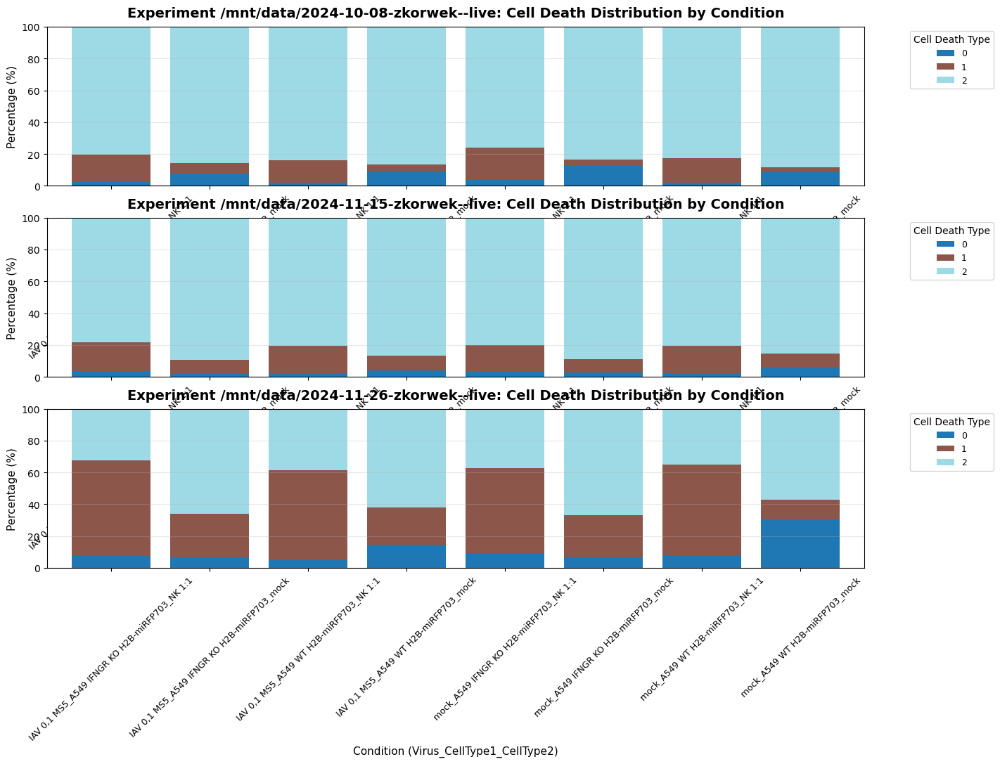

In [10]:
import matplotlib.pyplot as plt
# Get unique experiments
experiments = sorted(df['experiment'].unique())
n_experiments = len(experiments)

# Create figure with subplots for each experiment
fig, axes = plt.subplots(n_experiments, 1, figsize=(15, 10))

# Handle single experiment case
if n_experiments == 1:
    axes = [axes]

# Process each experiment separately (memory efficient)
for idx, exp in enumerate(experiments):
    # Filter data for this experiment only
    exp_data = df[df['experiment'] == exp]
    
    # Create condition column: Virus_CellType1_CellType2
    exp_data = exp_data.copy()
    exp_data['condition'] = (exp_data['Virus'].astype(str) + '_' + 
                                exp_data['CellType1'].astype(str) + '_' + 
                                exp_data['CellType2'].astype(str))
    
    # Count cell death types per condition (aggregation reduces memory)
    counts = exp_data.groupby(['condition', 'label']).size().reset_index(name='count')
    
    # Calculate percentages
    totals = counts.groupby('condition')['count'].sum()
    counts['percentage'] = counts.apply(
        lambda row: (row['count'] / totals[row['condition']]) * 100, 
        axis=1
    )
    
    # Pivot for plotting
    pivot_data = counts.pivot(index='condition', columns='label', values='percentage')
    pivot_data = pivot_data.fillna(0)
    
    # Sort conditions alphabetically
    pivot_data = pivot_data.sort_index()
    
    # Create stacked barplot
    pivot_data.plot(kind='bar', stacked=True, ax=axes[idx], 
                    colormap='tab20', width=0.8)
    
    axes[idx].set_title(f'Experiment {exp}: Cell Death Distribution by Condition', 
                        fontsize=14, fontweight='bold', pad=10)
    axes[idx].set_xlabel('Condition (Virus_CellType1_CellType2)', fontsize=11)
    axes[idx].set_ylabel('Percentage (%)', fontsize=11)
    axes[idx].legend(title='Cell Death Type', bbox_to_anchor=(1.05, 1), 
                    loc='upper left', fontsize=9)
    axes[idx].set_ylim(0, 100)
    axes[idx].tick_params(axis='x', rotation=45, labelsize=9)
    
    # Add grid for better readability
    axes[idx].yaxis.grid(True, alpha=0.3)
    
    # Clean up to free memory
    del exp_data, counts, pivot_data

#plt.tight_layout()

In [16]:
df.CellType1.unique()

array(['A549 WT H2B-miRFP703', 'A549 IFNGR KO H2B-miRFP703'], dtype=object)

In [17]:
df.CellType2.unique()

array(['mock', 'NK 1:1'], dtype=object)

In [18]:
df.Virus.unique()

array(['mock', 'IAV 0,1 MS5'], dtype=object)

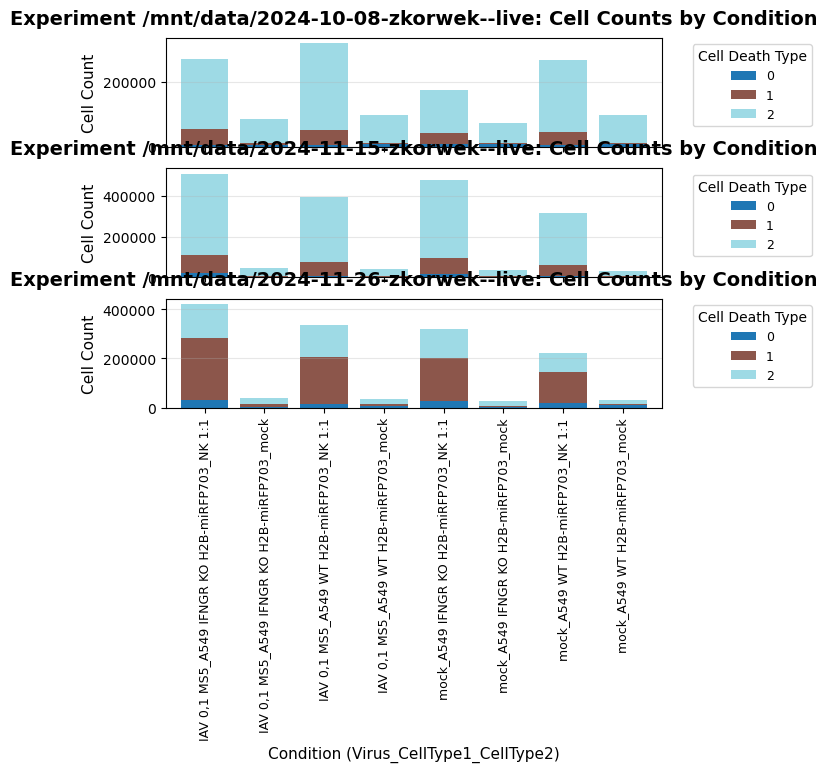

In [21]:
experiments = sorted(df['experiment'].unique())
n_experiments = len(experiments)
fig, axes = plt.subplots(n_experiments, 1, sharex=True)


for idx, exp in enumerate(experiments):
    exp_data = df[df['experiment'] == exp].copy()
    exp_data['condition'] = (exp_data['Virus'].astype(str) + '_' + 
                                exp_data['CellType1'].astype(str) + '_' + 
                                exp_data['CellType2'].astype(str))
    
    counts = exp_data.groupby(['condition', 'label']).size().reset_index(name='count')
    pivot_data = counts.pivot(index='condition', columns='label', values='count')
    pivot_data = pivot_data.fillna(0).sort_index()
    
    pivot_data.plot(kind='bar', stacked=True, ax=axes[idx], 
                    colormap='tab20', width=0.8)
    
    axes[idx].set_title(f'Experiment {exp}: Cell Counts by Condition', 
                        fontsize=14, fontweight='bold', pad=10)
    axes[idx].set_xlabel('Condition (Virus_CellType1_CellType2)', fontsize=11)
    axes[idx].set_ylabel('Cell Count', fontsize=11)
    axes[idx].legend(title='Cell Death Type', bbox_to_anchor=(1.05, 1), 
                    loc='upper left', fontsize=9)
    axes[idx].tick_params(axis='x', rotation=90, labelsize=9)
    axes[idx].yaxis.grid(True, alpha=0.3)
    
    del exp_data, counts, pivot_data



In [47]:
df['label_bin'] = df['label']==1

<Axes: >

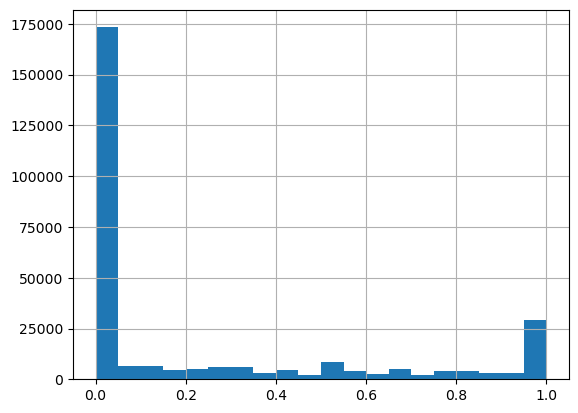

In [50]:
df.groupby(['experiment', 'well', 'track_index'])['label_bin'].mean().hist(bins=20)

In [ ]:
df.groupby(['experiment', 'well', 'track_index']).plot(x='time_point_index', y='label')

In [25]:
df.CellType2.unique()

array(['mock', 'NK 1:1'], dtype=object)

NK 1:1: 4030 tracks
mock: 647 tracks


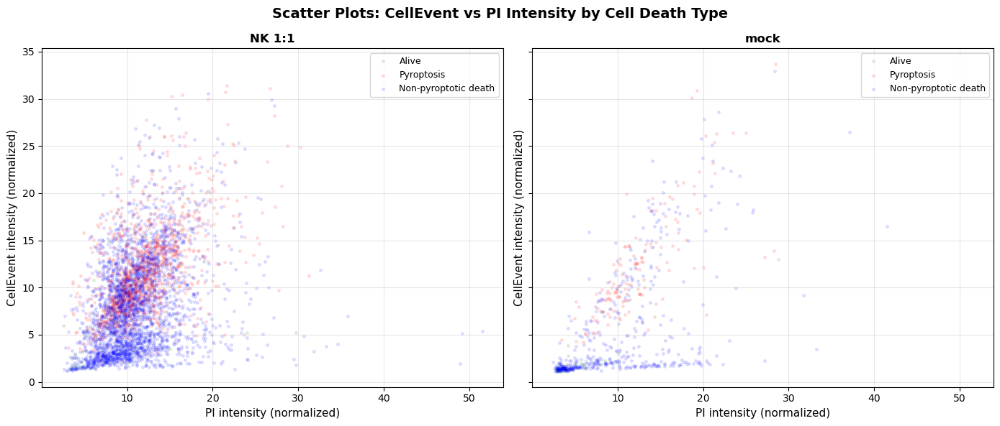

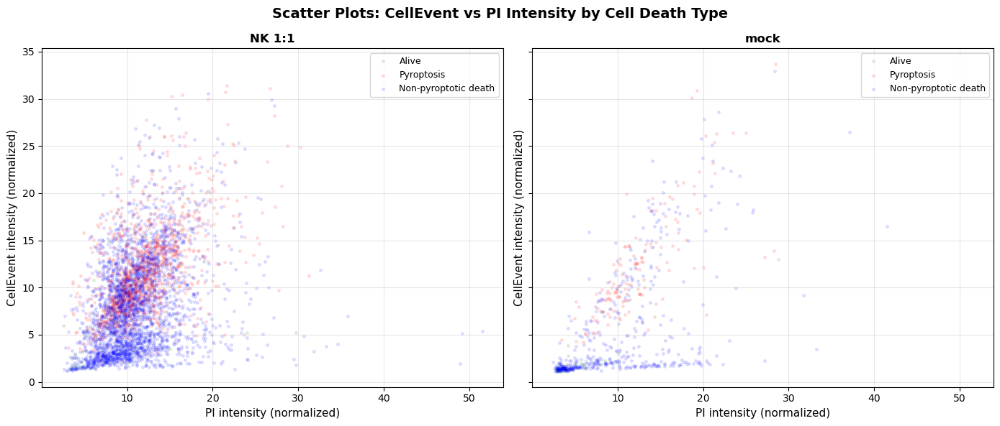

In [39]:
def plot_ce_pi(df):
    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)
    
    # Define subsets
    NK = df[(df['Virus']=='IAV 0,1 MS5') & 
            (df['CellType1']=='A549 WT H2B-miRFP703') & 
            (df['CellType2']=='NK 1:1')]
    
    mock = df[(df['Virus']=='IAV 0,1 MS5') & 
              (df['CellType1']=='A549 WT H2B-miRFP703') & 
              (df['CellType2']=='mock')]
    
    # Create list of dataframes and corresponding parameters
    df_list = [NK, mock]
    plot_labels = ['NK 1:1', 'mock']
    
    # Define colors for different cell death types
    label_colors = {
        0: 'green',      # alive
        1: 'red',        # pyroptosis
        2: 'blue',     # non-pyroptotic death
    }
    
    label_names = {
        0: 'Alive',
        1: 'Pyroptosis',
        2: 'Non-pyroptotic death',
    }
    
    # Loop through subsets
    for ax, subset_df, plot_label in zip(axes, df_list, plot_labels):
        # Calculate track properties
        subset_df = subset_df.copy()
        subset_df["track_length"] = subset_df.groupby(["track_index", "well"])["time_point_index"].transform("count")
        subset_df["track_start"] = subset_df.groupby(["track_index", "well"])["time_point_index"].transform("min")
        
        # Filter tracks
        filtered_df = subset_df[(subset_df['track_start'] != 0) & 
                                (subset_df['track_length'] > 20)]
        
        # Aggregate intensities but keep label information
        subset = (
            filtered_df.groupby(["track_index"])
            .agg({
                'pi_intensity_mean': 'max',
                'ce_intensity_mean': 'max',
                'pi_intensity_mean_img': 'max',
                'ce_intensity_mean_img': 'max',
                'label': 'first'  # Keep the label for each track
            })
            .reset_index()
        )
        
        print(f"{plot_label}: {len(subset)} tracks")
        
        # Get unique labels in this subset
        unique_labels = sorted(subset['label'].unique())
        
        # Plot each label type with different color
        for death_label in unique_labels:
            subset_label = subset[subset['label'] == death_label]
            
            # Get color for this label
            color = label_colors.get(death_label, 'gray')
            name = label_names.get(death_label, f'Label {death_label}')
            
            ax.scatter(
                subset_label['pi_intensity_mean'] / subset_label['pi_intensity_mean_img'],
                subset_label['ce_intensity_mean'] / subset_label['ce_intensity_mean_img'],
                alpha=0.1,
                color=color,
                s=7,  # marker size
                label=name
            )
        
        ax.set_title(f"{plot_label}", fontsize=12, fontweight='bold')
        ax.set_xlabel("PI intensity (normalized)", fontsize=11)
        ax.set_ylabel("CellEvent intensity (normalized)", fontsize=11)
        ax.grid(True, alpha=0.3)
        ax.legend(loc='best', fontsize=9, framealpha=0.8)
    
    plt.suptitle("Scatter Plots: CellEvent vs PI Intensity by Cell Death Type", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return fig

plot_ce_pi(df[df['experiment']=='/mnt/data/2024-10-08-zkorwek--live'])

NK 1:1: 16079 tracks
mock: 8529 tracks


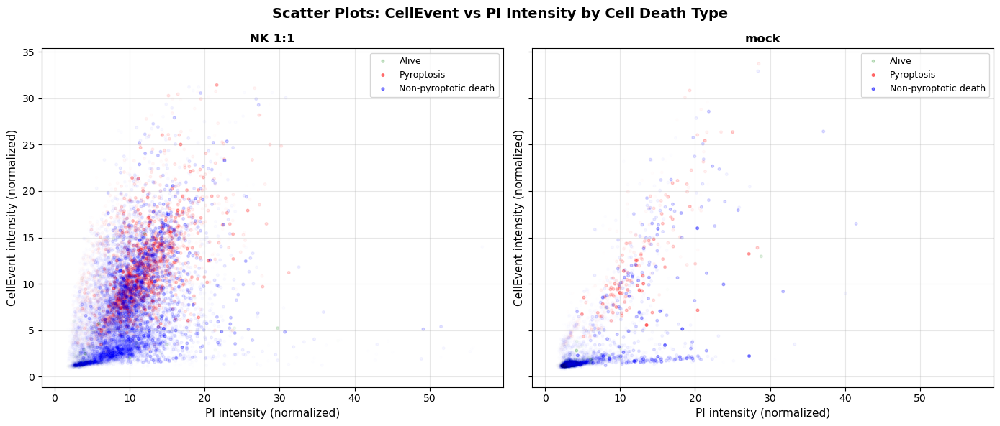

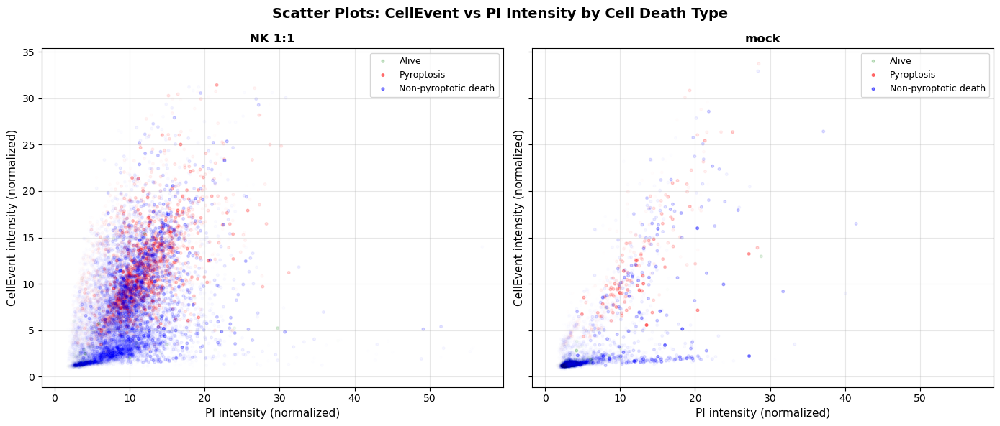

In [42]:
def plot_ce_pi(df):
    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)
    
    # Define subsets
    NK = df[(df['Virus']=='IAV 0,1 MS5') & 
            (df['CellType1']=='A549 WT H2B-miRFP703') & 
            (df['CellType2']=='NK 1:1')]
    
    mock = df[(df['Virus']=='IAV 0,1 MS5') & 
              (df['CellType1']=='A549 WT H2B-miRFP703') & 
              (df['CellType2']=='mock')]
    
    # Create list of dataframes and corresponding parameters
    df_list = [NK, mock]
    plot_labels = ['NK 1:1', 'mock']
    
    # Define colors for different cell death types
    label_colors = {
        0: 'green',      # alive
        1: 'red',        # pyroptosis
        2: 'blue',     # non-pyroptotic death
    }
    
    label_names = {
        0: 'Alive',
        1: 'Pyroptosis',
        2: 'Non-pyroptotic death',
    }
    
    # Loop through subsets
    for ax, subset_df, plot_label in zip(axes, df_list, plot_labels):
        # Calculate track properties
        subset_df = subset_df.copy()
        subset_df["track_length"] = subset_df.groupby(["track_index", "well"])["time_point_index"].transform("count")
        subset_df["track_start"] = subset_df.groupby(["track_index", "well"])["time_point_index"].transform("min")
        
        # Filter tracks
        filtered_df = subset_df[(subset_df['track_start'] != 0)]
        
        # Aggregate intensities but keep label information
        subset = (
            filtered_df.groupby(["track_index"])
            .agg({
                'pi_intensity_mean': 'max',
                'ce_intensity_mean': 'max',
                'pi_intensity_mean_img': 'max',
                'ce_intensity_mean_img': 'max',
                'label': 'first',  # Keep the label for each track
                'track_length': 'mean',
            })
            .reset_index()
        )
        
        print(f"{plot_label}: {len(subset)} tracks")
        
        # Get unique labels in this subset
        unique_labels = sorted(subset['label'].unique())
        
        # Plot each label type with different color
        for death_label in unique_labels:
            subset_label = subset[subset['label'] == death_label]
            
            # Get color for this label
            color = label_colors.get(death_label, 'gray')
            name = label_names.get(death_label, f'Label {death_label}')
            
            ax.scatter(
                subset_label['pi_intensity_mean'] / subset_label['pi_intensity_mean_img'],
                subset_label['ce_intensity_mean'] / subset_label['ce_intensity_mean_img'],
                alpha=subset_label['track_length']/610,
                color=color,
                s=7,  # marker size
                label=name
            )
        
        ax.set_title(f"{plot_label}", fontsize=12, fontweight='bold')
        ax.set_xlabel("PI intensity (normalized)", fontsize=11)
        ax.set_ylabel("CellEvent intensity (normalized)", fontsize=11)
        ax.grid(True, alpha=0.3)
        ax.legend(loc='best', fontsize=9, framealpha=0.8)
    
    plt.suptitle("Scatter Plots: CellEvent vs PI Intensity by Cell Death Type", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return fig

plot_ce_pi(df[df['experiment']=='/mnt/data/2024-10-08-zkorwek--live'])

<Axes: >

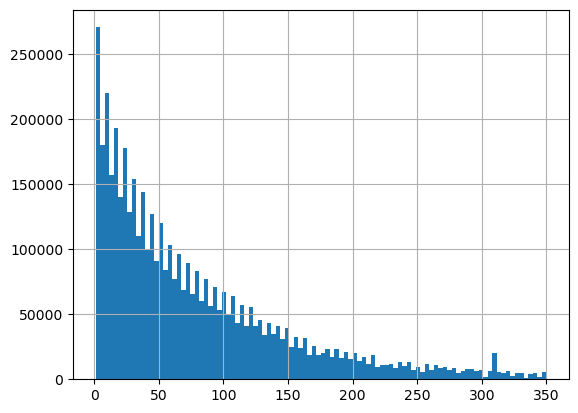

In [38]:
df['track_length'].hist(bins=100)

NK 1:1: 18295 tracks
mock: 2228 tracks


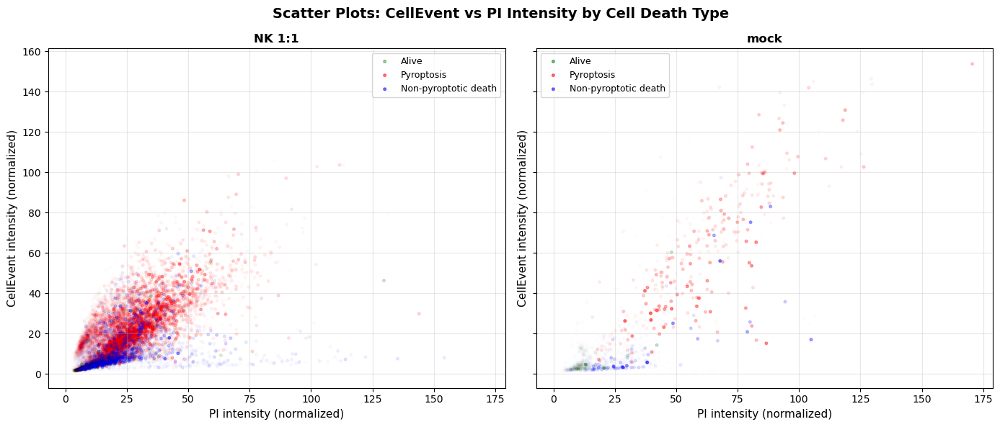

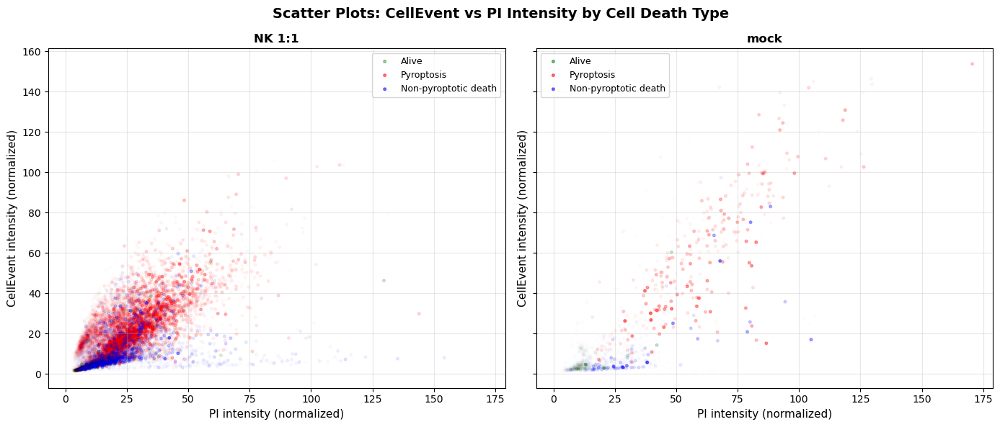

In [ ]:
plot_ce_pi(df[df['experiment']=='/mnt/data/2024-11-26-zkorwek--live'])

NK 1:1: 23107 tracks
mock: 1687 tracks


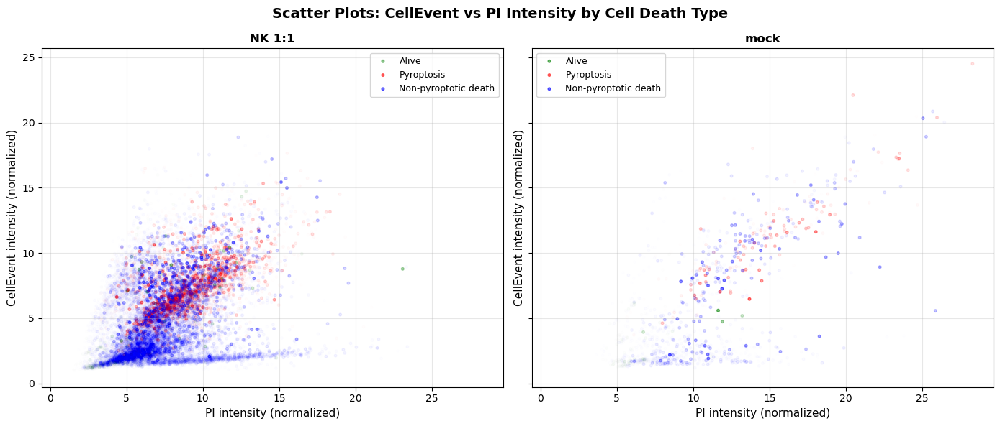

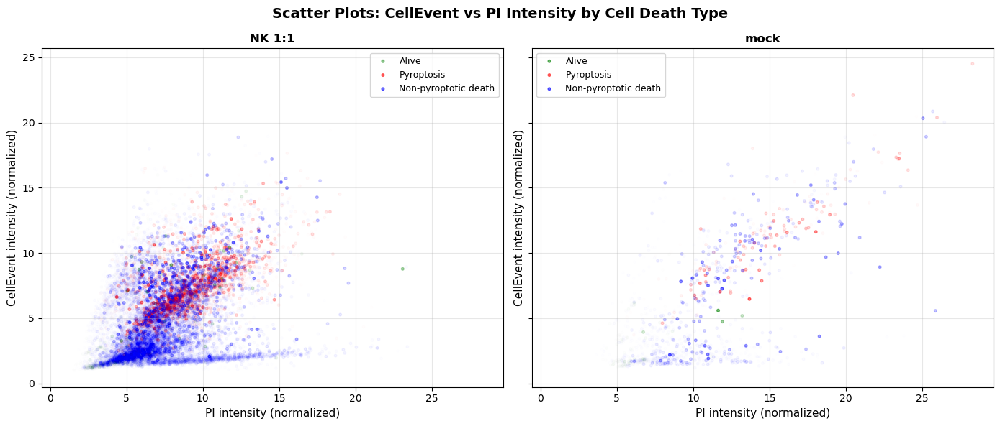

In [45]:
plot_ce_pi(df[df['experiment']=='/mnt/data/2024-11-15-zkorwek--live'])

In [22]:
import numpy as np
def plot_random_track_labels(df, n_tracks=20, min_length=20, figsize=(16, 10)):
    """
    Visualize label profiles over time for random tracks.
    
    Parameters:
    -----------
    df : pandas DataFrame
        Must contain: experiment, well, track_index, time_point_index, label
    n_tracks : int
        Number of random tracks to plot
    min_length : int
        Minimum track length to consider
    figsize : tuple
        Figure size (width, height)
    """
    
    # Calculate track lengths
    df_copy = df.copy()
    df_copy['track_length'] = df_copy.groupby(['experiment', 'well', 'track_index'])['time_point_index'].transform('count')
    
    # Filter tracks longer than min_length
    long_tracks = df_copy[df_copy['track_length'] > min_length]
    
    # Get unique track identifiers
    track_ids = long_tracks.groupby(['experiment', 'well', 'track_index']).size().reset_index(name='count')
    
    print(f"Total tracks longer than {min_length}: {len(track_ids)}")
    
    # Randomly sample tracks
    if len(track_ids) > n_tracks:
        sampled_tracks = track_ids.sample(n=n_tracks, random_state=42)
    else:
        sampled_tracks = track_ids
        print(f"Only {len(track_ids)} tracks available, plotting all of them")
    
    # Define colors and labels
    label_colors = {
        0: 'green',
        1: 'red',
        2: 'orange',
    }
    
    label_names = {
        0: 'Alive',
        1: 'Pyroptosis',
        2: 'Non-pyroptotic death',
    }
    
    # Calculate grid dimensions
    n_cols = 4
    n_rows = int(np.ceil(len(sampled_tracks) / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, sharex=False, sharey=True)
    axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes
    
    # Plot each track
    for idx, (_, track_info) in enumerate(sampled_tracks.iterrows()):
        if idx >= len(axes):
            break
            
        exp = track_info['experiment']
        well = track_info['well']
        track_idx = track_info['track_index']
        
        # Get data for this track
        track_data = long_tracks[
            (long_tracks['experiment'] == exp) & 
            (long_tracks['well'] == well) & 
            (long_tracks['track_index'] == track_idx)
        ].sort_values('time_point_index')
        
        ax = axes[idx]
        
        # Plot label over time with color coding
        '''for label_val in sorted(track_data['label'].unique()):
            label_subset = track_data[track_data['label'] == label_val]
            color = label_colors.get(label_val, 'gray')
            name = label_names.get(label_val, f'Label {label_val}')
            
            ax.scatter(
                label_subset['time_point_index'],
                label_subset['label'],
                color=color,
                s=20,
                alpha=0.7,
                label=name
            )'''
        
        # Connect points with a line
        ax.plot(
            track_data['time_point_index'],
            track_data['label'],
            color='gray',
            alpha=0.3,
            linewidth=1,
            zorder=0
        )
        
        ax.set_title(f'Exp {exp}, Well {well}\nTrack {track_idx}', fontsize=9)
        ax.set_xlabel('Time point', fontsize=8)
        ax.set_ylabel('Label', fontsize=8)
        #ax.set_yticks([0, 1, 2])
        #ax.set_yticklabels(['0\n(Alive)', '1\n(Pyro)', '2\n(Other)'], fontsize=7)
        ax.grid(True, alpha=0.3)
        ax.tick_params(labelsize=8)
        
        # Add legend only to first subplot
        if idx == 0:
            ax.legend(loc='best', fontsize=7, framealpha=0.8)
    
    # Hide unused subplots
    for idx in range(len(sampled_tracks), len(axes)):
        axes[idx].set_visible(False)
    
    plt.suptitle(f'Label Profiles Over Time for {len(sampled_tracks)} Random Tracks (length > {min_length})', 
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return fig


def plot_track_labels_by_condition(df, experiment, virus, celltype1, celltype2, 
                                   n_tracks=12, min_length=20, figsize=(16, 10)):
    """
    Plot tracks for a specific experimental condition.
    
    Parameters:
    -----------
    df : pandas DataFrame
    experiment : str or int
        Experiment identifier
    virus : str
        Virus condition
    celltype1 : str
        CellType1 condition
    celltype2 : str
        CellType2 condition
    n_tracks : int
        Number of tracks to plot
    min_length : int
        Minimum track length
    figsize : tuple
        Figure size
    """
    
    # Filter by condition
    condition_df = df[
        (df['experiment'] == experiment) &
        (df['Virus'] == virus) &
        (df['CellType1'] == celltype1) &
        (df['CellType2'] == celltype2)
    ]
    
    print(f"\nCondition: Exp {experiment}, {virus}, {celltype1}, {celltype2}")
    print(f"Total cells in condition: {len(condition_df)}")
    
    # Plot random tracks from this condition
    fig = plot_random_track_labels(condition_df, n_tracks=n_tracks, 
                                   min_length=min_length, figsize=figsize)
    
    return fig

fig = plot_track_labels_by_condition(
     df, 
     experiment='/mnt/data/2024-11-15-zkorwek--live',
     virus='IAV 0,1 MS5',
     celltype1='A549 WT H2B-miRFP703',
     celltype2='NK 1:1',
     n_tracks=12,
     min_length=20
)

KeyError: 'experiment'

# Gasdermin and NKs

In [2]:
path = '/mnt/nas/public/pkaczyns/2025-09-09-wprus/live'
wells_info = extract_wells_info(path)

In [3]:

df = pd.read_csv('/home/pkaczyns/Documents/pyroptosis-annotation/classification/gasdermin_binary_tracks.csv')#/mnt/nas/public/pkaczyns/2025-09-09-wprus/live/labeled_tracks.csv')

In [4]:
import numpy as np
df['label'] = df.apply(lambda x: np.exp(x['label1'])/(np.exp(x['label0'])+np.exp(x['label1'])), axis=1)
df['well'] = df['well'].apply(lambda x: '0'+str(x))
df = df.merge(wells_info, on=['well'], how='left')

df['condition'] = (df['Compound'].astype(str) + '_' + 
                            df['Cell Type'].astype(str))

In [30]:
df

,Unnamed: 0,track_index,time_point_index,nucleus_id,area,area_masked,eccentricity,is_toggled,center_x,center_y,...,y,label0,label1,label,,,Cell Type,Compound,experiment_y,condition
0,0,0,0,13,391.0,0.0,0.092,0,4201.59,5166.96,...,5166,0.604537,-3.420350,0.017552,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
1,1,0,1,15,397.5,0.0,0.099,0,4191.99,5165.12,...,5165,0.772186,-3.596691,0.012507,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
2,2,0,2,14,386.0,0.0,0.095,0,4190.54,5166.97,...,5166,0.673812,-3.405523,0.016637,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
3,3,0,3,13,383.0,0.0,0.094,0,4190.23,5168.33,...,5168,0.738453,-3.467616,0.014686,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
4,4,0,4,13,389.0,0.0,0.098,0,4190.64,5169.09,...,5169,0.744007,-3.440415,0.015003,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1795059,240803,13287,23,1615,22.0,0.0,0.200,0,3072.00,4300.00,...,4300,1.965307,-8.064411,0.000044,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO
1795060,240804,13288,10,1492,65.0,0.0,0.034,0,4498.21,3493.48,...,3493,2.292460,-7.380602,0.000063,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO
1795061,240805,13289,51,2030,26.0,0.0,0.234,0,245.00,1271.00,...,1271,2.395860,-6.044898,0.000216,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO
1795062,240806,13290,28,1792,16.5,0.0,0.120,0,3057.89,1752.66,...,1752,2.679056,-7.489813,0.000038,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO


In [39]:
df[df['label']>0.5].condition.value_counts()

condition
IAV MS4 MOI 1_A549 GasE KO     30074
IAV MS4 MOI 1_A549 GasD KO     25102
IAV MS4 MOI 1_A549WT           21768
pIC 0,1_A549 GasE KO            9132
pIC 0,1_A549 GasD KO            8735
pIC 0,1_A549WT                  8209
Cisplatin 10uM_A549 GasD KO     3887
Cisplatin 10uM_A549 GasE KO     3642
mock_A549WT                     2647
NK 1:1_A549 GasD KO             2540
Cisplatin 10mM_A549WT           2332
mock_A549 GasE KO               1846
NK 1:1_A549WT                   1671
mock_A549 GasD KO               1242
NK 1:1_A549 GasE KO             1084
Name: count, dtype: int64

In [44]:
dfbin = pd.read_csv('/mnt/nas/public/pkaczyns/2025-09-09-wprus/live/binary_tracks.csv')
dfbin['well'] = dfbin['well'].apply(lambda x: '0'+str(x))
dfbin = dfbin.merge(wells_info, on=['well'], how='left')

dfbin['condition'] = (dfbin['Compound'].astype(str) + '_' + 
                            dfbin['Cell Type'].astype(str))

In [45]:
import numpy as np
dfbin['label'] = dfbin.apply(lambda x: 1-np.exp(x['label0'])/(np.exp(x['label0'])+np.exp(x['label1'])), axis=1)

<Axes: >

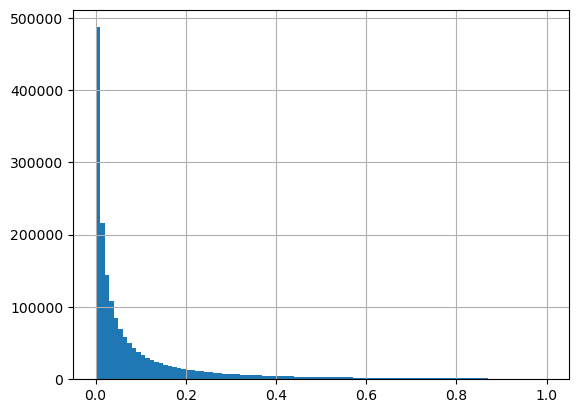

In [7]:
dfbin.label.hist(bins=100)

condition
Cisplatin 10mM_A549WT          Axes(0.125,0.11;0.775x0.77)
Cisplatin 10uM_A549 GasD KO    Axes(0.125,0.11;0.775x0.77)
Cisplatin 10uM_A549 GasE KO    Axes(0.125,0.11;0.775x0.77)
IAV MS4 MOI 1_A549 GasD KO     Axes(0.125,0.11;0.775x0.77)
IAV MS4 MOI 1_A549 GasE KO     Axes(0.125,0.11;0.775x0.77)
IAV MS4 MOI 1_A549WT           Axes(0.125,0.11;0.775x0.77)
NK 1:1_A549 GasD KO            Axes(0.125,0.11;0.775x0.77)
NK 1:1_A549 GasE KO            Axes(0.125,0.11;0.775x0.77)
NK 1:1_A549WT                  Axes(0.125,0.11;0.775x0.77)
mock_A549 GasD KO              Axes(0.125,0.11;0.775x0.77)
mock_A549 GasE KO              Axes(0.125,0.11;0.775x0.77)
mock_A549WT                    Axes(0.125,0.11;0.775x0.77)
pIC 0,1_A549 GasD KO           Axes(0.125,0.11;0.775x0.77)
pIC 0,1_A549 GasE KO           Axes(0.125,0.11;0.775x0.77)
pIC 0,1_A549WT                 Axes(0.125,0.11;0.775x0.77)
Name: label, dtype: object

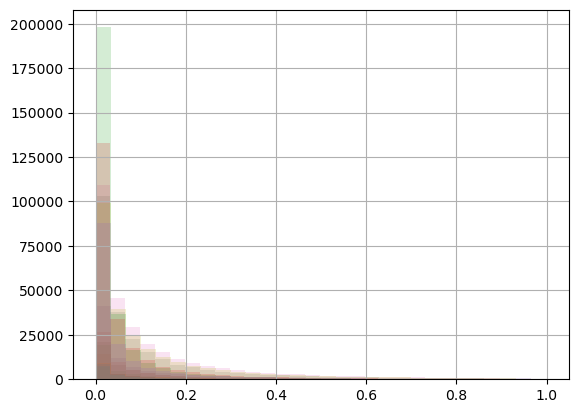

In [8]:
dfbin.groupby('condition')['label'].hist(bins=30, alpha=0.2)

<Figure size 800x1000 with 0 Axes>

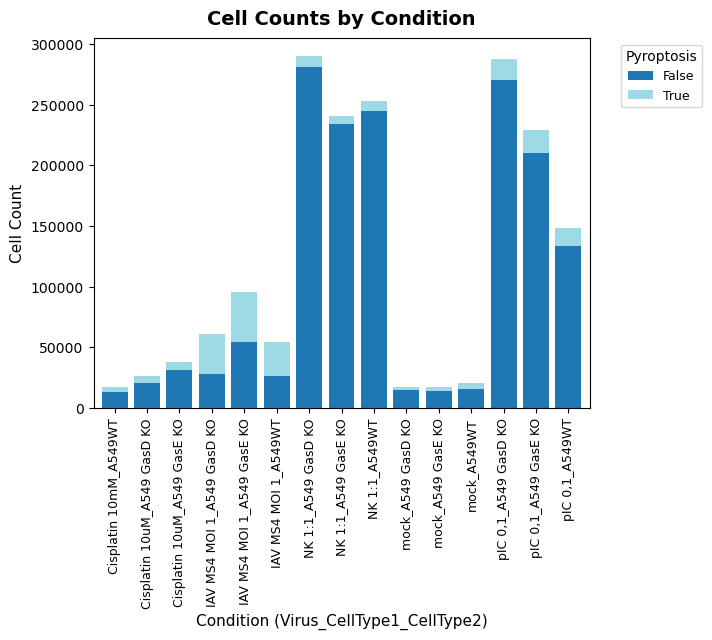

In [41]:
import matplotlib.pyplot as plt
# Create figure with subplots for each experiment
fig = plt.figure(figsize=(8, 10))
df['labelbin'] = df['label']>0.25
counts = df.groupby(['condition', 'labelbin']).size().reset_index(name='count')
pivot_data = counts.pivot(index='condition', columns='labelbin', values='count')
pivot_data = pivot_data.fillna(0).sort_index()

pivot_data.plot(kind='bar', stacked=True, colormap='tab20', width=0.8)

plt.title(f'Cell Counts by Condition', 
                    fontsize=14, fontweight='bold', pad=10)
plt.xlabel('Condition (Virus_CellType1_CellType2)', fontsize=11)
plt.ylabel('Cell Count', fontsize=11)
plt.legend(title='Pyroptosis', bbox_to_anchor=(1.05, 1), 
                loc='upper left', fontsize=9)
plt.tick_params(axis='x', rotation=90, labelsize=9)



<Figure size 800x1000 with 0 Axes>

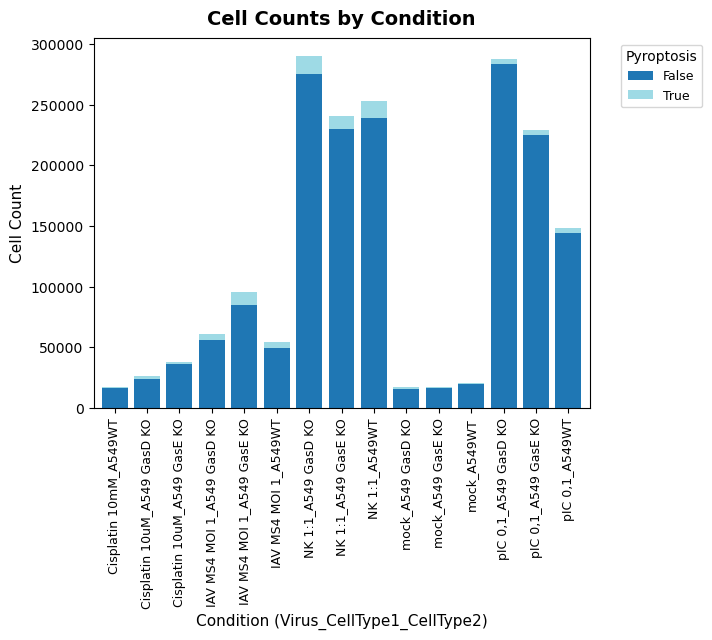

In [10]:
import matplotlib.pyplot as plt
# Create figure with subplots for each experiment
fig = plt.figure(figsize=(8, 10))
dfbin['labelbin'] = dfbin['label']>0.5
counts = dfbin.groupby(['condition', 'labelbin']).size().reset_index(name='count')
pivot_data = counts.pivot(index='condition', columns='labelbin', values='count')
pivot_data = pivot_data.fillna(0).sort_index()

pivot_data.plot(kind='bar', stacked=True, colormap='tab20', width=0.8)

plt.title(f'Cell Counts by Condition', 
                    fontsize=14, fontweight='bold', pad=10)
plt.xlabel('Condition (Virus_CellType1_CellType2)', fontsize=11)
plt.ylabel('Cell Count', fontsize=11)
plt.legend(title='Pyroptosis', bbox_to_anchor=(1.05, 1), 
                loc='upper left', fontsize=9)
plt.tick_params(axis='x', rotation=90, labelsize=9)



Total cells in condition: 287446
Total tracks longer than 30: 2875


/tmp/ipykernel_3841997/2482683055.py:110: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=7, framealpha=0.8)


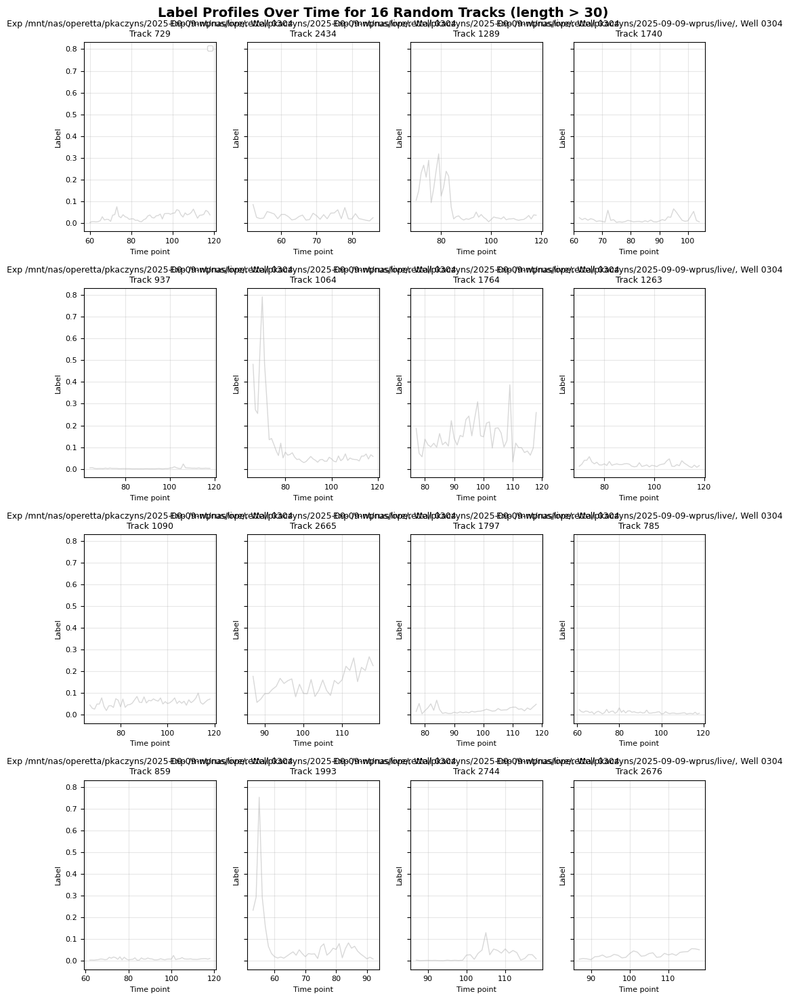

In [15]:

# Filter by condition
condition_df = dfbin[
     (dfbin['Compound'] == 'pIC 0,1') &
     (dfbin['Cell Type'] == 'A549 GasD KO')
].rename({'experiment_y': 'experiment'}, axis=1)


print(f"Total cells in condition: {len(condition_df)}")

# Plot random tracks from this condition
fig = plot_random_track_labels(condition_df, n_tracks=16, 
                              min_length=30, figsize=(10, 15))

<Axes: xlabel='Compound,Cell Type'>

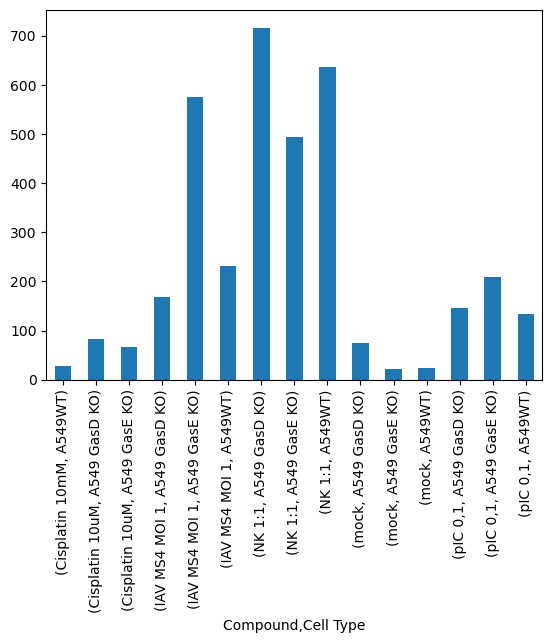

In [52]:
dfbin.groupby(['Compound', 'Cell Type', 'track_index'])['label'].apply(lambda x: sum(x > 0.5)>5).reset_index().groupby(['Compound', 'Cell Type'])['label'].sum().sort_index().plot.bar()

In [65]:
dfbin['Compound'].unique()

array(['mock', 'IAV MS4 MOI 1', 'pIC 0,1', 'Cisplatin 10mM', 'NK 1:1',
       'Cisplatin 10uM'], dtype=object)

/tmp/ipykernel_2686905/2116226474.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


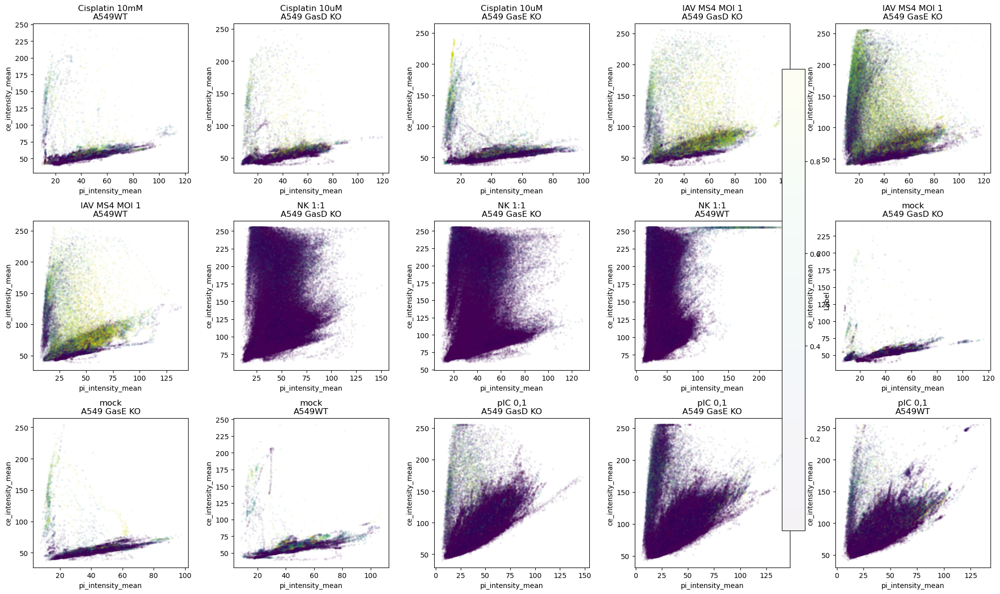

In [73]:
groups = df.groupby(['Compound', 'Cell Type'])

# Set up a grid for 15 subplots (adjust as needed)
n_groups = len(groups)
ncols = 5
nrows = (n_groups + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 12))
axes = axes.flatten()

for ax, ((compound, celltype), subdf) in zip(axes, groups):
    sc = ax.scatter(
        subdf['pi_intensity_mean'],
        subdf['ce_intensity_mean'],
        c=subdf['label'],
        cmap='viridis',
        alpha=0.05,
        s=1
    )
    ax.set_title(f'{compound}\n{celltype}')
    ax.set_xlabel('pi_intensity_mean')
    ax.set_ylabel('ce_intensity_mean')

# Add colorbar for label scale
fig.colorbar(sc, ax=axes.tolist(), label='Label')

# Hide any unused subplots
for ax in axes[len(groups):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

/tmp/ipykernel_2686905/3791480000.py:34: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


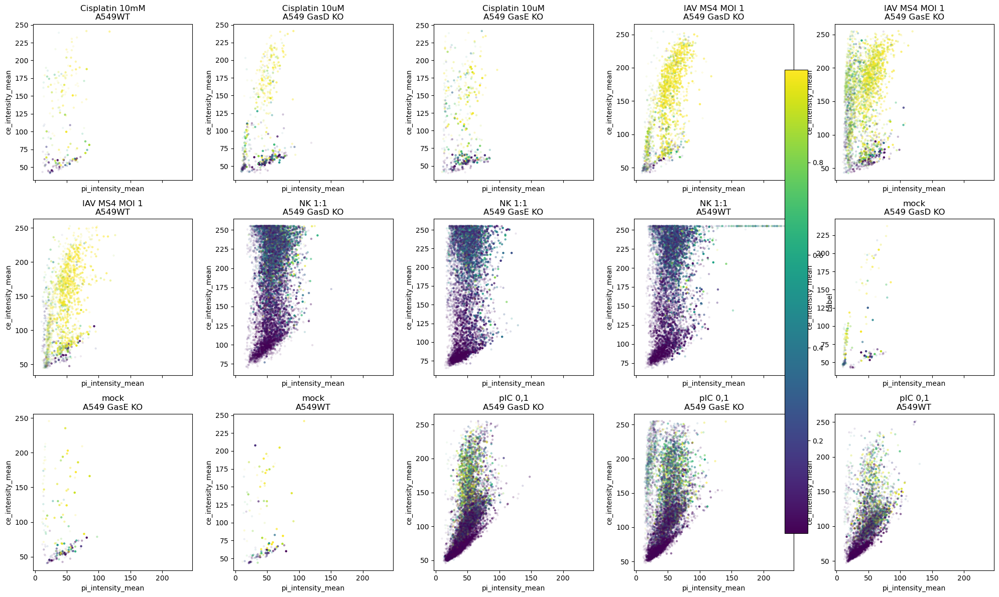

In [81]:
dfbin_filtered = df[df['track_length'] > 5].groupby(['Compound', 'Cell Type', 'track_index']).filter(lambda x: x['time_point_index'].min()!=0)
max_val = dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index']).max()
groups = max_val.groupby(['Compound', 'Cell Type'])

# Set up a grid for 15 subplots (adjust as needed)
n_groups = len(groups)
ncols = 5
nrows = (n_groups + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 12), sharex=True)
axes = axes.flatten()

for ax, ((compound, celltype), subdf) in zip(axes, groups):
    sc = ax.scatter(
        subdf['pi_intensity_mean'],
        subdf['ce_intensity_mean'],
        c=subdf['label'],
        cmap='viridis',
        alpha=subdf['track_length']/120,
        #alpha=0.3,
        s=5
    )
    ax.set_title(f'{compound}\n{celltype}')
    ax.set_xlabel('pi_intensity_mean')
    ax.set_ylabel('ce_intensity_mean')

# Add colorbar for label scale
fig.colorbar(sc, ax=axes.tolist(), label='Label')

# Hide any unused subplots
for ax in axes[len(groups):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

/tmp/ipykernel_2686905/3166266885.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


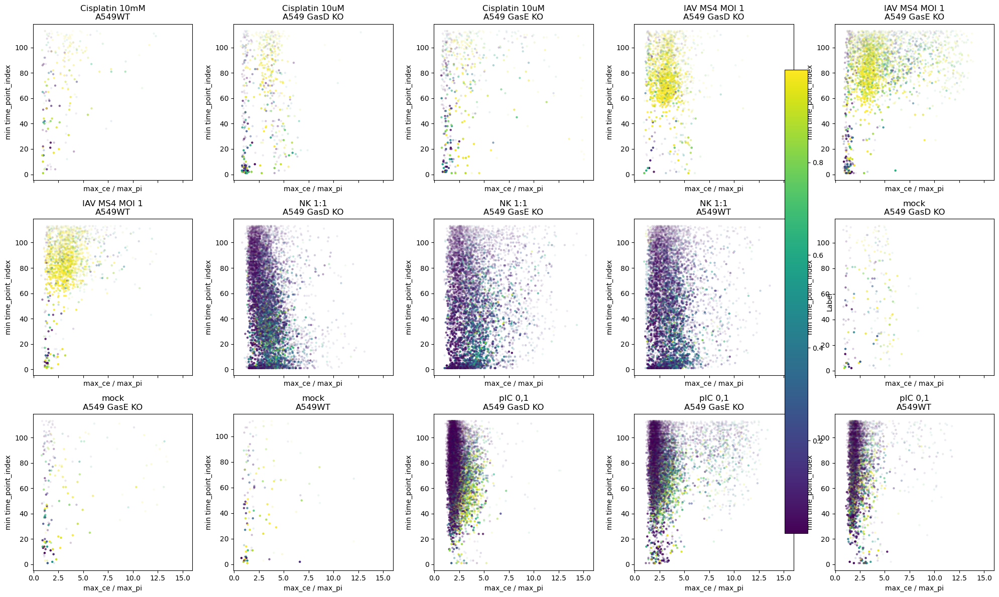

In [83]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter: only tracks longer than 5, and whose first time point is not 0
dfbin_filtered = df[df['track_length'] > 5].groupby(['Compound', 'Cell Type', 'track_index']).filter(
    lambda x: x['time_point_index'].min() != 0
)

# Compute maximum values for each track
max_val = dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index']).max()

# Compute the minimum time_point_index (start of each track)
min_time = dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index'])['time_point_index'].min().rename('min_time_point_index')

# Merge the start time back into the max_val DataFrame
max_val = max_val.merge(min_time, on=['Compound', 'Cell Type', 'track_index'])

# Compute ce/pi ratio at track maximum
max_val['ce_pi_ratio'] = max_val['ce_intensity_mean'] / max_val['pi_intensity_mean']

# Group by Compound and Cell Type
groups = max_val.groupby(['Compound', 'Cell Type'])

# Set up grid for 15 subplots
n_groups = len(groups)
ncols = 5
nrows = (n_groups + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 12), sharex=True)
axes = axes.flatten()

for ax, ((compound, celltype), subdf) in zip(axes, groups):
    sc = ax.scatter(
        subdf['ce_pi_ratio'],
        subdf['min_time_point_index'],
        c=subdf['label'],
        cmap='viridis',
        alpha=subdf['track_length'] / 120,  # scaled transparency
        s=5
    )
    ax.set_title(f'{compound}\n{celltype}')
    ax.set_xlabel('max_ce / max_pi')
    ax.set_ylabel('min time_point_index')

# Add colorbar for label scale
fig.colorbar(sc, ax=axes.tolist(), label='Label')

# Hide any unused subplots
for ax in axes[len(groups):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


/tmp/ipykernel_2686905/2440250736.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


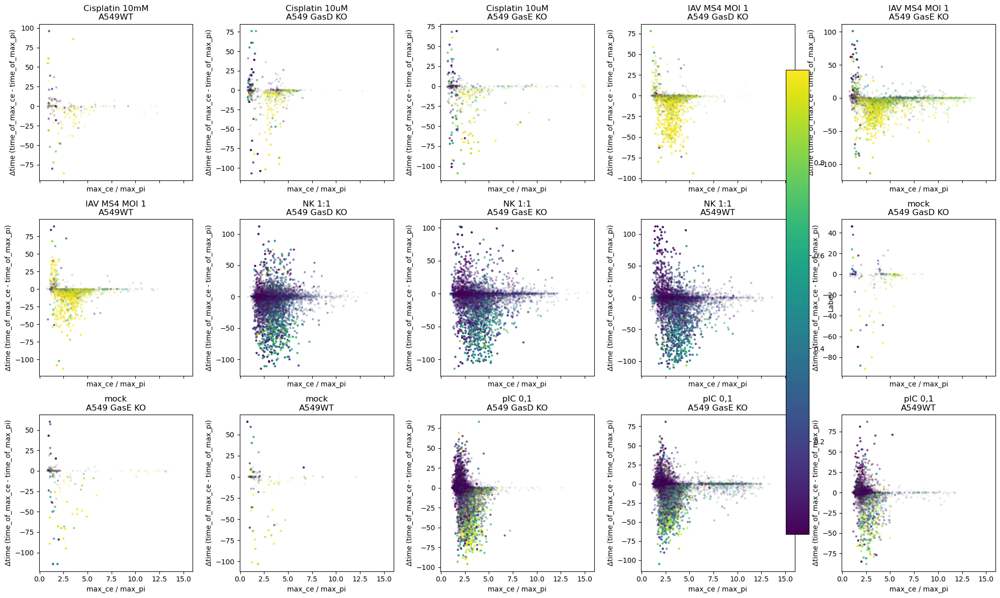

In [84]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter: only tracks longer than 5 and whose first time point is not 0
dfbin_filtered = df[df['track_length'] > 5].groupby(['Compound', 'Cell Type', 'track_index']).filter(
    lambda x: x['time_point_index'].min() != 0
)

# For each track, find the time_point_index of maximum CE and PI intensity
time_of_max_ce = (
    dfbin_filtered.loc[dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index'])['ce_intensity_mean'].idxmax(),
                       ['Compound', 'Cell Type', 'track_index', 'time_point_index']]
    .rename(columns={'time_point_index': 'time_of_max_ce'})
)
time_of_max_pi = (
    dfbin_filtered.loc[dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index'])['pi_intensity_mean'].idxmax(),
                       ['Compound', 'Cell Type', 'track_index', 'time_point_index']]
    .rename(columns={'time_point_index': 'time_of_max_pi'})
)

# Compute maximum values per track
max_val = dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index']).max()

# Merge the times of max CE and PI
max_val = (
    max_val.merge(time_of_max_ce, on=['Compound', 'Cell Type', 'track_index'])
           .merge(time_of_max_pi, on=['Compound', 'Cell Type', 'track_index'])
)

# Compute the time difference and CE/PI ratio
max_val['time_diff_ce_pi'] = max_val['time_of_max_ce'] - max_val['time_of_max_pi']
max_val['ce_pi_ratio'] = max_val['ce_intensity_mean'] / max_val['pi_intensity_mean']

# Group by Compound and Cell Type
groups = max_val.groupby(['Compound', 'Cell Type'])

# Set up grid for subplots
n_groups = len(groups)
ncols = 5
nrows = (n_groups + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 12), sharex=True)
axes = axes.flatten()

for ax, ((compound, celltype), subdf) in zip(axes, groups):
    sc = ax.scatter(
        subdf['ce_pi_ratio'],
        subdf['time_diff_ce_pi'],
        c=subdf['label'],
        cmap='viridis',
        alpha=subdf['track_length'] / 120,
        s=5
    )
    ax.set_title(f'{compound}\n{celltype}')
    ax.set_xlabel('max_ce / max_pi')
    ax.set_ylabel('Δtime (time_of_max_ce - time_of_max_pi)')

# Add colorbar for label scale
fig.colorbar(sc, ax=axes.tolist(), label='Label')

# Hide unused subplots
for ax in axes[len(groups):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


/tmp/ipykernel_1344658/1014286116.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


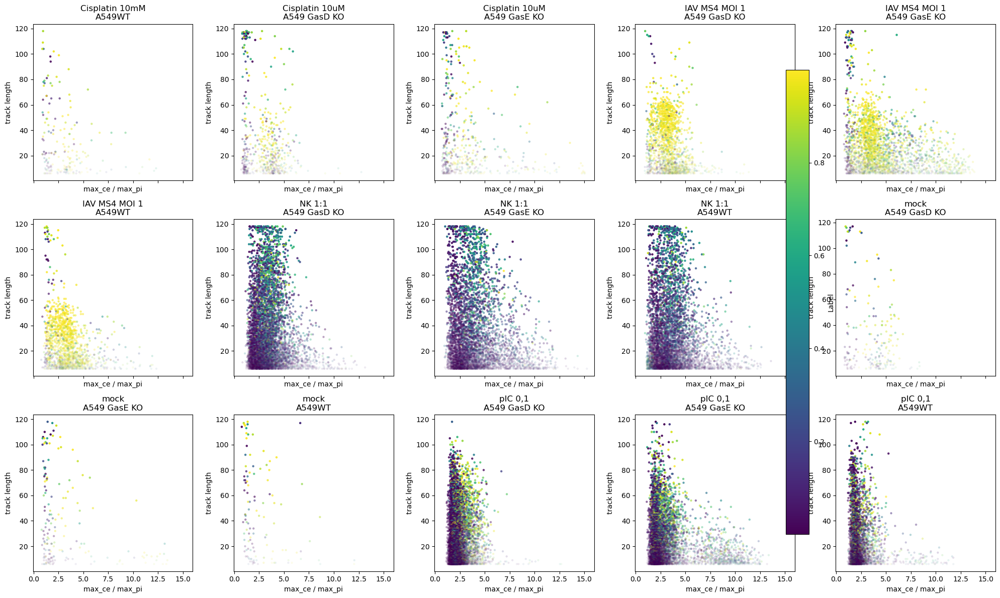

In [18]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter: only tracks longer than 5, and whose first time point is not 0
dfbin_filtered = df[df['track_length'] > 5].groupby(['Compound', 'Cell Type', 'track_index']).filter(
    lambda x: x['time_point_index'].min() != 0
)

# Compute maximum values for each track
max_val = dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index']).max()

# Compute the minimum time_point_index (start of each track)
min_time = dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index'])['time_point_index'].min().rename('min_time_point_index')

# Merge the start time back into the max_val DataFrame
max_val = max_val.merge(min_time, on=['Compound', 'Cell Type', 'track_index'])

# Compute ce/pi ratio at track maximum
max_val['ce_pi_ratio'] = max_val['ce_intensity_mean'] / max_val['pi_intensity_mean']

# Group by Compound and Cell Type
groups = max_val.groupby(['Compound', 'Cell Type'])

# Set up grid for 15 subplots
n_groups = len(groups)
ncols = 5
nrows = (n_groups + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 12), sharex=True)
axes = axes.flatten()

for ax, ((compound, celltype), subdf) in zip(axes, groups):
    sc = ax.scatter(
        subdf['ce_pi_ratio'],
        subdf['track_length'],
        c=subdf['label'],
        cmap='viridis',
        alpha=subdf['track_length'] / 120,  # scaled transparency
        s=5
    )
    ax.set_title(f'{compound}\n{celltype}')
    ax.set_xlabel('max_ce / max_pi')
    ax.set_ylabel('track length')

# Add colorbar for label scale
fig.colorbar(sc, ax=axes.tolist(), label='Label')

# Hide any unused subplots
for ax in axes[len(groups):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


In [30]:
dfbin_filtered.drop(['track_index', 'Compound', 'Cell Type', 'track_length', 'label', 'Unnamed: 0', 'label0', 'label1', 'time_point_index', 'nucleus_id', 'is_toggled'],axis=1)

,area,area_masked,eccentricity,center_x,center_y,dna_intensity_min,dna_intensity_max,dna_intensity_median,dna_intensity_quartile1,dna_intensity_quartile3,...,pi_intensity_sum_img,experiment_x,well,_folder_index,x,y,,,experiment_y,condition
13328,203.5,0.0,0.018,334.83,3669.79,10,244,105,46,200,...,92664167,/mnt/nas/group/REPORT/Imaging/2025-09-09-wprus...,0202,0,334,3669,2,2,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
13329,232.5,0.0,0.017,333.25,3674.91,7,244,80,35,169,...,91860411,/mnt/nas/group/REPORT/Imaging/2025-09-09-wprus...,0202,0,333,3674,2,2,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
13330,249.5,0.0,0.015,333.00,3679.46,5,244,73,31,150,...,91765327,/mnt/nas/group/REPORT/Imaging/2025-09-09-wprus...,0202,0,333,3679,2,2,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
13331,284.0,0.0,0.014,331.43,3679.46,5,244,58,23,133,...,91469491,/mnt/nas/group/REPORT/Imaging/2025-09-09-wprus...,0202,0,331,3679,2,2,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
13332,278.0,0.0,0.008,330.00,3679.74,5,244,59,25,128,...,91739541,/mnt/nas/group/REPORT/Imaging/2025-09-09-wprus...,0202,0,330,3679,2,2,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1747485,37.0,0.0,0.075,4579.82,1630.50,53,95,71,61,78,...,221249671,/mnt/nas/group/REPORT/Imaging/2025-09-09-wprus...,0406,0,4579,1630,4,6,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO
1747486,18.0,0.0,0.109,4571.50,1631.00,56,74,65,61,68,...,221211383,/mnt/nas/group/REPORT/Imaging/2025-09-09-wprus...,0406,0,4571,1631,4,6,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO
1747487,16.0,0.0,0.279,4569.42,1619.42,63,84,76,70,80,...,221674016,/mnt/nas/group/REPORT/Imaging/2025-09-09-wprus...,0406,0,4569,1619,4,6,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO
1747488,14.0,0.0,0.000,4581.00,1612.00,61,90,70,66,72,...,221786788,/mnt/nas/group/REPORT/Imaging/2025-09-09-wprus...,0406,0,4581,1612,4,6,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO


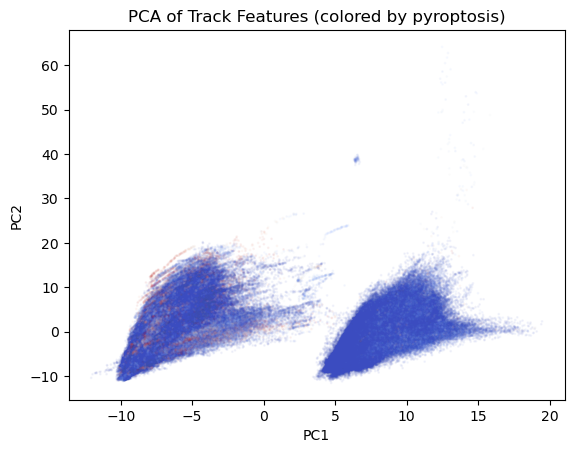

In [34]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
X = dfbin_filtered.drop(['track_index', 'Compound', 'Cell Type', 'track_length', 'label', 'Unnamed: 0', 'label0', 'label1', 'time_point_index', 'nucleus_id', 'is_toggled', 'experiment_y', 'experiment_x','well','_folder_index','x','y', 'condition'], axis=1)
X_scaled = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.scatter(X_pca[:,0], X_pca[:,1], c=dfbin_filtered['label'], cmap='coolwarm', alpha=0.05, s=1)
plt.xlabel('PC1'); plt.ylabel('PC2')
plt.title('PCA of Track Features (colored by pyroptosis)')
plt.show()

In [51]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import matplotlib.pyplot as plt

#X = track_features.drop(columns=['is_pyroptosis'])
y = dfbin_filtered['label']>0.5
Xex = X[[col for col in X.columns if 'img' not in col][:-5]]
X_train, X_test, y_train, y_test = train_test_split(Xex, y, stratify=y, random_state=42)

rf = RandomForestClassifier(n_estimators=50, random_state=42)
rf.fit(X_train, y_train)



RandomForestClassifier(n_estimators=50, random_state=42)

In [72]:

Xex = X[['ce_intensity_mean', 'pi_intensity_mean', 'dna_intensity_mean', 'dna_intensity_max', 'ce_intensity_max', 'pi_intensity_max', 'dna_intensity_min', 'ce_intensity_min', 'pi_intensity_min', 'center_x', 'center_y']]
X_train, X_test, y_train, y_test = train_test_split(Xex, y, stratify=y, random_state=42)

rf = RandomForestClassifier(n_estimators=50, random_state=42)
rf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=50, random_state=42)

In [75]:
y_pred = rf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.97      0.99      0.98    235424
        True       0.84      0.60      0.70     20074

    accuracy                           0.96    255498
   macro avg       0.90      0.80      0.84    255498
weighted avg       0.96      0.96      0.96    255498



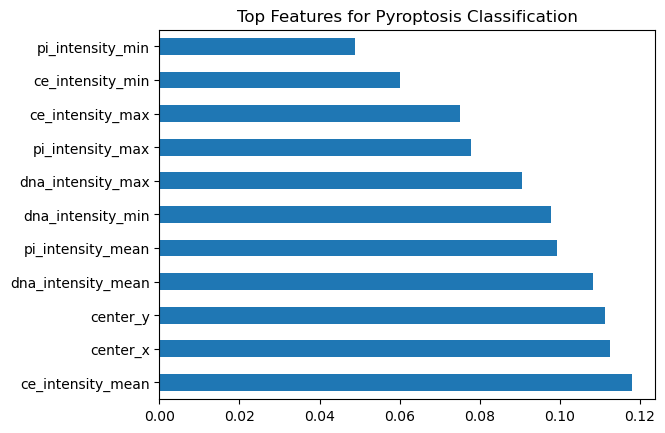

In [74]:
importances = pd.Series(rf.feature_importances_, index=X_train.columns)
importances.nlargest(15).plot(kind='barh')
plt.title('Top Features for Pyroptosis Classification')
plt.show()

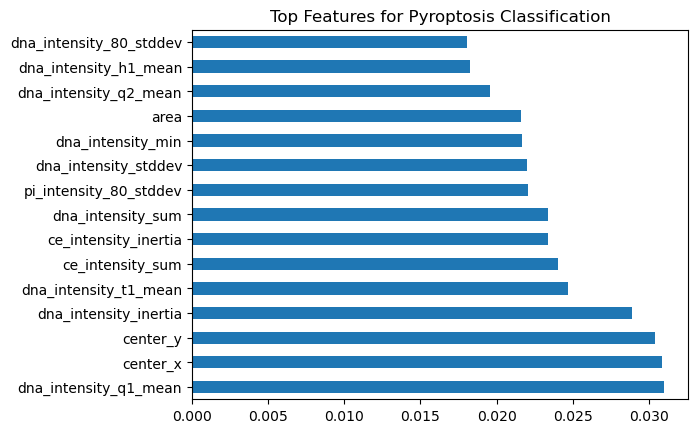

In [52]:
importances = pd.Series(rf.feature_importances_, index=X_train.columns)
importances.nlargest(15).plot(kind='barh')
plt.title('Top Features for Pyroptosis Classification')
plt.show()

In [47]:
from sklearn.metrics import classification_report, confusion_matrix
y_pred = rf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.97      0.99      0.98    235424
        True       0.85      0.69      0.76     20074

    accuracy                           0.97    255498
   macro avg       0.91      0.84      0.87    255498
weighted avg       0.96      0.97      0.96    255498



In [57]:
X_test['center_x'].min()

1.3

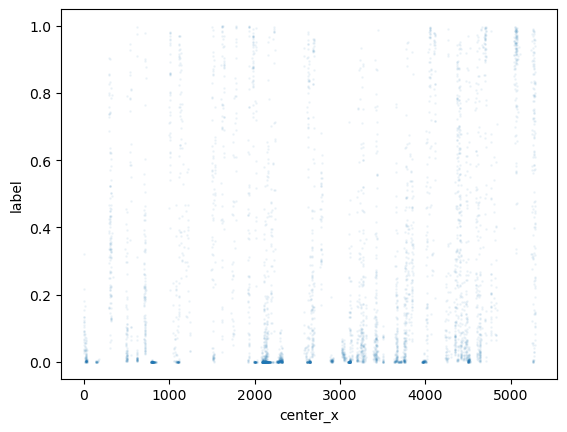

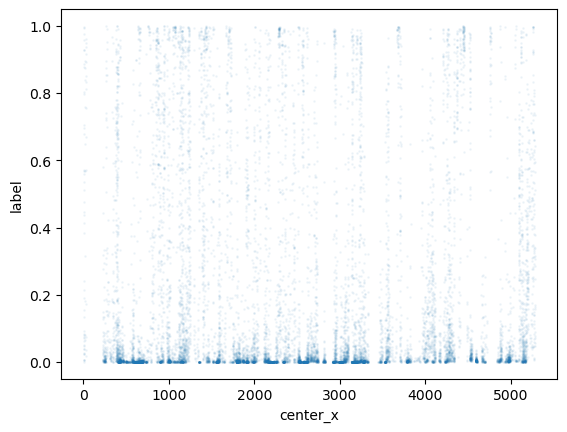

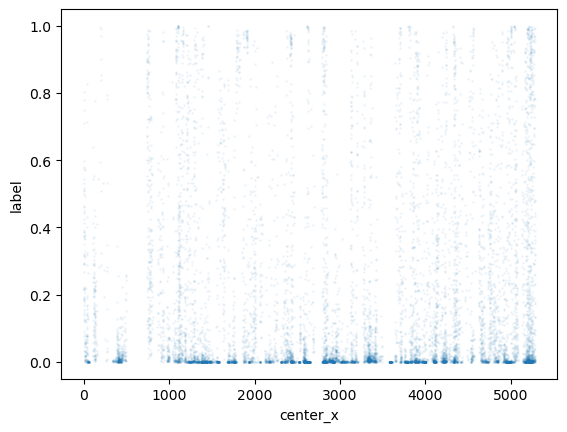

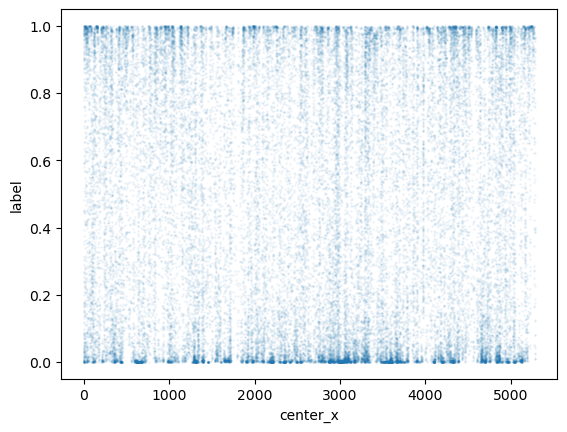

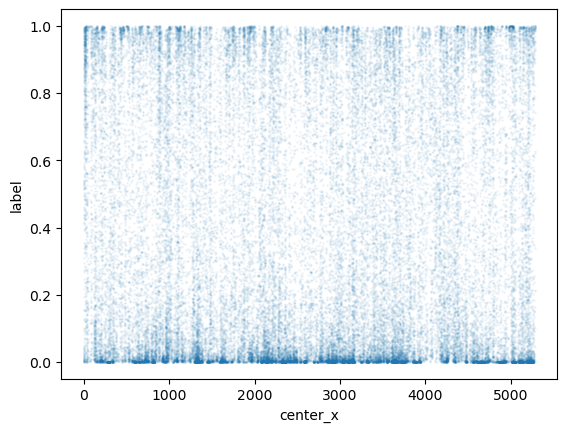

...

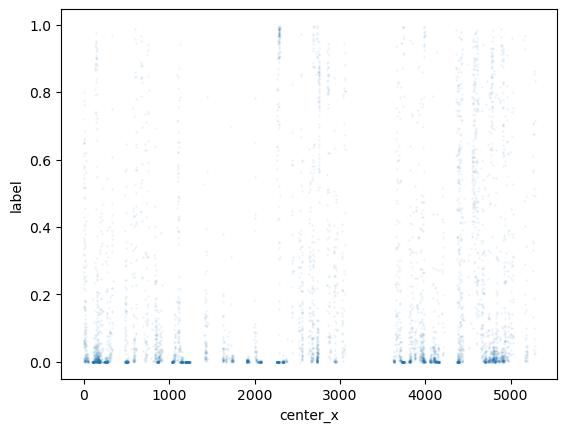

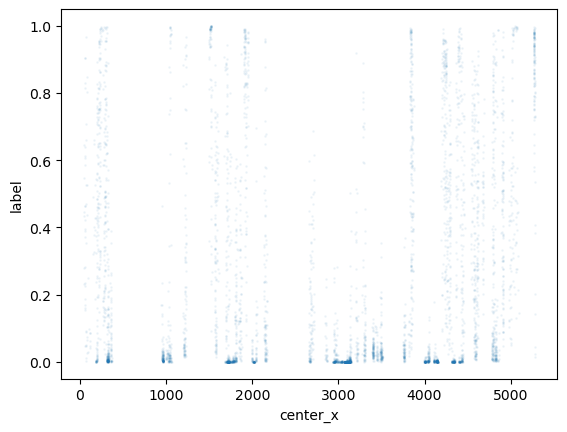

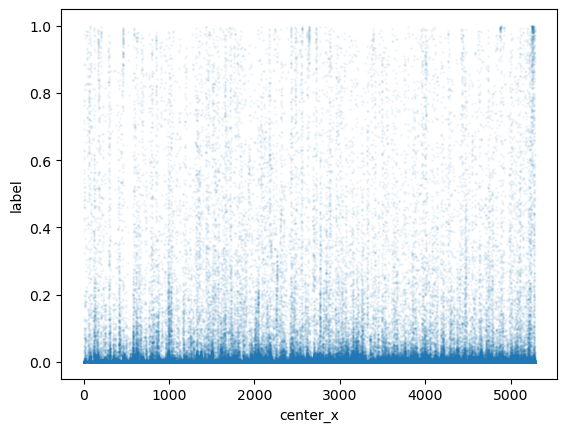

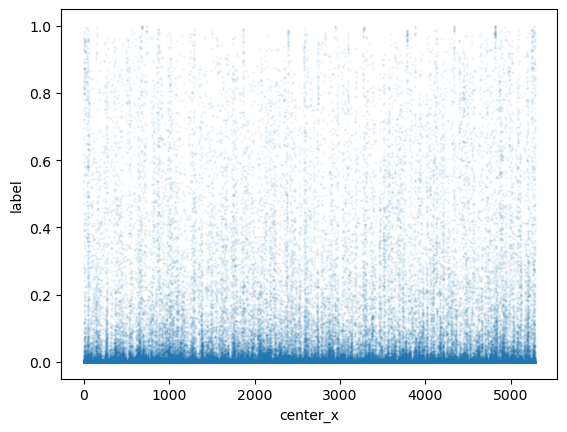

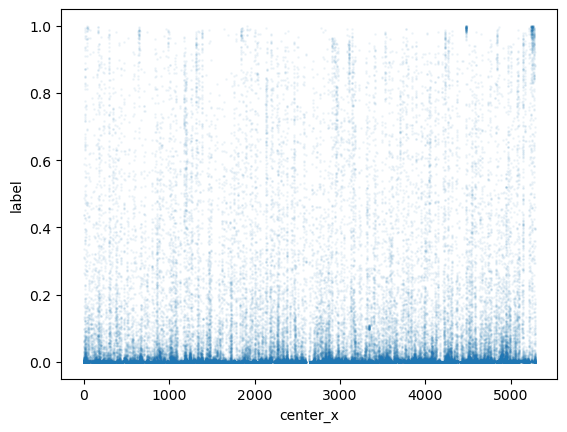

In [67]:
for c, group in dfbin_filtered.groupby('condition'):
    group.plot.scatter(x='center_x', y='label', alpha=0.05, s=1)

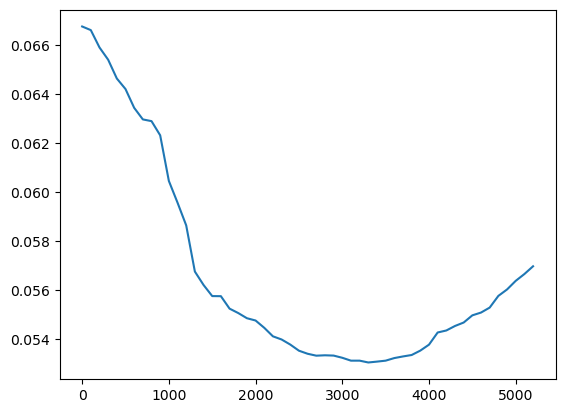

In [64]:
def ale(X_test, model, col):
    tls = list(range(int(X_test[col].min()), int(X_test[col].max()), 100))
    preds = []
    for tl in tls:
        Xc = X_test.copy()
        Xc[col] = tl
        preds.append(model.predict(Xc).mean())
    plt.plot(tls, preds)
ale(X_test, rf, 'center_y')

In [ ]:

ale(X_test, rf, 'center_y')

In [5]:
dfbin_filtered = df[df['track_length'] > 20].groupby(['Compound', 'Cell Type', 'track_index']).filter(
    lambda x: x['time_point_index'].min() != 0
)

In [ ]:
meta_cols = ['track_index', 'Compound', 'Cell Type', 'track_length', 'label']
exclude_cols = meta_cols + ['time_point_index', 'nucleus_id', 'is_toggled', 'is_pyroptosis', 'Unnamed: 0', 'label0', 'label1']

# keep only numeric columns to aggregate
numeric_cols = dfbin_filtered.select_dtypes(include=[np.number]).columns
agg_cols = [c for c in numeric_cols if c not in exclude_cols and 'img' not in c]

# --- Aggregation: mean, max, min, std ---
agg_funcs = ['mean', 'max', 'min', 'std']

track_features = (
    dfbin_filtered.groupby('track_index')[agg_cols]
    .agg(agg_funcs)
)
track_features.columns = [f'{c}_{stat}' for c, stat in track_features.columns]

# --- Compute "time of max" for selected variables ---
for feature in ['ce_intensity_mean', 'pi_intensity_mean', 'dna_intensity_mean']:
    idxmax = dfbin_filtered.groupby('track_index')[feature].idxmax()
    time_of_max = dfbin_filtered.loc[idxmax, ['track_index', 'time_point_index']].rename(
        columns={'time_point_index': f'{feature}_tmax'}
    )
    track_features = track_features.merge(time_of_max.set_index('track_index'),
                                          left_index=True, right_index=True)

# --- Derived feature: difference between CE and PI time of max ---
track_features['delta_t_ce_pi'] = (
    track_features['ce_intensity_mean_tmax'] - track_features['pi_intensity_mean_tmax']
)

# --- Compute label = mean of top 3 label values per track ---
def get_track_label(series):
    return (series>0.5).nlargest(3).all()#series.nlargest(3).mean()

label_per_track = dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index'])['label'].apply(get_track_label)#.rename('label_top3_mean')

# --- Add metadata (Compound, Cell Type, track_length) ---
track_meta = (
    dfbin_filtered.groupby(['track_index', 'Compound', 'Cell Type'])[['track_length']]
    .first()
)

# --- Combine everything ---
track_features = (
    track_features
    .merge(track_meta, left_index=True, right_index=True)
    #.merge(label_per_track, left_index=True, right_index=True)
    #.merge(center_mean, left_index=True, right_index=True)
)


In [23]:
label_per_track

Compound        Cell Type  track_index
Cisplatin 10mM  A549WT     87              True
                           89              True
                           90             False
                           91              True
                           92              True
                                          ...  
pIC 0,1         A549WT     2003           False
                           2004            True
                           2005            True
                           2006           False
                           2007            True
Name: label, Length: 22316, dtype: bool

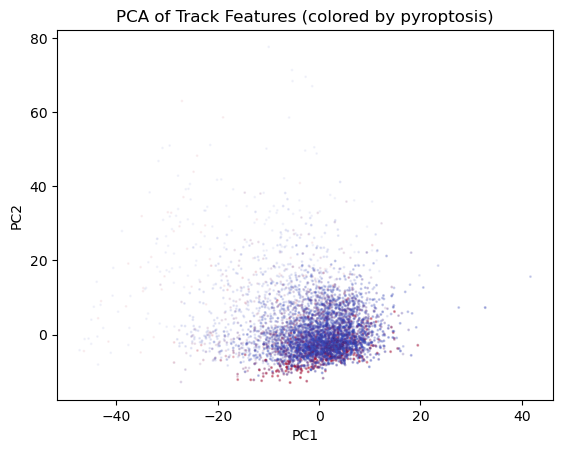

In [7]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
X = track_features#.drop(['label'], axis=1)
X_scaled = StandardScaler().fit_transform(X)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.scatter(X_pca[:,0], X_pca[:,1], c=label_per_track, cmap='coolwarm', alpha=0.05,s=1)
plt.xlabel('PC1'); plt.ylabel('PC2')
plt.title('PCA of Track Features (colored by pyroptosis)')
plt.show()

In [8]:
track_features.track_length.corr(label_per_track)

np.float64(0.008698985703885123)

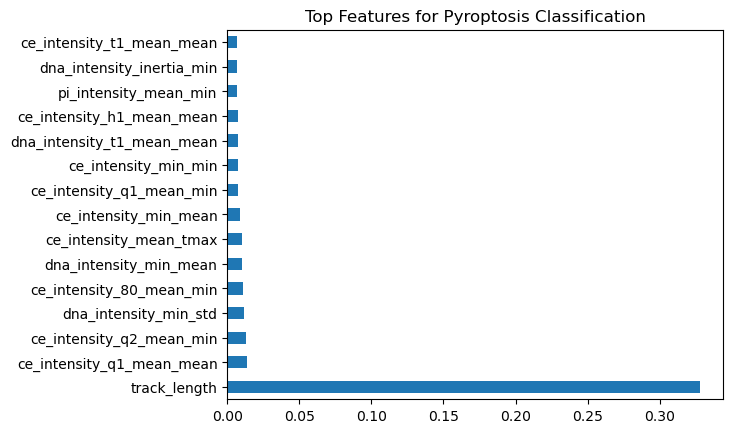

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import matplotlib.pyplot as plt

#X = track_features.drop(columns=['is_pyroptosis'])
y = label_per_track
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

rf = RandomForestClassifier(n_estimators=50, random_state=42)
rf.fit(X_train, y_train)

importances = pd.Series(rf.feature_importances_, index=X.columns)
importances.nlargest(15).plot(kind='barh')
plt.title('Top Features for Pyroptosis Classification')
plt.show()

In [53]:
def ale(X_test, col):
    tls = list(range(int(X_test[col].max())))
    preds = []
    for tl in tls:
        Xc = X_test.copy()
        Xc[col] = tl
        preds.append(rf.predict(Xc).mean())
    plt.plot(tls, preds)

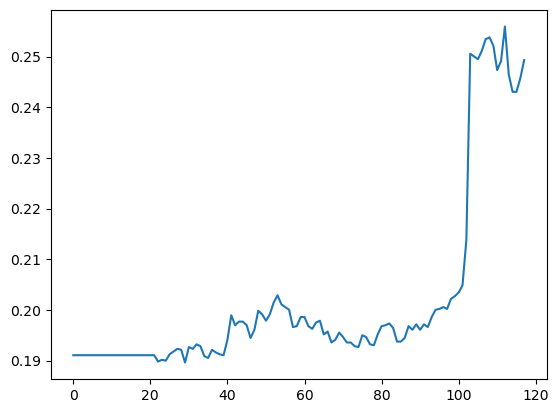

In [17]:
plt.plot(tls, preds)

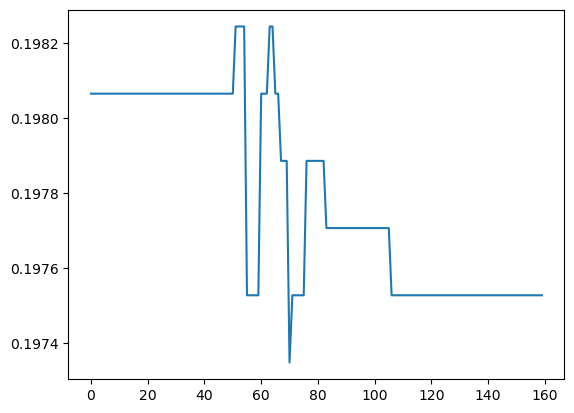

In [21]:
ale(X_test, 'ce_intensity_q1_mean_mean')

TypeError: numpy boolean subtract, the `-` operator, is not supported, use the bitwise_xor, the `^` operator, or the logical_xor function instead.

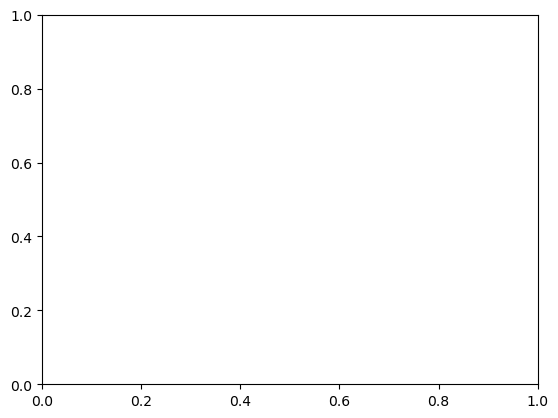

In [13]:
from alepython import ale_plot
# Plots ALE of feature 'cont' with Monte-Carlo replicas (default : 50).
ale_plot(rf, X_train, 'track_length', monte_carlo=True)

In [23]:
label_per_track.value_counts()

label
False    17716
True      4600
Name: count, dtype: int64

In [25]:
from sklearn.metrics import classification_report, confusion_matrix
y_pred = rf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.88      0.89      0.89      4429
        True       0.57      0.54      0.55      1150

    accuracy                           0.82      5579
   macro avg       0.72      0.72      0.72      5579
weighted avg       0.82      0.82      0.82      5579



In [ ]:
import shap
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test)

In [ ]:
shap.summary_plot(shap_values[1], X_test)

<Axes: xlabel='pi_intensity_mean', ylabel='ce_intensity_mean'>

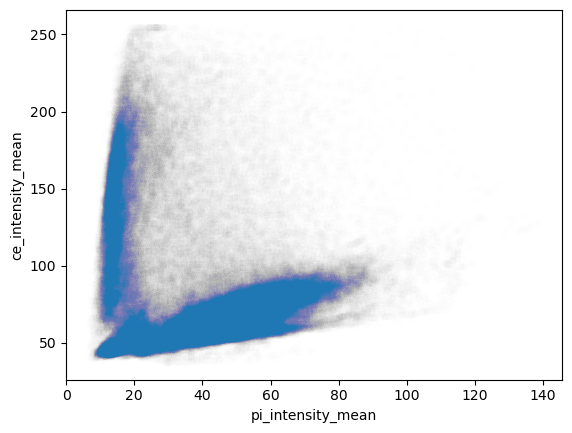

In [ ]:
track_features = dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index']).agg({
    'pi_intensity_mean': ['mean', 'max', 'min', 'std'],
    'ce_intensity_mean': ['mean', 'max', 'min', 'std'],
    'track_length': 'first',
    'time_point_index': ['max', 'min'],
    # add more if available
})
track_features.columns = ['_'.join(col).strip() for col in track_features.columns]
track_features = track_features.merge(
    df.groupby('track_index')['is_pyroptosis'].first(),
    on='track_index'
)

<Axes: xlabel='pi_intensity_mean', ylabel='ce_intensity_mean'>

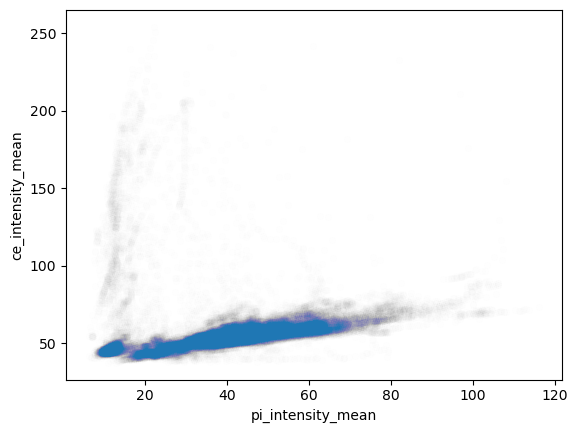

In [68]:
dfbin[dfbin['Compound']=='mock'].plot.scatter(x='pi_intensity_mean', y='ce_intensity_mean', alpha=0.005)

<Axes: xlabel='pi_intensity_mean', ylabel='ce_intensity_mean'>

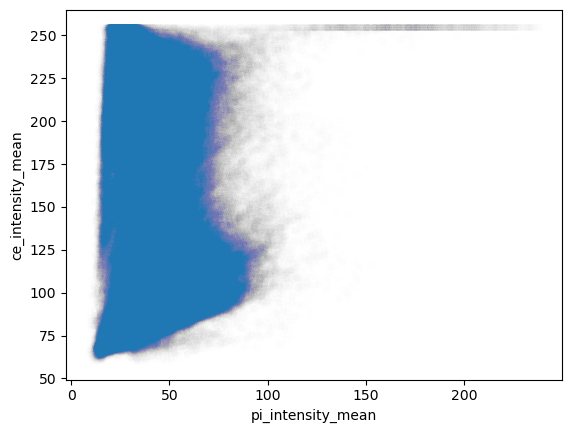

In [67]:
dfbin[dfbin['Compound']=='NK 1:1'].plot.scatter(x='pi_intensity_mean', y='ce_intensity_mean', alpha=0.005)

<Axes: xlabel='pi_intensity_mean', ylabel='ce_intensity_mean'>

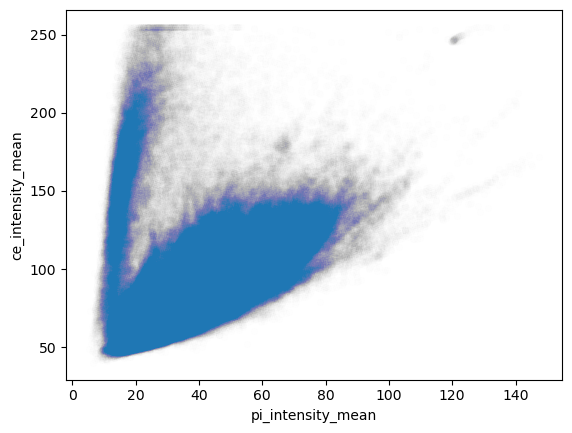

In [66]:
dfbin[dfbin['Compound']=='pIC 0,1'].plot.scatter(x='pi_intensity_mean', y='ce_intensity_mean', alpha=0.005)

In [76]:
dfbin

,Unnamed: 0,track_index,time_point_index,nucleus_id,area,area_masked,eccentricity,is_toggled,center_x,center_y,...,y,label0,label1,,,Cell Type,Compound,experiment_y,condition,label
0,0,0,0,13,391.0,0.0,0.092,0,4201.59,5166.96,...,5166,2.788675,-2.184649,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,0.006873
1,1,0,1,15,397.5,0.0,0.099,0,4191.99,5165.12,...,5165,2.419532,-1.734340,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,0.015461
2,2,0,2,14,386.0,0.0,0.095,0,4190.54,5166.97,...,5166,2.098637,-1.486381,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,0.026988
3,3,0,3,13,383.0,0.0,0.094,0,4190.23,5168.33,...,5168,3.244574,-2.566043,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,0.002987
4,4,0,4,13,389.0,0.0,0.098,0,4190.64,5169.09,...,5169,2.625313,-1.983140,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,0.009869
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1795059,240803,13287,23,1615,22.0,0.0,0.200,0,3072.00,4300.00,...,4300,2.201516,-1.921480,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,0.015938
1795060,240804,13288,10,1492,65.0,0.0,0.034,0,4498.21,3493.48,...,3493,1.319470,-1.281758,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,0.069059
1795061,240805,13289,51,2030,26.0,0.0,0.234,0,245.00,1271.00,...,1271,2.982458,-3.152338,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,0.002161
1795062,240806,13290,28,1792,16.5,0.0,0.120,0,3057.89,1752.66,...,1752,1.646476,-1.642962,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,0.035935


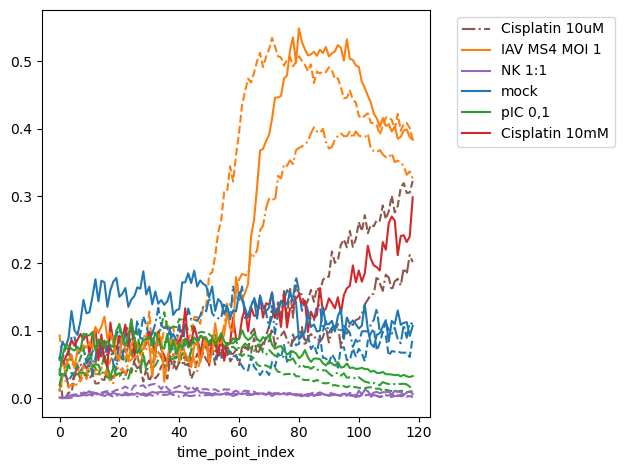

In [42]:
import matplotlib.pyplot as plt
import numpy as np

# Define line styles for cell types
linestyle_map = {
    'A549 GasD KO': '--',  # dashed
    'A549 GasE KO': '-.',  # dash-dot
}

# Get unique compounds for consistent colors
compounds = df['Compound'].unique()
colors = plt.cm.tab10(range(len(compounds)))
color_map = dict(zip(compounds, colors))

threshold = 0.5

for (cell_type, compound), dfg in df.groupby(['Cell Type', 'Compound']):
    linestyle = linestyle_map.get(cell_type, '-')  # solid for others
    color = color_map[compound]
    
    # Calculate proportion of labels > threshold for each time point
    result = dfg.groupby(['time_point_index'])['label'].apply(lambda x: np.mean(x > threshold))
    
    result.plot(
        label=compound,
        linestyle=linestyle,
        color=color
    )

# Remove duplicate labels in legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

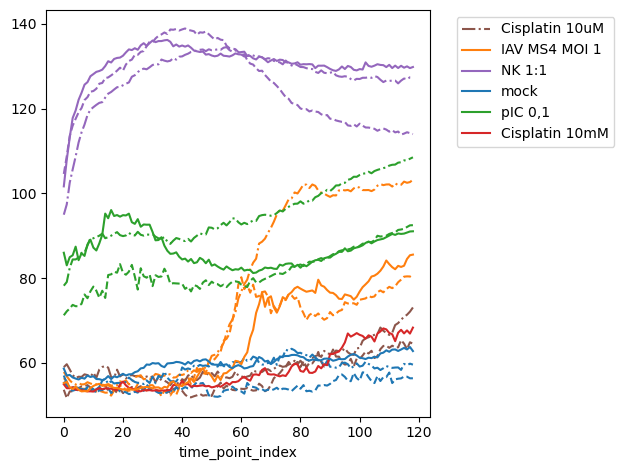

In [ ]:
import matplotlib.pyplot as plt

# Define line styles for cell types
linestyle_map = {
    'A549 GasD KO': '--',      # dashed
    'A549 GasE KO': '-.',      # dash-dot
}

# Get unique compounds for consistent colors
compounds = dfbin['Compound'].unique()
colors = plt.cm.tab10(range(len(compounds)))
color_map = dict(zip(compounds, colors))

for (cell_type, compound), dfg in dfbin.groupby(['Cell Type', 'Compound']):
    linestyle = linestyle_map.get(cell_type, '-')  # solid for others
    color = color_map[compound]
    
    dfg.groupby(['time_point_index'])['ce_intensity_mean'].mean().plot(
        label=compound,
        linestyle=linestyle,
        color=color
    )

# Remove duplicate labels in legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [68]:
df

,Unnamed: 0,track_index,time_point_index,nucleus_id,area,area_masked,eccentricity,is_toggled,center_x,center_y,...,label0,label1,label,,,Cell Type,Compound,experiment_y,condition,labelbin
0,0,0,0,13,391.0,0.0,0.092,0,4201.59,5166.96,...,0.796730,-0.946921,0.148850,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,False
1,1,0,1,15,397.5,0.0,0.099,0,4191.99,5165.12,...,0.893215,-1.055517,0.124692,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,False
2,2,0,2,14,386.0,0.0,0.095,0,4190.54,5166.97,...,0.947965,-0.849545,0.142154,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,False
3,3,0,3,13,383.0,0.0,0.094,0,4190.23,5168.33,...,1.116261,-1.363418,0.077295,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,False
4,4,0,4,13,389.0,0.0,0.098,0,4190.64,5169.09,...,0.672447,-0.807721,0.185402,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1795059,240803,13287,23,1615,22.0,0.0,0.200,0,3072.00,4300.00,...,2.254300,-4.655143,0.000997,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,False
1795060,240804,13288,10,1492,65.0,0.0,0.034,0,4498.21,3493.48,...,2.599297,-4.236363,0.001074,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,False
1795061,240805,13289,51,2030,26.0,0.0,0.234,0,245.00,1271.00,...,4.068305,-5.871884,0.000048,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,False
1795062,240806,13290,28,1792,16.5,0.0,0.120,0,3057.89,1752.66,...,2.056325,-3.586397,0.003531,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,False


,Unnamed: 0,track_index,time_point_index,nucleus_id,area,area_masked,eccentricity,is_toggled,center_x,center_y,...,label0,label1,label,,,Cell Type,Compound,experiment_y,condition,labelbin
13328,13328,112,1,81,203.5,0.0,0.018,0,334.83,3669.79,...,1.764957,-2.772025,0.010592,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,False
13329,13329,112,2,81,232.5,0.0,0.017,0,333.25,3674.91,...,2.078449,-2.644869,0.008807,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,False
13330,13330,112,3,80,249.5,0.0,0.015,0,333.00,3679.46,...,2.483712,-2.713215,0.005503,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,False
13331,13331,112,4,80,284.0,0.0,0.014,0,331.43,3679.46,...,0.723911,-0.598388,0.210436,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,False
13332,13332,112,5,82,278.0,0.0,0.008,0,330.00,3679.74,...,0.676462,-0.380499,0.257891,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1795059,240803,13287,23,1615,22.0,0.0,0.200,0,3072.00,4300.00,...,2.254300,-4.655143,0.000997,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,False
1795060,240804,13288,10,1492,65.0,0.0,0.034,0,4498.21,3493.48,...,2.599297,-4.236363,0.001074,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,False
1795061,240805,13289,51,2030,26.0,0.0,0.234,0,245.00,1271.00,...,4.068305,-5.871884,0.000048,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,False
1795062,240806,13290,28,1792,16.5,0.0,0.120,0,3057.89,1752.66,...,2.056325,-3.586397,0.003531,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO,False


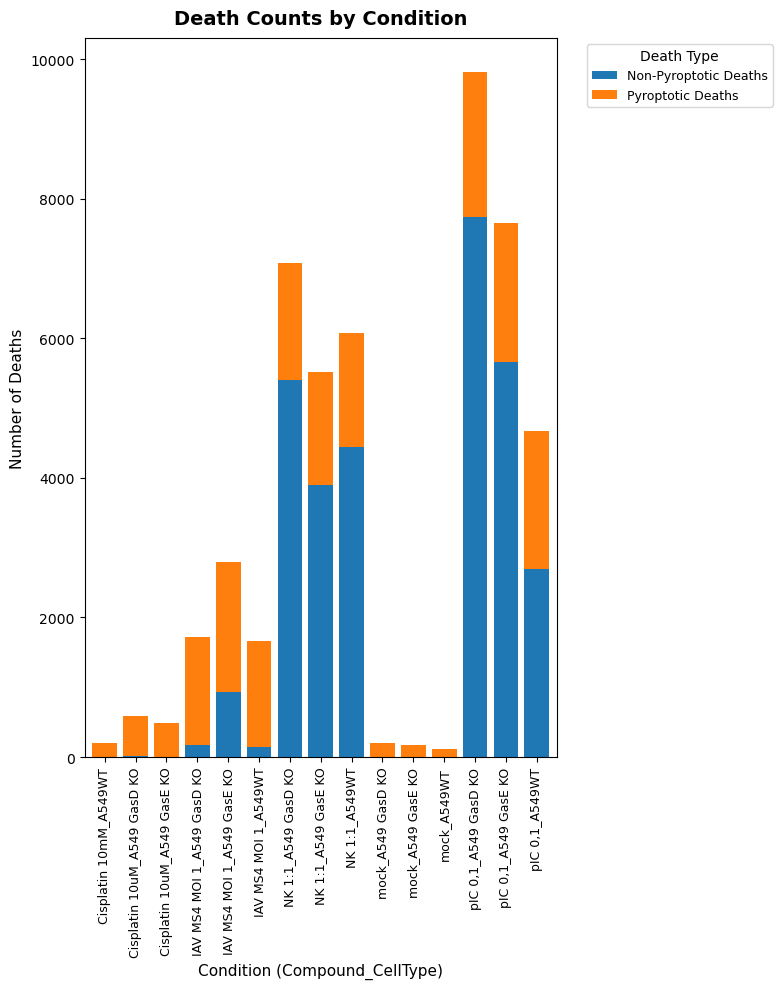

In [ ]:
import matplotlib.pyplot as plt


# First, identify wells with any pyroptotic death across all timeframes
pyroptotic_wells = track_features[track_features['label_top3_mean']>0.5]

# Count pyroptotic deaths per condition (Compound + Cell Type)
pyroptotic_counts = pyroptotic_wells.groupby(['Compound', 'Cell Type'])['label_top3_mean'].count().reset_index()
pyroptotic_counts.columns = ['Compound', 'Cell Type', 'Pyroptotic Deaths']

# Count total deaths (all unique tracks per condition)
total_counts = dfbin_filtered.groupby(['Compound', 'Cell Type'])['track_index'].nunique().reset_index()
total_counts.columns = ['Compound', 'Cell Type', 'Total Deaths']

# Merge the data
merged = total_counts.merge(pyroptotic_counts, on=['Compound', 'Cell Type'])

# Calculate non-pyroptotic deaths
merged['Non-Pyroptotic Deaths'] = merged['Total Deaths'] - merged['Pyroptotic Deaths']

# Create condition labels
merged['Condition'] = merged['Compound'] + '_' + merged['Cell Type']
merged = merged.set_index('Condition').sort_index()

# Create stacked bar chart
fig, ax = plt.subplots(figsize=(8, 10))

# Plot stacked bars
merged[['Non-Pyroptotic Deaths', 'Pyroptotic Deaths']].plot(
    kind='bar', 
    stacked=True, 
    ax=ax,
    color=['#1f77b4', '#ff7f0e'],  # Blue for non-pyroptotic, orange for pyroptotic
    width=0.8
)

plt.title('Death Counts by Condition', fontsize=14, fontweight='bold', pad=10)
plt.xlabel('Condition (Compound_CellType)', fontsize=11)
plt.ylabel('Number of Deaths', fontsize=11)
plt.legend(title='Death Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
plt.tick_params(axis='x', rotation=90, labelsize=9)
plt.tight_layout()
plt.show()

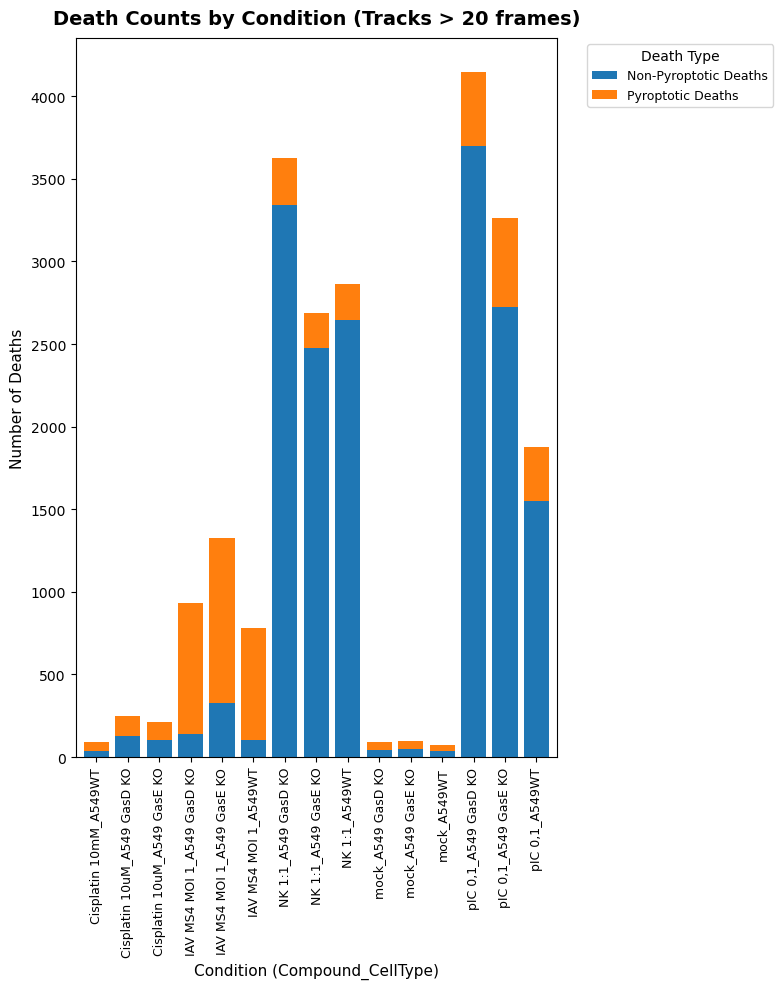

In [79]:
import matplotlib.pyplot as plt

# Filter for tracks longer than 20
dfbin_filtered = df[df['track_length'] > 20]
dfbin_filtered = dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index']).filter(lambda x: x['time_point_index'].min()!=0)

# First, identify wells with any pyroptotic death across all timeframes
pyroptotic_wells = dfbin_filtered.groupby(['Compound', 'Cell Type', 'track_index'])['label'].apply(
    lambda x: sum(x > 0.3)>5#(x > 0.5).any()
).reset_index()

# Count pyroptotic deaths per condition (Compound + Cell Type)
pyroptotic_counts = pyroptotic_wells.groupby(['Compound', 'Cell Type'])['label'].sum().reset_index()
pyroptotic_counts.columns = ['Compound', 'Cell Type', 'Pyroptotic Deaths']

# Count total deaths (all unique tracks per condition)
total_counts = dfbin_filtered.groupby(['Compound', 'Cell Type'])['track_index'].nunique().reset_index()
total_counts.columns = ['Compound', 'Cell Type', 'Total Deaths']

# Merge the data
merged = total_counts.merge(pyroptotic_counts, on=['Compound', 'Cell Type'])

# Calculate non-pyroptotic deaths
merged['Non-Pyroptotic Deaths'] = merged['Total Deaths'] - merged['Pyroptotic Deaths']

# Create condition labels
merged['Condition'] = merged['Compound'] + '_' + merged['Cell Type']
merged = merged.set_index('Condition').sort_index()

# Create stacked bar chart
fig, ax = plt.subplots(figsize=(8, 10))

# Plot stacked bars
merged[['Non-Pyroptotic Deaths', 'Pyroptotic Deaths']].plot(
    kind='bar', 
    stacked=True, 
    ax=ax,
    color=['#1f77b4', '#ff7f0e'],  # Blue for non-pyroptotic, orange for pyroptotic
    width=0.8
)

plt.title('Death Counts by Condition (Tracks > 20 frames)', fontsize=14, fontweight='bold', pad=10)
plt.xlabel('Condition (Compound_CellType)', fontsize=11)
plt.ylabel('Number of Deaths', fontsize=11)
plt.legend(title='Death Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
plt.tick_params(axis='x', rotation=90, labelsize=9)
plt.tight_layout()
plt.show()

<Figure size 800x1000 with 0 Axes>

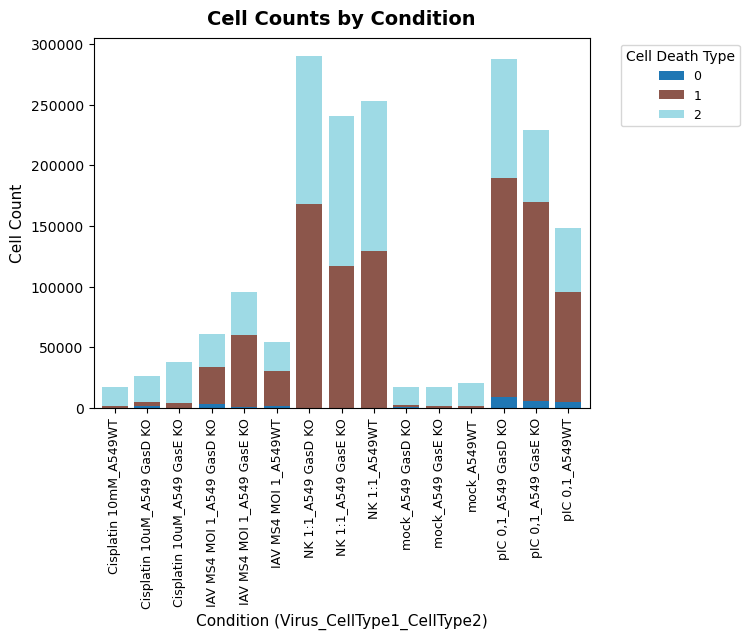

In [15]:
import matplotlib.pyplot as plt

# Create figure with subplots for each experiment
fig = plt.figure(figsize=(8, 10))


exp_data = df.copy()
exp_data['condition'] = (exp_data['Compound'].astype(str) + '_' + 
                            exp_data['Cell Type'].astype(str))

counts = exp_data.groupby(['condition', 'label']).size().reset_index(name='count')
pivot_data = counts.pivot(index='condition', columns='label', values='count')
pivot_data = pivot_data.fillna(0).sort_index()

pivot_data.plot(kind='bar', stacked=True,
                colormap='tab20', width=0.8)

plt.title(f'Cell Counts by Condition', 
                    fontsize=14, fontweight='bold', pad=10)
plt.xlabel('Condition (Virus_CellType1_CellType2)', fontsize=11)
plt.ylabel('Cell Count', fontsize=11)
plt.legend(title='Cell Death Type', bbox_to_anchor=(1.05, 1), 
                loc='upper left', fontsize=9)
plt.tick_params(axis='x', rotation=90, labelsize=9)

del exp_data, counts, pivot_data



In [54]:
df.Compound.unique()

array(['mock', 'IAV MS4 MOI 1', 'pIC 0,1', 'Cisplatin 10mM', 'NK 1:1',
       'Cisplatin 10uM'], dtype=object)

<Axes: xlabel='condition'>

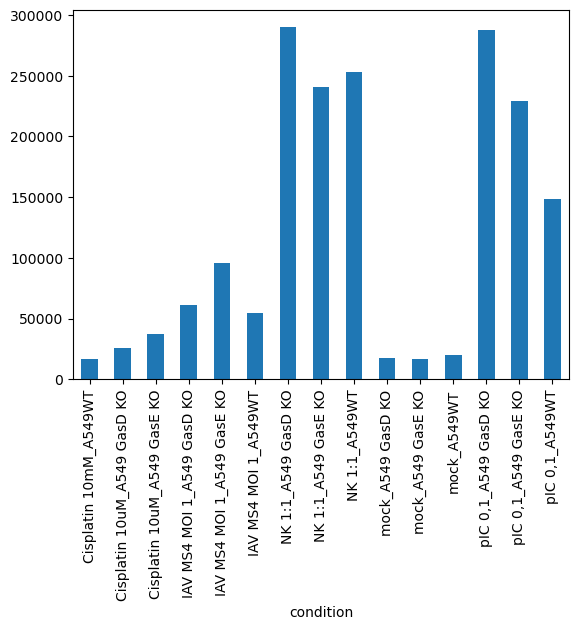

In [ ]:
df.groupby('condition')['track_index'].count().plot.bar()# wyfiltrować zaczynająće się na starcie

<Axes: xlabel='condition'>

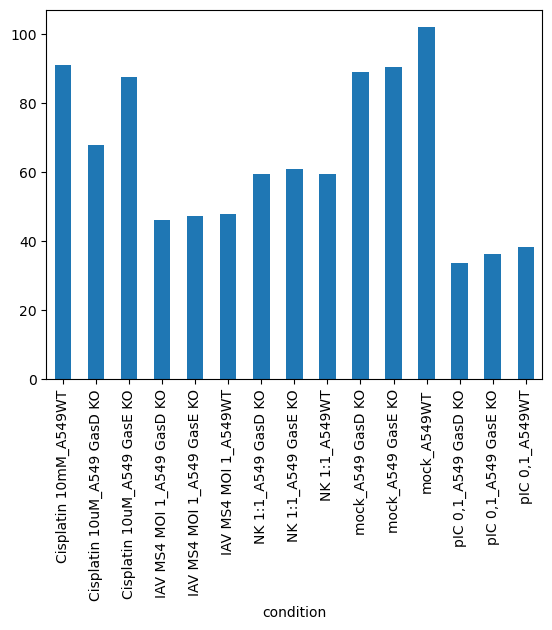

In [59]:
df.groupby('condition')['track_length'].mean().plot.bar()

Total cells in condition: 60753
Total tracks longer than 30: 774


/tmp/ipykernel_2686905/2482683055.py:110: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='best', fontsize=7, framealpha=0.8)


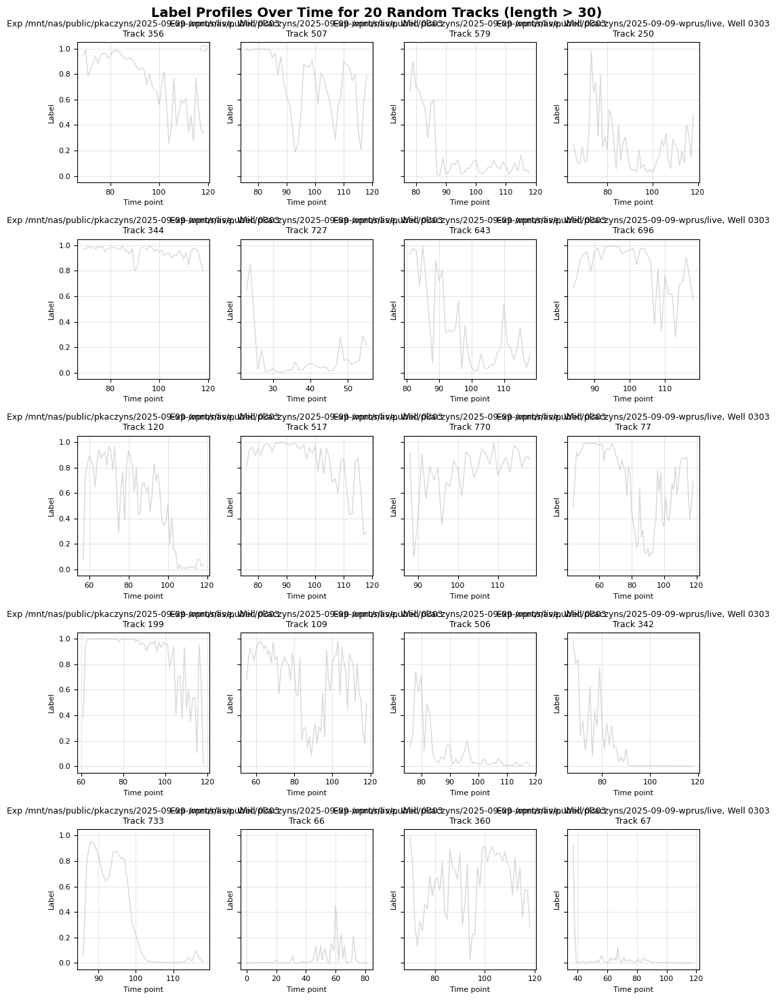

In [ ]:

# Filter by condition
condition_df = df[
     (df['Compound'] == 'NK 1:1') &
     (df['Cell Type'] == 'A549 GasD KO')
].rename({'experiment_y': 'experiment'}, axis=1)


print(f"Total cells in condition: {len(condition_df)}")

# Plot random tracks from this condition
fig = plot_random_track_labels(condition_df, n_tracks=20, 
                              min_length=30, figsize=(10, 15))

## Distance analysis

,Unnamed: 0,track_index,time_point_index,nucleus_id,area,area_masked,eccentricity,is_toggled,center_x,center_y,...,y,label0,label1,label,,,Cell Type,Compound,experiment_y,condition
13328,13328,112,1,81,203.5,0.0,0.018,0,334.83,3669.79,...,3669,1.764957,-2.772025,0.010592,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
13329,13329,112,2,81,232.5,0.0,0.017,0,333.25,3674.91,...,3674,2.078449,-2.644869,0.008807,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
13330,13330,112,3,80,249.5,0.0,0.015,0,333.00,3679.46,...,3679,2.483712,-2.713215,0.005503,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
13331,13331,112,4,80,284.0,0.0,0.014,0,331.43,3679.46,...,3679,0.723911,-0.598388,0.210436,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
13332,13332,112,5,82,278.0,0.0,0.008,0,330.00,3679.74,...,3679,0.676462,-0.380499,0.257891,2,2,A549WT,mock,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,mock_A549WT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1747485,193229,3387,81,2111,37.0,0.0,0.075,0,4579.82,1630.50,...,1630,2.754633,-4.230300,0.000925,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO
1747486,193230,3387,82,2101,18.0,0.0,0.109,0,4571.50,1631.00,...,1631,2.559465,-3.945419,0.001494,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO
1747487,193231,3387,83,2106,16.0,0.0,0.279,0,4569.42,1619.42,...,1619,2.852834,-4.366663,0.000732,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO
1747488,193232,3387,84,2127,14.0,0.0,0.000,0,4581.00,1612.00,...,1612,2.781851,-4.266470,0.000868,4,6,A549 GasE KO,NK 1:1,/mnt/nas/public/pkaczyns/2025-09-09-wprus/live,NK 1:1_A549 GasE KO


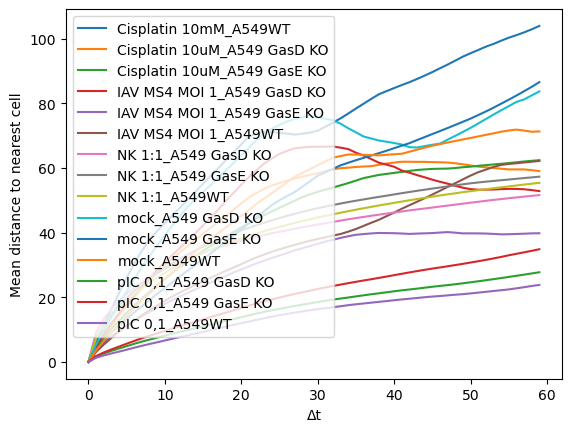

In [91]:
from scipy.spatial import KDTree

results = {}
for cond, group in dfbin_filtered.groupby('condition'):
    mean_dists = []
    apo = group.groupby('track_index').filter(lambda x: all(x['label']<0.5))
    for dt in range(60):
        all_distances = []
        
        for t in group['time_point_index'].unique():
            current = apo[apo['time_point_index'] == t]
            future = group[group['time_point_index'] == t + dt]
            
            if len(current) > 0 and len(future) > 0:
                tree = KDTree(future[['center_x', 'center_y']].values)
                distances, _ = tree.query(current[['center_x', 'center_y']].values)
                all_distances.extend(distances)
        
        mean_dists.append(np.mean(all_distances) if all_distances else np.nan)
    
    plt.plot(range(60), mean_dists, label=cond)

plt.xlabel('Δt')
plt.ylabel('Mean distance to nearest cell')
plt.legend()
plt.show()

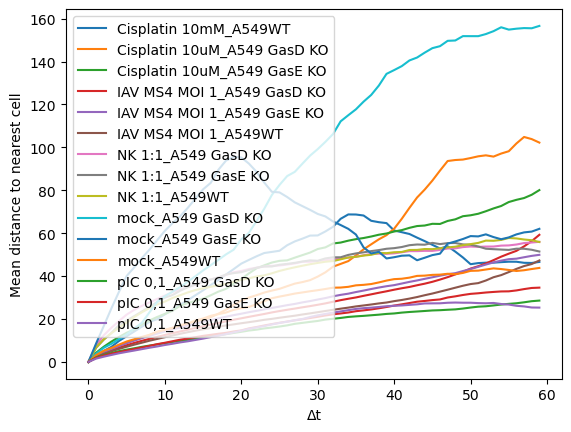

In [92]:
from scipy.spatial import KDTree

results = {}
for cond, group in dfbin_filtered.groupby('condition'):
    mean_dists = []
    pyro = group[group['label']>0.5]
    for dt in range(60):
        all_distances = []
        
        for t in group['time_point_index'].unique():
            current = pyro[pyro['time_point_index'] == t]
            future = group[group['time_point_index'] == t + dt]
            
            if len(current) > 0 and len(future) > 0:
                tree = KDTree(future[['center_x', 'center_y']].values)
                distances, _ = tree.query(current[['center_x', 'center_y']].values)
                all_distances.extend(distances)
        
        mean_dists.append(np.mean(all_distances) if all_distances else np.nan)
    
    plt.plot(range(60), mean_dists, label=cond)

plt.xlabel('Δt')
plt.ylabel('Mean distance to nearest cell')
plt.legend()
plt.show()

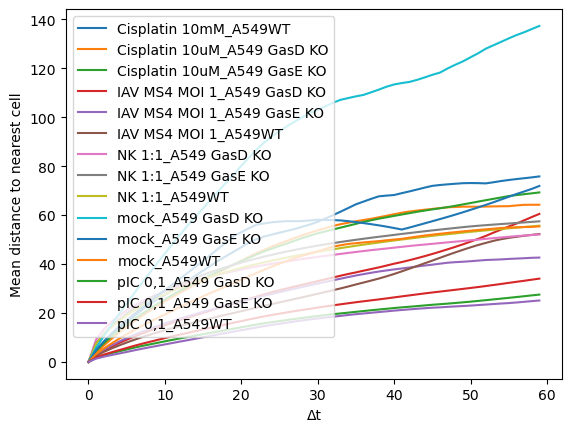

In [ ]:
from scipy.spatial import KDTree
# Look at the start of the track/ pyro annotation, not the cell in general
results = {}
for cond, group in dfbin_filtered.groupby('condition'):
    mean_dists = []
    
    for dt in range(60):
        all_distances = []
        
        for t in group['time_point_index'].unique():
            current = group[group['time_point_index'] == t]
            future = group[group['time_point_index'] == t + dt]
            
            if len(current) > 0 and len(future) > 0:
                tree = KDTree(future[['center_x', 'center_y']].values)
                distances, _ = tree.query(current[['center_x', 'center_y']].values)
                all_distances.extend(distances)
        
        mean_dists.append(np.mean(all_distances) if all_distances else np.nan)
    
    plt.plot(range(60), mean_dists, label=cond)

plt.xlabel('Δt')
plt.ylabel('Mean distance to nearest cell')
plt.legend()
plt.show()

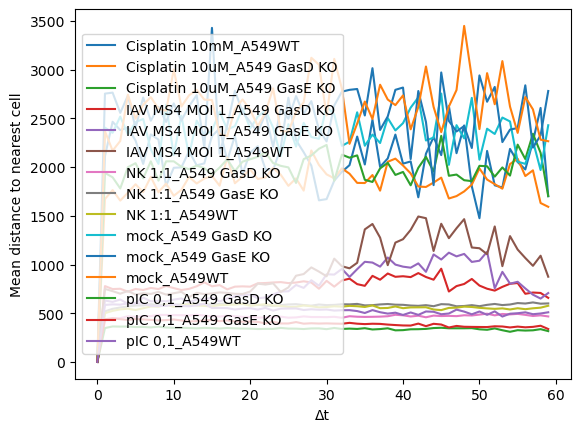

In [ ]:
from scipy.spatial import KDTree
# Look at the start of the track/ pyro annotation, not the cell in general
results = {}
beginnings = dfbin_filtered[dfbin_filtered['time_point_index'] == 
                            dfbin_filtered.groupby(['condition', 'track_index'])['time_point_index'].transform('min')]
for cond, group in beginnings.groupby('condition'):
    mean_dists = []
    
    for dt in range(1, 60):
        all_distances = []
        
        for t in group['time_point_index'].unique():
            current = group[group['time_point_index'] == t]
            future = group[group['time_point_index'] == t + dt]
            
            if len(current) > 0 and len(future) > 0:
                tree = KDTree(future[['center_x', 'center_y']].values)
                distances, _ = tree.query(current[['center_x', 'center_y']].values)
                all_distances.extend(distances)
        
        mean_dists.append(np.mean(all_distances) if all_distances else np.nan)
    
    plt.plot(range(60), mean_dists, label=cond)

plt.xlabel('Δt')
plt.ylabel('Mean distance to nearest cell')
plt.legend()
plt.show()

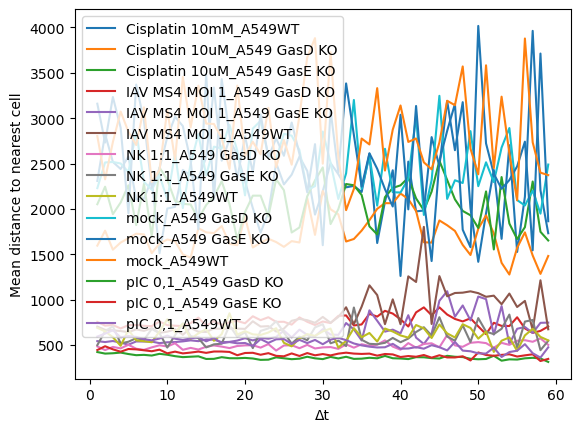

In [96]:
from scipy.spatial import KDTree
# Look at the start of the track/ pyro annotation, not the cell in general
results = {}
beginnings = dfbin_filtered[dfbin_filtered['time_point_index'] == 
                            dfbin_filtered.groupby(['condition', 'track_index'])['time_point_index'].transform('min')]
for cond, group in beginnings.groupby('condition'):
    mean_dists = []
    pyro = group[group['label']>0.5]
    for dt in range(1, 60):
        all_distances = []
        
        for t in group['time_point_index'].unique():
            current = pyro[pyro['time_point_index'] == t]
            future = group[group['time_point_index'] == t + dt]
            
            if len(current) > 0 and len(future) > 0:
                tree = KDTree(future[['center_x', 'center_y']].values)
                distances, _ = tree.query(current[['center_x', 'center_y']].values)
                all_distances.extend(distances)
        
        mean_dists.append(np.mean(all_distances) if all_distances else np.nan)
    
    plt.plot(range(1, 60), mean_dists, label=cond)

plt.xlabel('Δt')
plt.ylabel('Mean distance to nearest cell')
plt.legend()
plt.show()

In [117]:
# Graf 


from scipy.spatial.distance import cdist
import numpy as np

def count_nearby_cells(beginnings, dfbin_filtered, distance_threshold=50, time_threshold=40):
    """Count pyroptotic and non-pyroptotic cells within distance and time thresholds"""
    
    # Initialize columns
    beginnings['nearby_pyro_count'] = 0
    beginnings['nearby_non_pyro_count'] = 0
    
    for idx, cell in beginnings.iterrows():
        # Filter cells within time threshold
        time_window = dfbin_filtered[
            (dfbin_filtered['condition'] == cell['condition']) &
            (np.abs(dfbin_filtered['time_point_index'] - cell['time_point_index']) <= time_threshold)
        ]
        
        if len(time_window) > 0:
            # Calculate distances
            cell_pos = np.array(cell[['center_x', 'center_y']].values.reshape(1, -1), dtype=np.float64)
            other_pos = time_window[['center_x', 'center_y']].values
            distances = cdist(cell_pos, other_pos)[0]
            
            # Filter by distance (exclude self with distance > 0)
            nearby = time_window[(distances < distance_threshold) & (distances > 0)]
            
            # Count pyroptotic and non-pyroptotic
            beginnings.at[idx, 'nearby_pyro_count'] = nearby['is_pyro'].sum()
            beginnings.at[idx, 'nearby_non_pyro_count'] = len(nearby) - nearby['is_pyro'].sum()
    
    return beginnings


def count_nearby_cells_vectorized(beginnings, distance_threshold=50, time_threshold=40):
    """Vectorized version: Count pyroptotic and non-pyroptotic cells within distance and time thresholds"""
    
    # Initialize counts
    beginnings = beginnings.copy()
    beginnings['nearby_pyro_count'] = 0
    beginnings['nearby_non_pyro_count'] = 0

    # Process each condition separately (avoids unnecessary comparisons)
    for cond, beg_group in beginnings.groupby('condition'):
        print(cond)

        # Extract coordinates
        beg_coords = beg_group[['center_x', 'center_y']].to_numpy(dtype=np.float64)
        #df_coords = df_group[['center_x', 'center_y']].to_numpy(dtype=np.float64)

        # Pairwise distances (beginnings × dfbin_filtered)
        distances = cdist(beg_coords, beg_coords)

        # Pairwise time differences
        time_diffs = np.abs(
            beg_group['time_point_index'].to_numpy()[:, None] - beg_group['time_point_index'].to_numpy()[None, :]
        )

        # Mask: within thresholds & not self
        mask = (distances < distance_threshold) & (distances > 0) & (time_diffs <= time_threshold)

        # Pyroptosis mask
        pyro_mask = beg_group['is_pyro'].to_numpy().astype(bool)[None, :]

        # Count per row
        nearby_pyro = (mask & pyro_mask).sum(axis=1)
        nearby_non_pyro = (mask & ~pyro_mask).sum(axis=1)

        # Assign back
        beginnings.loc[beg_group.index, 'nearby_pyro_count'] = nearby_pyro
        beginnings.loc[beg_group.index, 'nearby_non_pyro_count'] = nearby_non_pyro

    return beginnings
#dfbin_filtered['is_pyro'] = dfbin_filtered.groupby(['condition', 'track_index'])['label'].transform(lambda x: (x.nlargest(3)>0.5).all())
beginnings = dfbin_filtered[dfbin_filtered['time_point_index'] == 
                            dfbin_filtered.groupby(['condition', 'track_index'])['time_point_index'].transform('min')]
# Apply the function
df = count_nearby_cells_vectorized(beginnings, 
                                distance_threshold=50, time_threshold=40)

# Verify results
print(df[['track_index', 'nearby_pyro_count', 'nearby_non_pyro_count']].head())

Cisplatin 10mM_A549WT
Cisplatin 10uM_A549 GasD KO
Cisplatin 10uM_A549 GasE KO
IAV MS4 MOI 1_A549 GasD KO
IAV MS4 MOI 1_A549 GasE KO
IAV MS4 MOI 1_A549WT
NK 1:1_A549 GasD KO
NK 1:1_A549 GasE KO
NK 1:1_A549WT
mock_A549 GasD KO
mock_A549 GasE KO
mock_A549WT
pIC 0,1_A549 GasD KO
pIC 0,1_A549 GasE KO
pIC 0,1_A549WT
       track_index  nearby_pyro_count  nearby_non_pyro_count
13328          112                  0                      0
13563          114                  0                      0
13797          116                  0                      0
13914          117                  0                      0
14030          118                  0                      2


In [122]:
df_plot

,condition,is_pyro,nearby_pyro_count,nearby_non_pyro_count
0,Cisplatin 10mM_A549WT,False,0.027027,0.702703
1,Cisplatin 10mM_A549WT,True,0.074074,0.018519
2,Cisplatin 10uM_A549 GasD KO,False,0.067797,0.305085
3,Cisplatin 10uM_A549 GasD KO,True,0.152672,0.061069
4,Cisplatin 10uM_A549 GasE KO,False,0.008772,0.298246
5,Cisplatin 10uM_A549 GasE KO,True,0.081633,0.010204
6,IAV MS4 MOI 1_A549 GasD KO,False,0.279070,0.170543
7,IAV MS4 MOI 1_A549 GasD KO,True,0.213665,0.044720
8,IAV MS4 MOI 1_A549 GasE KO,False,0.270833,0.428571
9,IAV MS4 MOI 1_A549 GasE KO,True,0.393145,0.091734


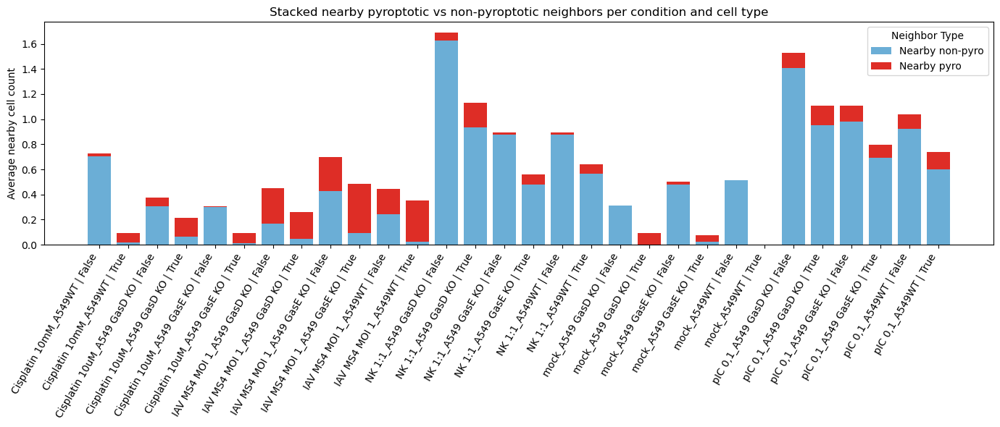

In [123]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# assuming your df is as shown and has a MultiIndex (condition, is_pyro)
df_plot = df.groupby(['condition', 'is_pyro'])[['nearby_pyro_count','nearby_non_pyro_count']].mean().reset_index()

# Combine condition and is_pyro into a single label for the x-axis
df_plot['cond_label'] = df_plot['condition'] + ' | ' + df_plot['is_pyro'].astype(str)

# Plot
plt.figure(figsize=(14, 6))

# Bottom stack = nearby_non_pyro_count
plt.bar(
    df_plot['cond_label'],
    df_plot['nearby_non_pyro_count'],
    label='Nearby non-pyro',
    color='#6baed6'
)

# Top stack = nearby_pyro_count
plt.bar(
    df_plot['cond_label'],
    df_plot['nearby_pyro_count'],
    bottom=df_plot['nearby_non_pyro_count'],
    label='Nearby pyro',
    color='#de2d26'
)

# Style
plt.xticks(rotation=60, ha='right')
plt.ylabel('Average nearby cell count')
plt.title('Stacked nearby pyroptotic vs non-pyroptotic neighbors per condition and cell type')
plt.legend(title='Neighbor Type')
plt.tight_layout()
plt.show()


In [ ]:
def count_nearby_cells_vectorized(beginnings, distance_threshold=50, time_threshold=40):
    """Vectorized version: Count pyroptotic and non-pyroptotic cells within distance and time thresholds"""
    
    # Initialize counts
    beginnings = beginnings.copy()
    beginnings['nearby_pyro_count'] = 0
    beginnings['nearby_non_pyro_count'] = 0

    # Process each condition separately (avoids unnecessary comparisons)
    for cond, beg_group in beginnings.sort_values('time_point_index').groupby('condition'):
        print(cond)

        # Extract coordinates
        beg_coords = beg_group[['center_x', 'center_y']].to_numpy(dtype=np.float64)
        #df_coords = df_group[['center_x', 'center_y']].to_numpy(dtype=np.float64)

        distances = cdist(beg_coords, beg_coords)
        # Pairwise time differences
        time_diffs = np.abs(
            beg_group['time_point_index'].to_numpy()[:, None] - beg_group['time_point_index'].to_numpy()[None, :]
        )
        print(len(beg_group), time_diffs.size)
        # Mask: within thresholds & not self
        mask = (distances < distance_threshold) & (distances > 0) & (time_diffs <= time_threshold)

        # Pyroptosis mask
        pyro_mask = beg_group['is_pyro'].to_numpy().astype(bool)[None, :]
        # Count per row
        nearby_pyro = (mask & pyro_mask).sum(axis=1)
        nearby_non_pyro = (mask & ~pyro_mask).sum(axis=1)
        deaths = mask.sum(axis=1)
        # Assign back
        beginnings.loc[beg_group.index, 'nearby_pyro_count'] = nearby_pyro
        beginnings.loc[beg_group.index, 'nearby_non_pyro_count'] = nearby_non_pyro
        beginnings.loc[beg_group.index, 'deaths'] = deaths

    return beginnings
#dfbin_filtered['is_pyro'] = dfbin_filtered.groupby(['condition', 'track_index'])['label'].transform(lambda x: (x.nlargest(3)>0.5).all())
beginnings = dfbin_filtered[dfbin_filtered['time_point_index'] == 
                            dfbin_filtered.groupby(['condition', 'track_index'])['time_point_index'].transform('min')]
# Apply the function
df = count_nearby_cells_vectorized(beginnings, 
                                distance_threshold=50, time_threshold=40)

# Verify results
print(df[['track_index', 'nearby_pyro_count', 'nearby_non_pyro_count']].head())

Cisplatin 10mM_A549WT
[[ 1]
 [ 4]
 [ 4]
 [ 4]
 [10]
 [15]
 [15]
 [17]
 [18]
 [19]
 [20]
 [21]
 [21]
 [22]
 [25]
 [25]
 [31]
 [34]
 [35]
 [36]
 [37]
 [40]
 [41]
 [41]
 [42]
 [42]
 [44]
 [44]
 [47]
 [51]
 [51]
 [52]
 [52]
 [52]
 [54]
 [54]
 [56]
 [58]
 [59]
 [61]
 [64]
 [65]
 [65]
 [65]
 [67]
 [68]
 [70]
 [70]
 [70]
 [73]
 [73]
 [73]
 [75]
 [75]
 [76]
 [78]
 [78]
 [79]
 [79]
 [80]
 [81]
 [81]
 [81]
 [81]
 [82]
 [82]
 [82]
 [83]
 [85]
 [86]
 [86]
 [87]
 [87]
 [88]
 [90]
 [90]
 [90]
 [92]
 [92]
 [95]
 [95]
 [96]
 [96]
 [96]
 [96]
 [96]
 [97]
 [97]
 [97]
 [97]
 [98]]
91 8281
Cisplatin 10uM_A549 GasD KO
[[ 1]
 [ 1]
 [ 1]
 [ 1]
 [ 1]
 [ 1]
 [ 1]
 [ 2]
 [ 2]
 [ 2]
 [ 2]
 [ 2]
 [ 2]
 [ 2]
 [ 2]
 [ 2]
 [ 2]
 [ 3]
 [ 3]
 [ 3]
 [ 3]
 [ 3]
 [ 3]
 [ 3]
 [ 4]
 [ 5]
 [ 5]
 [ 5]
 [ 5]
 [ 6]
 [ 6]
 [ 6]
 [ 6]
 [ 6]
 [ 6]
 [ 7]
 [ 7]
 [ 7]
 [ 7]
 [ 7]
 [ 8]
 [ 8]
 [ 8]
 [ 8]
 [10]
 [12]
 [14]
 [14]
 [14]
 [14]
 [15]
 [16]
 [16]
 [17]
 [17]
 [19]
 [20]
 [20]
 [21]
 [21]
 [22]
 [23]
 [24]
 [25]
 [25]
 [26]

In [ ]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist

def count_nearby_over_time(beginnings, distance_threshold=50):
    """
    For each cell death beginning, compute number of pyro and non-pyro cells
    within the given radius for every Δt between the beginning and the end of experiment.

    Returns a long DataFrame with columns:
        ['condition', 'cell_id', 'delta_t', 'nearby_pyro_count', 'nearby_non_pyro_count']
    """
    results = []

    # ensure we're not modifying the original
    beginnings = beginnings.copy()

    # Loop per condition (reduces computation)
    for cond, beg_group in beginnings.groupby('condition'):


        # Precompute coordinate arrays
        all_coords = beg_group[['center_x', 'center_y']].to_numpy(dtype=np.float64)
        all_times = beg_group['time_point_index'].to_numpy()
        all_pyro = beg_group['is_pyro'].to_numpy().astype(bool)

        max_time = beg_group['time_point_index'].max()

        for idx, cell in beg_group.iterrows():
            cell_pos = np.array([[cell['center_x'], cell['center_y']]], dtype=np.float64)
            t0 = cell['time_point_index']
            cell_id = cell.get('nucleus_id', idx)  # fallback to index if no ID

            # Compute static distances once (does not depend on time)
            distances = cdist(cell_pos, all_coords)[0]
            within_radius = (distances < distance_threshold) & (distances > 0)

            # For each time step Δt from beginning to end
            for t in range(t0, max_time + 1):
                mask_time = (all_times == t)
                mask_total = within_radius & mask_time

                pyro_count = (mask_total & all_pyro).sum()
                non_pyro_count = (mask_total & ~all_pyro).sum()

                results.append({
                    'condition': cond,
                    'cell_id': cell_id,
                    'delta_t': t - t0,
                    'is_pyro': cell['is_pyro'],
                    'nearby_pyro_count': pyro_count,
                    'nearby_non_pyro_count': non_pyro_count,
                    'deaths': mask_total.sum(),
                })

    return pd.DataFrame(results)

dt = count_nearby_over_time(beginnings)

In [140]:
dt['is_pyro']

0         True
1         True
2         True
3         True
4         True
          ... 
880938    True
880939    True
880940    True
880941    True
880942    True
Name: is_pyro, Length: 880943, dtype: bool

('Cisplatin 10mM_A549WT', np.False_)


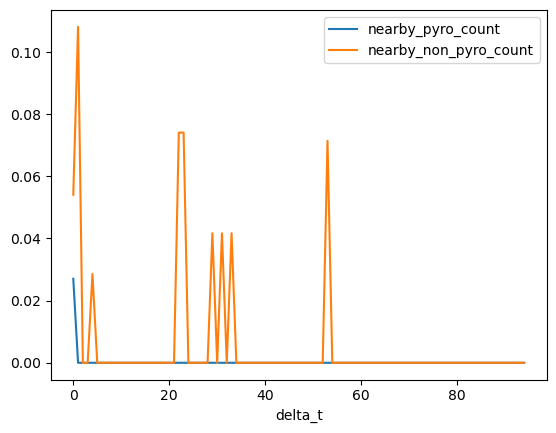

('Cisplatin 10mM_A549WT', np.True_)


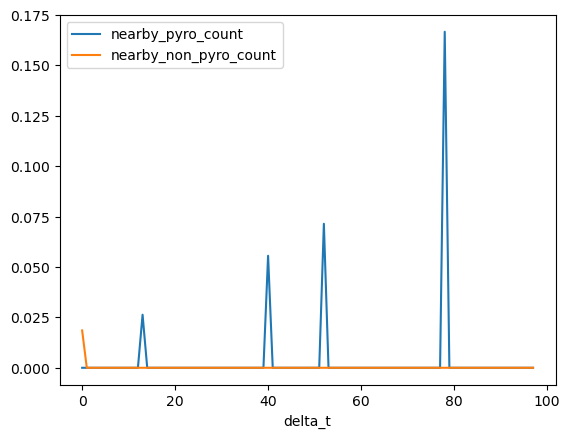

('Cisplatin 10uM_A549 GasD KO', np.False_)


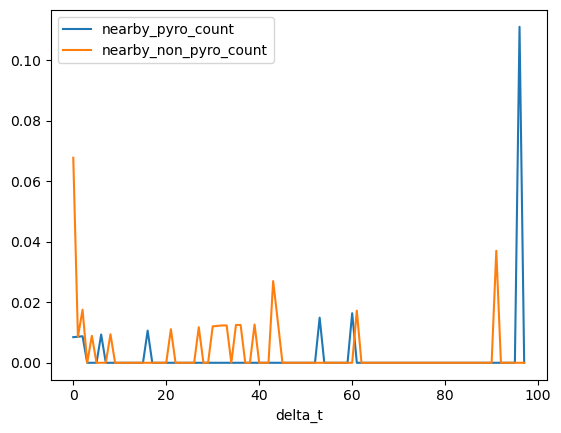

('Cisplatin 10uM_A549 GasD KO', np.True_)


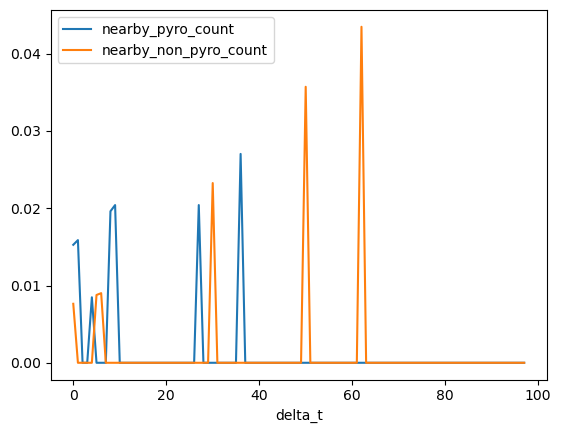

('Cisplatin 10uM_A549 GasE KO', np.False_)


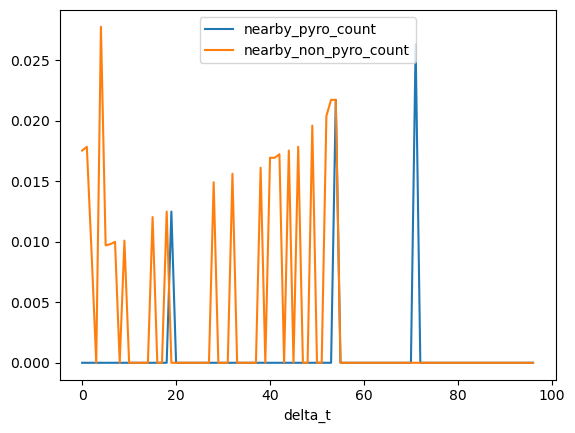

('Cisplatin 10uM_A549 GasE KO', np.True_)


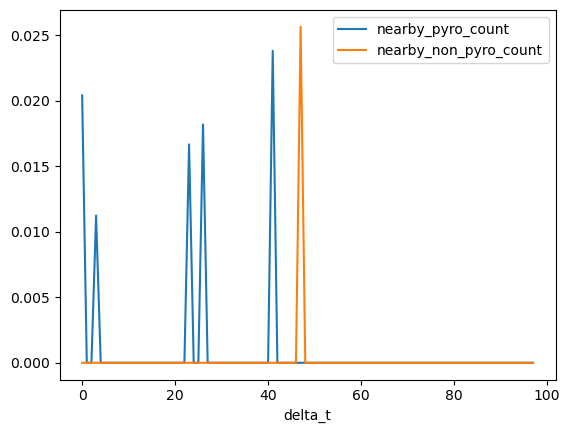

('IAV MS4 MOI 1_A549 GasD KO', np.False_)


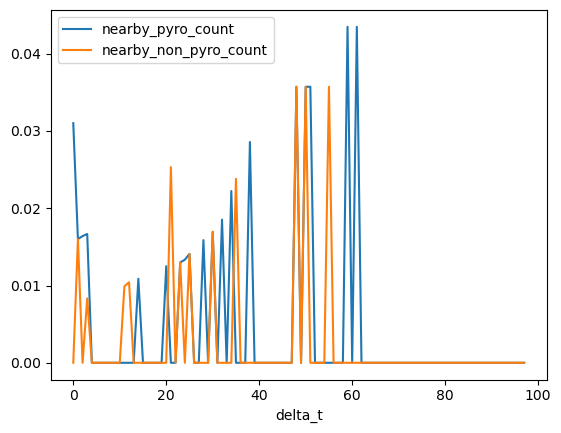

('IAV MS4 MOI 1_A549 GasD KO', np.True_)


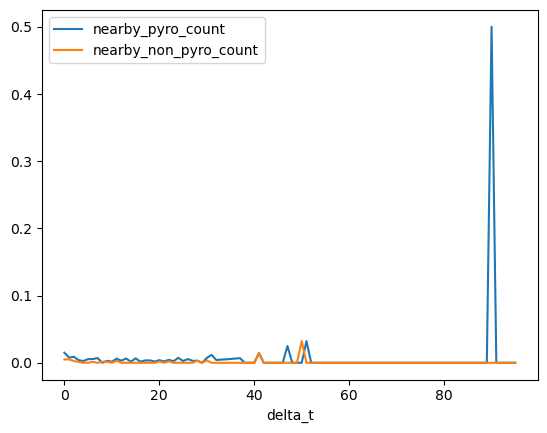

('IAV MS4 MOI 1_A549 GasE KO', np.False_)


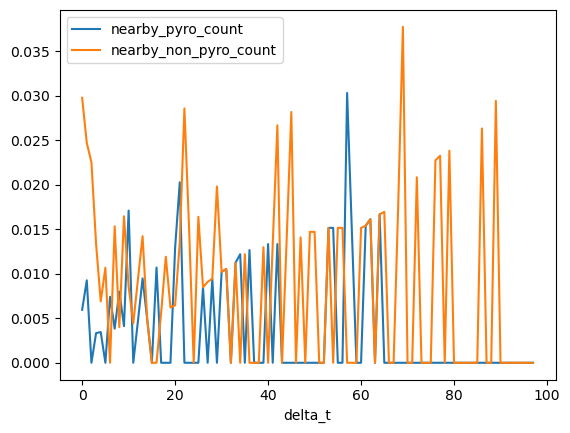

('IAV MS4 MOI 1_A549 GasE KO', np.True_)


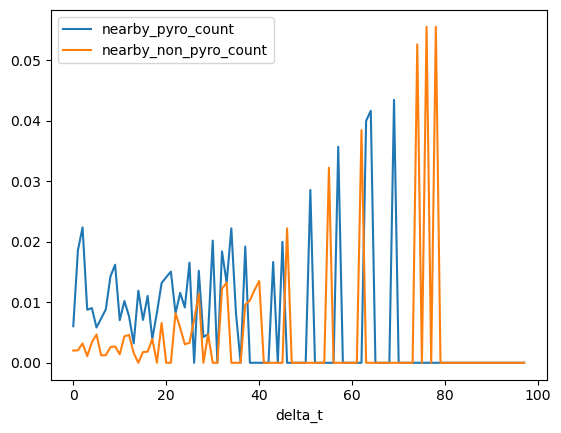

('IAV MS4 MOI 1_A549WT', np.False_)


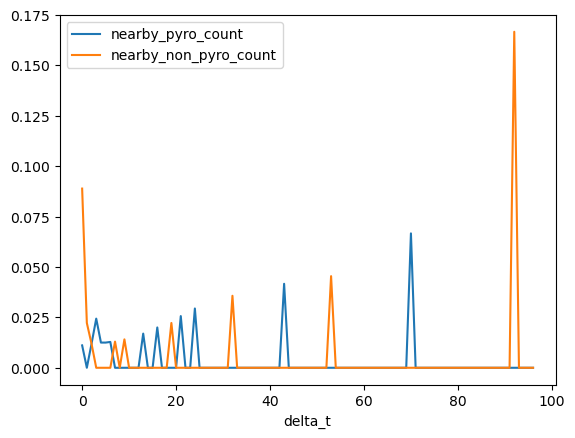

('IAV MS4 MOI 1_A549WT', np.True_)


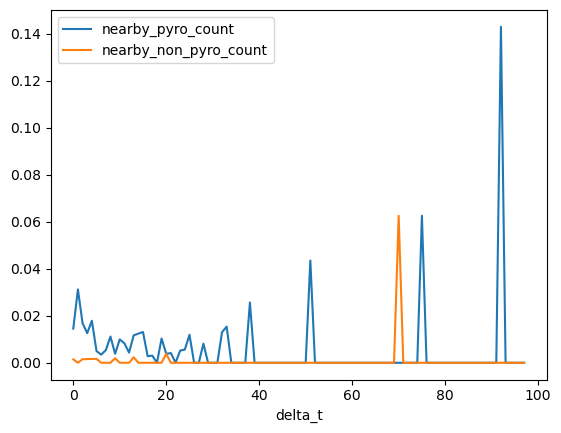

('NK 1:1_A549 GasD KO', np.False_)


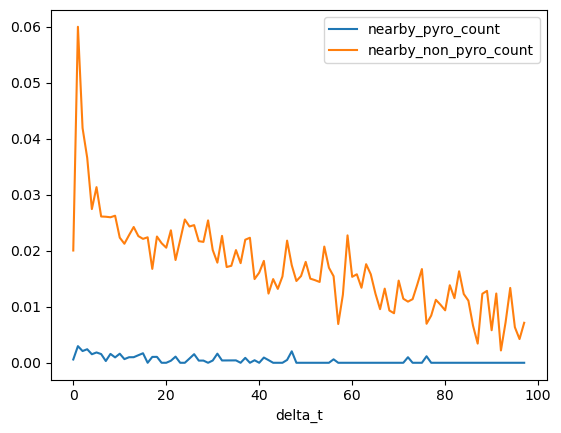

('NK 1:1_A549 GasD KO', np.True_)


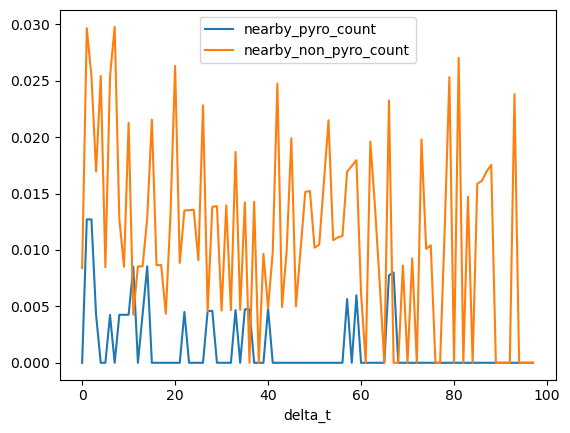

('NK 1:1_A549 GasE KO', np.False_)


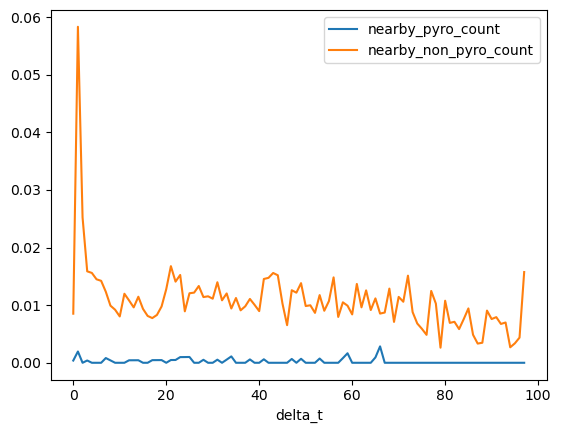

('NK 1:1_A549 GasE KO', np.True_)


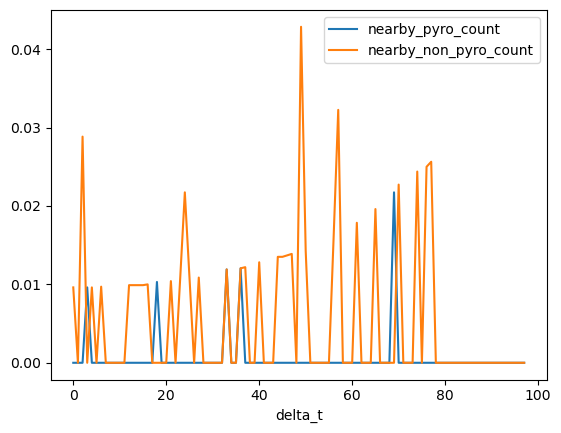

('NK 1:1_A549WT', np.False_)


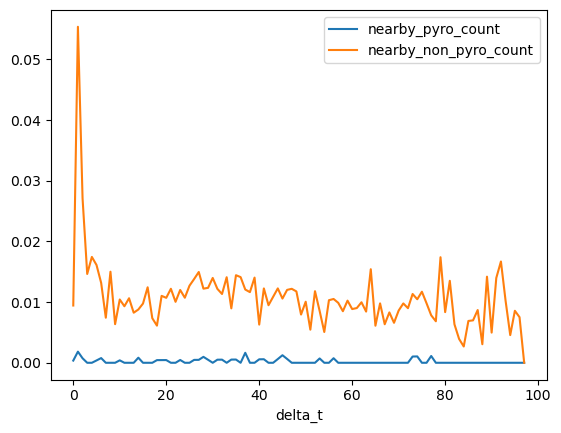

('NK 1:1_A549WT', np.True_)


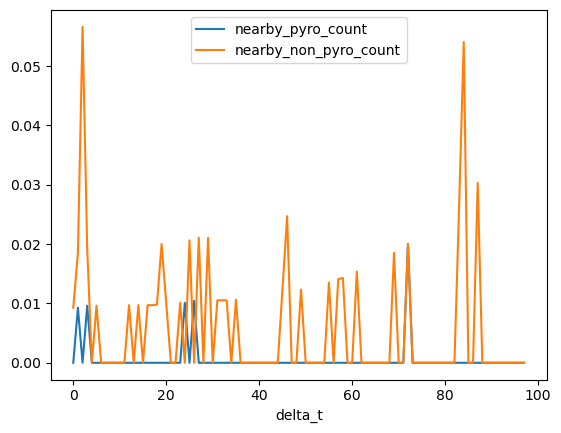

('mock_A549 GasD KO', np.False_)


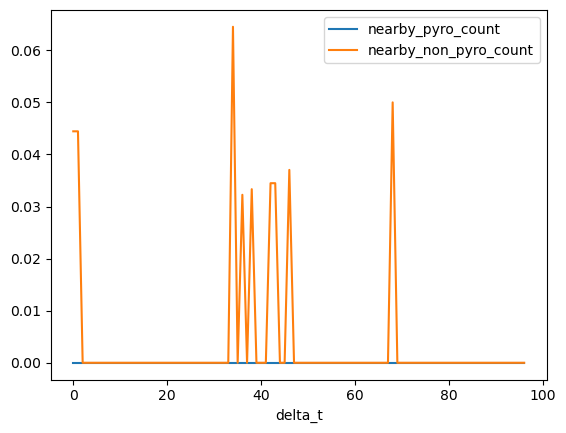

('mock_A549 GasD KO', np.True_)


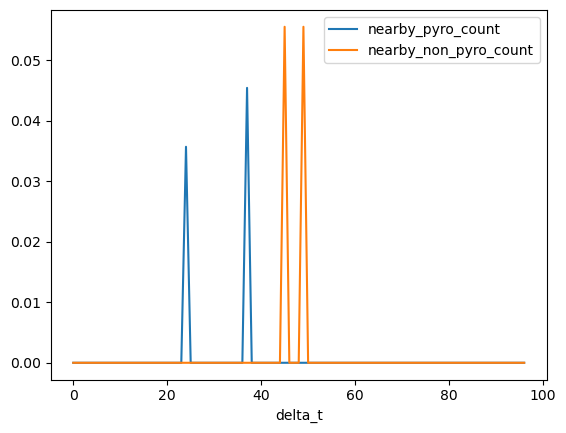

('mock_A549 GasE KO', np.False_)


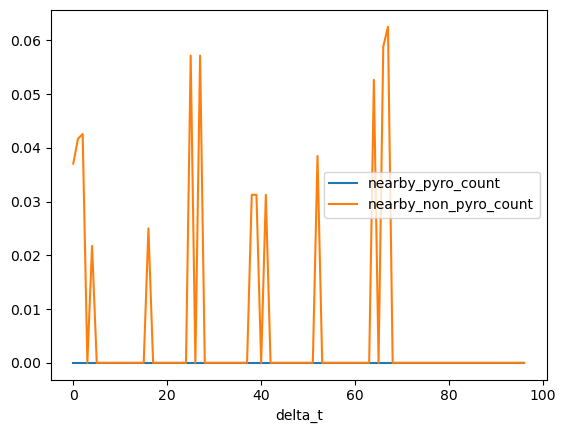

('mock_A549 GasE KO', np.True_)


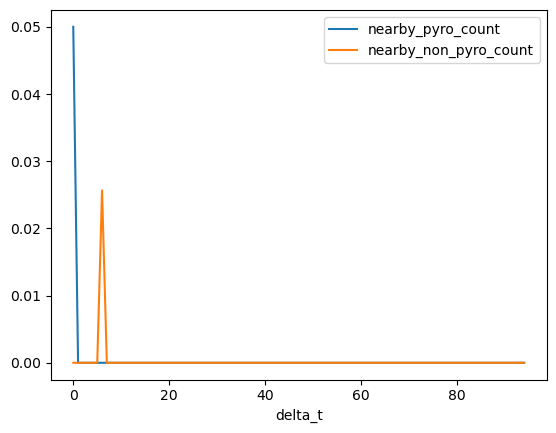

('mock_A549WT', np.False_)


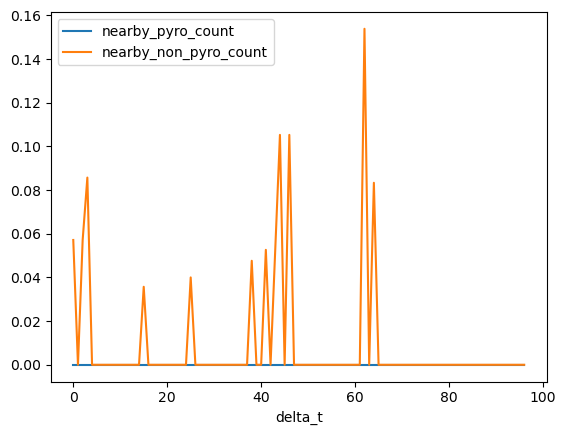

('mock_A549WT', np.True_)


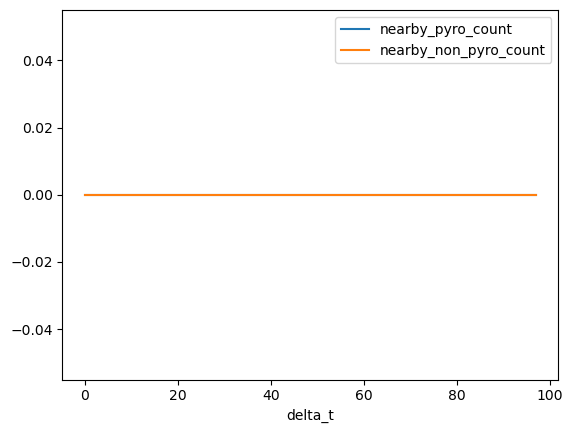

('pIC 0,1_A549 GasD KO', np.False_)


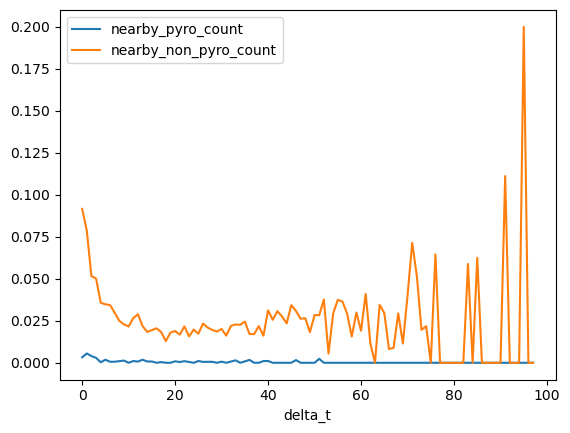

('pIC 0,1_A549 GasD KO', np.True_)


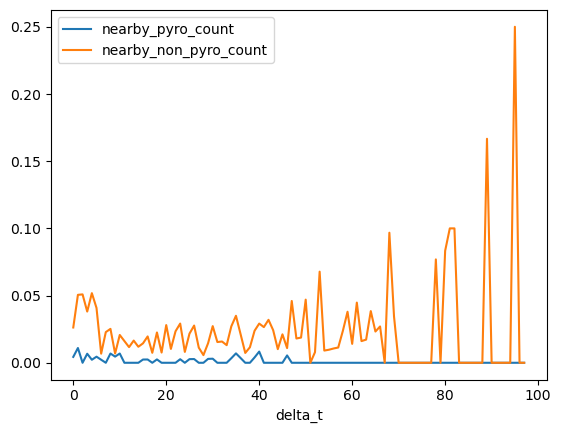

('pIC 0,1_A549 GasE KO', np.False_)


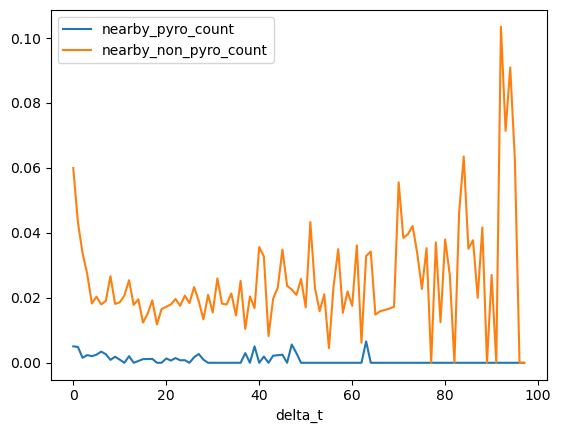

('pIC 0,1_A549 GasE KO', np.True_)


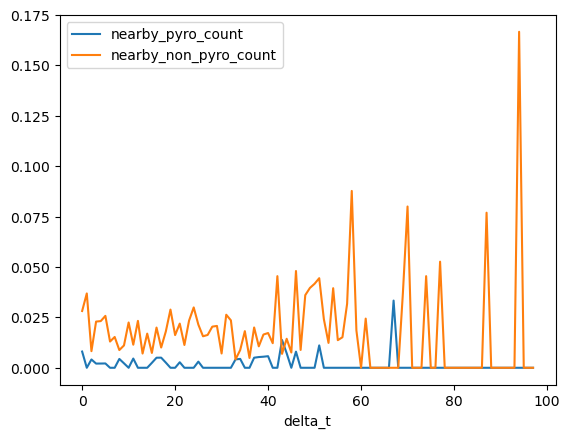

('pIC 0,1_A549WT', np.False_)


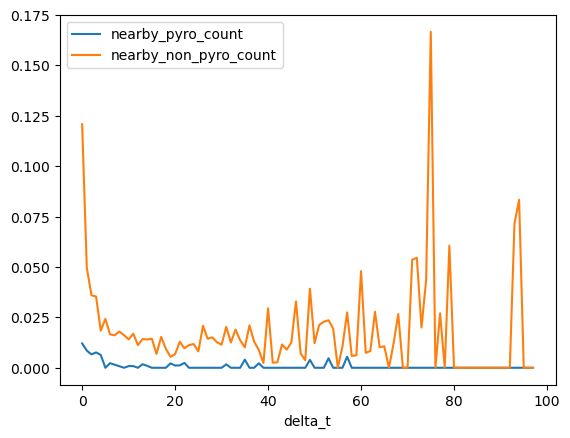

('pIC 0,1_A549WT', np.True_)


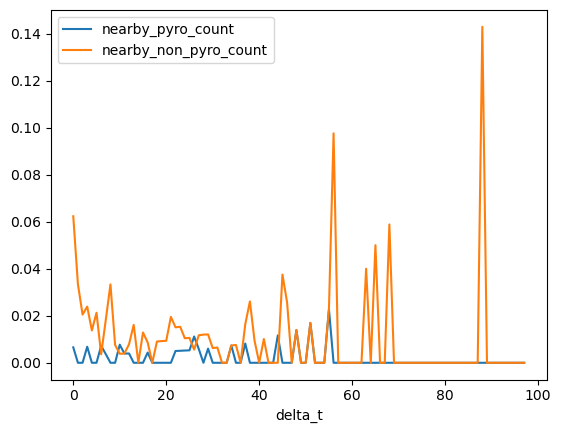

In [142]:
for c, group in dt.groupby(['condition', 'is_pyro']):
    print(c)
    group.groupby('delta_t')[['nearby_pyro_count','nearby_non_pyro_count']].mean().plot()
    plt.show()

# Live image NK and pyroptosis

In [2]:
import pandas as pd
df = pd.read_csv("~/Documents/pyroptosis-annotation/classification/binary_tracks_NKlive_exps.csv")

/tmp/ipykernel_464172/2610180321.py:2: DtypeWarning: Columns (10,172) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("~/Documents/pyroptosis-annotation/classification/binary_tracks_NKlive_exps.csv")


In [3]:
df = df[df.isna().any(axis=1)].dropna(axis=1)


In [24]:
!pip install -e /mnt/nas/operetta/pkaczyns/code/segment-track-nuclei/

Obtaining file:///mnt/nas/operetta/pkaczyns/code/segment-track-nuclei
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for segment-track-nuclei (pyproject.toml) ... done
  Created wheel for segment-track-nuclei: filename=segment_track_nuclei-0.1.0-0.editable-py3-none-any.whl size=2920 sha256=fd38b1b8c30b16b1ed8aa6466bb5734bf465d4db2c7b6c614cfc9204ca281f2f
  Stored in directory: /tmp/pip-ephem-wheel-cache-i_9tqysa/wheels/86/fb/72/143d705f658f5bbe620492e674b5faee30381eeca3339f4ee8
Successfully built segment-track-nuclei
  Attempting uninstall: segment-track-nuclei
    Found existing installation: segment-track-nuclei 0.1.0
    Uninstalling segment-track-nuclei-0.1.0:
      Successfully uninstalled segment-track-nuclei-0.1.0


In [12]:
import numpy as np
df['label'] = np.exp(df['label1'])/(np.exp(df['label0'])+np.exp(df['label1']))

In [7]:
df['well'] = df['well'].apply(lambda x: '0'+str(x))

In [9]:
from segment_track_nuclei.utils import extract_wells_info
info_list = []
for exp in df.experiment.unique():
    wells_info = extract_wells_info(exp)
    wells_info['experiment'] = exp
    info_list.append(wells_info)
df = df.merge(pd.concat(info_list), on=['well', 'experiment'])

In [6]:
df.columns = ['track_index', 'time_point_index', 'nucleus_id', 'area', 'area_masked',
       'eccentricity', 'is_toggled', 'center_x', 'center_y', 'track_length', 'experiment', 'well', 'x', 'y',
       'label0', 'label1']

In [13]:
df['label_bin'] = df.label>0.5

In [39]:
df

,track_index,time_point_index,nucleus_id,area,area_masked,eccentricity,is_toggled,center_x,center_y,track_length,...,y,label0,label1,label,,,Virus,CellType1,CellType2,label_bin
0,0,0,368,364.5,0.0,0.056,0,4107.96,276.23,310,...,276,2.417999,-3.148560,0.003809,2,2,mock,A549 WT H2B-miRFP703,mock,False
1,0,1,381,378.5,0.0,0.025,0,4107.42,280.12,310,...,280,2.535954,-3.378983,0.002692,2,2,mock,A549 WT H2B-miRFP703,mock,False
2,0,2,400,381.0,0.0,0.034,0,4108.01,282.59,310,...,282,1.670693,-2.730659,0.012112,2,2,mock,A549 WT H2B-miRFP703,mock,False
3,0,3,405,378.0,0.0,0.023,0,4107.95,286.07,310,...,286,1.429653,-2.212965,0.025516,2,2,mock,A549 WT H2B-miRFP703,mock,False
4,0,4,402,380.5,0.0,0.040,0,4107.36,287.22,310,...,287,2.061371,-2.797119,0.007702,2,2,mock,A549 WT H2B-miRFP703,mock,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9966848,15567,16,12,24.0,0.0,0.080,0,297.00,2437.00,1,...,2437,2.585585,-5.235146,0.000401,3,5,"IAV 0,1 MS4",A549 IFNGR KO H2B-miRFP703,NK 1:1,False
9966849,15568,61,173,156.0,0.0,0.050,0,2118.26,651.16,1,...,651,-1.485526,0.335795,0.860725,3,5,"IAV 0,1 MS4",A549 IFNGR KO H2B-miRFP703,NK 1:1,True
9966850,15569,76,7,182.0,0.0,0.289,0,916.34,2593.99,1,...,2593,-0.659105,-1.198122,0.368416,3,5,"IAV 0,1 MS4",A549 IFNGR KO H2B-miRFP703,NK 1:1,False
9966851,15570,7,107,30.0,0.0,0.116,0,1991.50,419.00,1,...,419,2.103270,-3.537052,0.003539,3,5,"IAV 0,1 MS4",A549 IFNGR KO H2B-miRFP703,NK 1:1,False


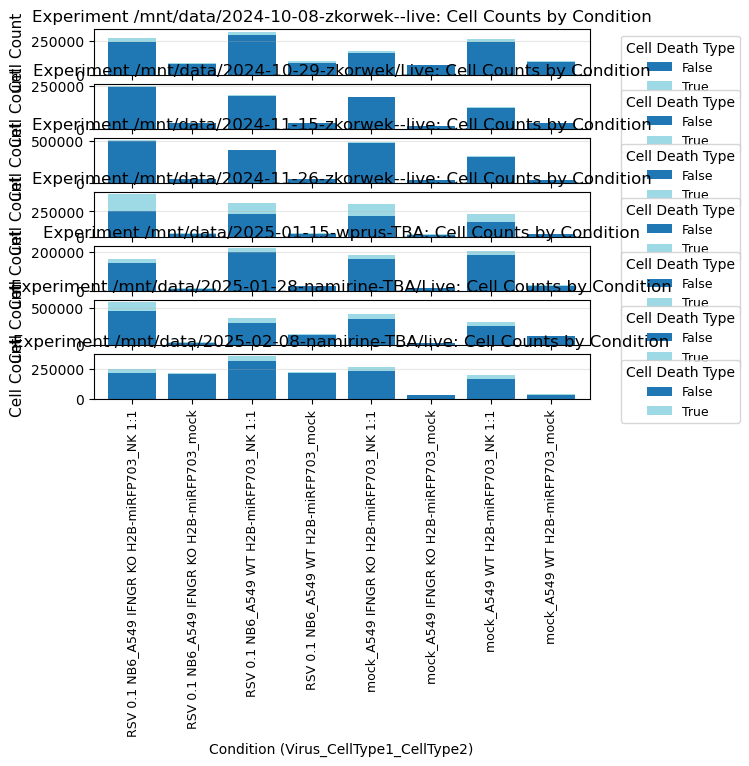

In [43]:
import matplotlib.pyplot as plt
experiments = sorted(df['experiment'].unique())
n_experiments = len(experiments)
fig, axes = plt.subplots(n_experiments, 1, sharex=True)


for idx, exp in enumerate(experiments):
    exp_data = df[df['experiment'] == exp].copy()
    exp_data['condition'] = (exp_data['Virus'].astype(str) + '_' + 
                                exp_data['CellType1'].astype(str) + '_' + 
                                exp_data['CellType2'].astype(str))
    
    counts = exp_data.groupby(['condition', 'label_bin']).size().reset_index(name='count')
    pivot_data = counts.pivot(index='condition', columns='label_bin', values='count')
    pivot_data = pivot_data.fillna(0).sort_index()
    
    pivot_data.plot(kind='bar', stacked=True, ax=axes[idx], 
                    colormap='tab20', width=0.8)
    
    axes[idx].set_title(f'Experiment {exp}: Cell Counts by Condition')
    axes[idx].set_xlabel('Condition (Virus_CellType1_CellType2)')
    axes[idx].set_ylabel('Cell Count', fontsize=11)
    axes[idx].legend(title='Cell Death Type', bbox_to_anchor=(1.05, 1), 
                    loc='upper left', fontsize=9)
    axes[idx].tick_params(axis='x', rotation=90, labelsize=9)
    axes[idx].yaxis.grid(True, alpha=0.3)
    
    del exp_data, counts, pivot_data



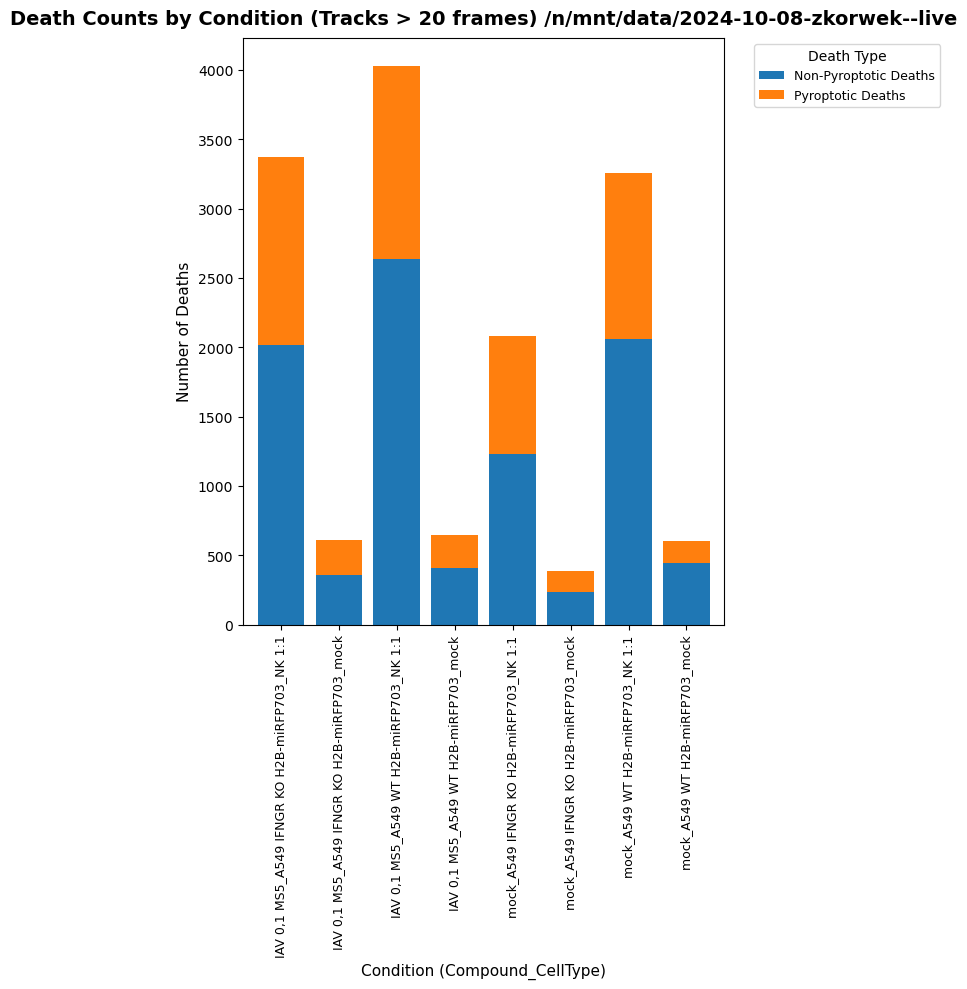

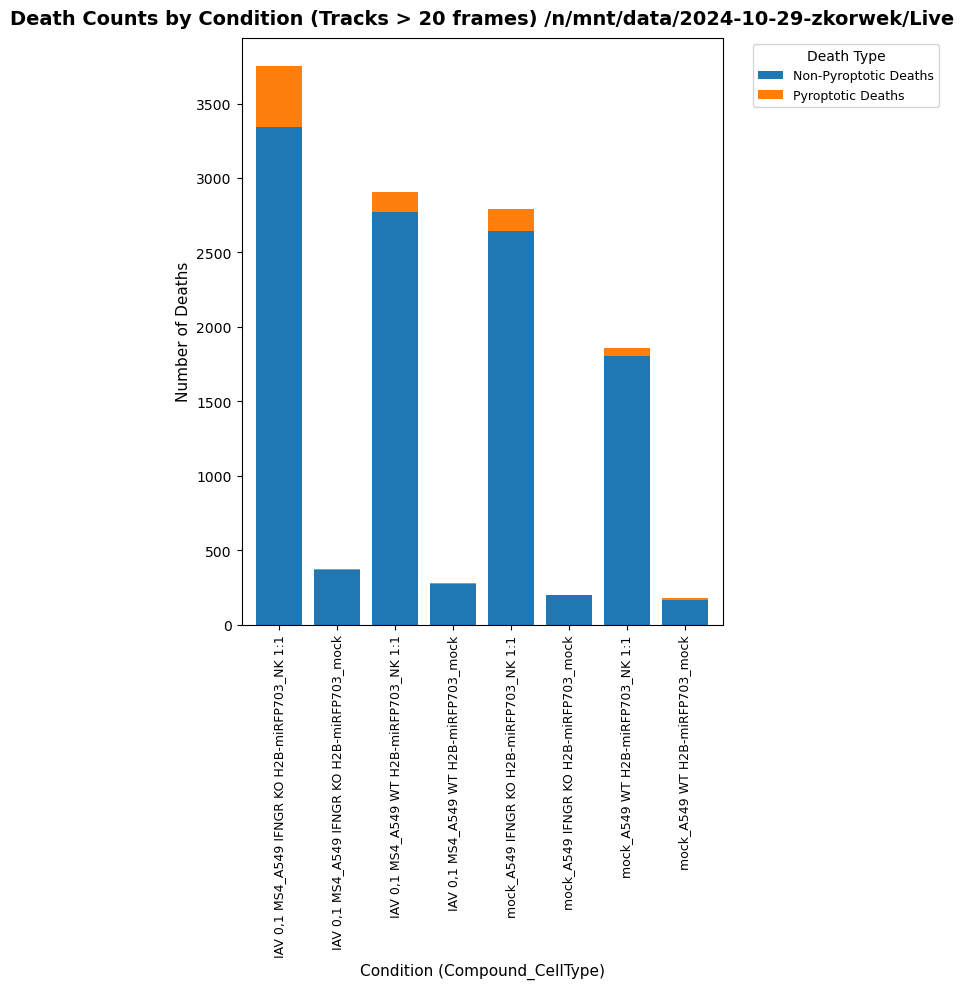

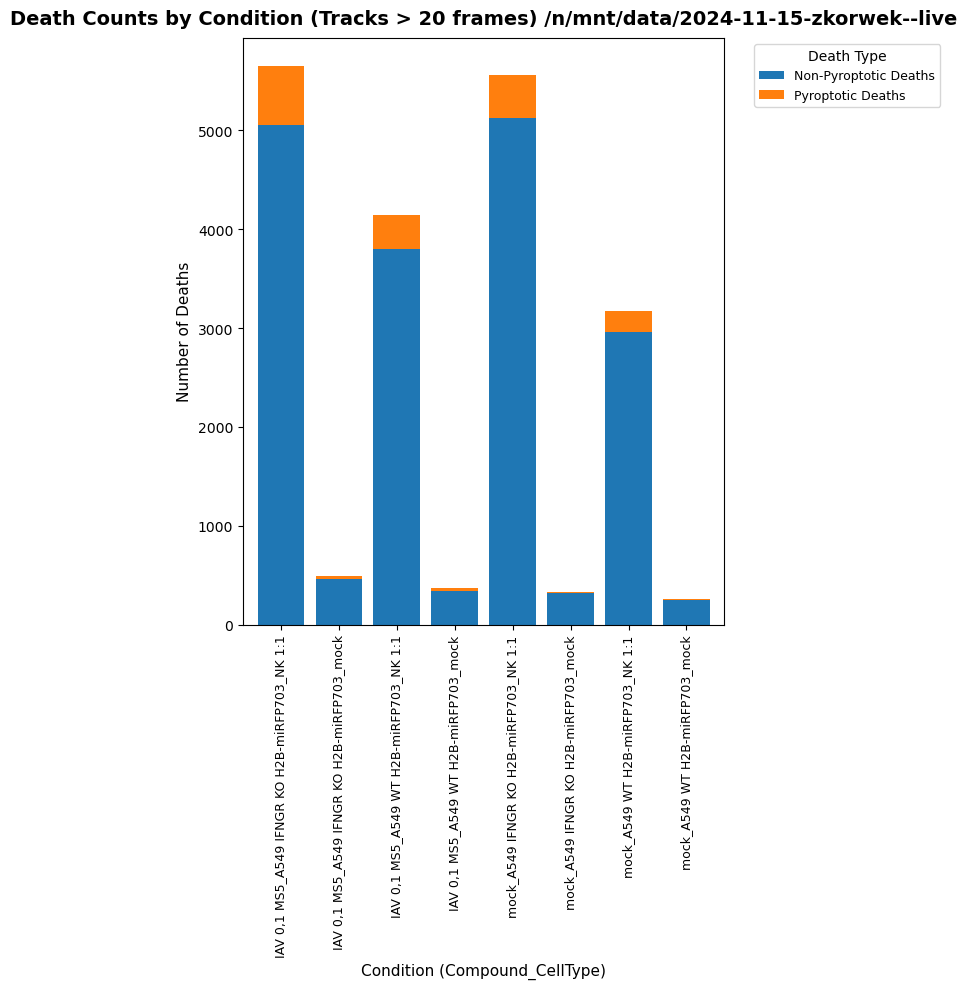

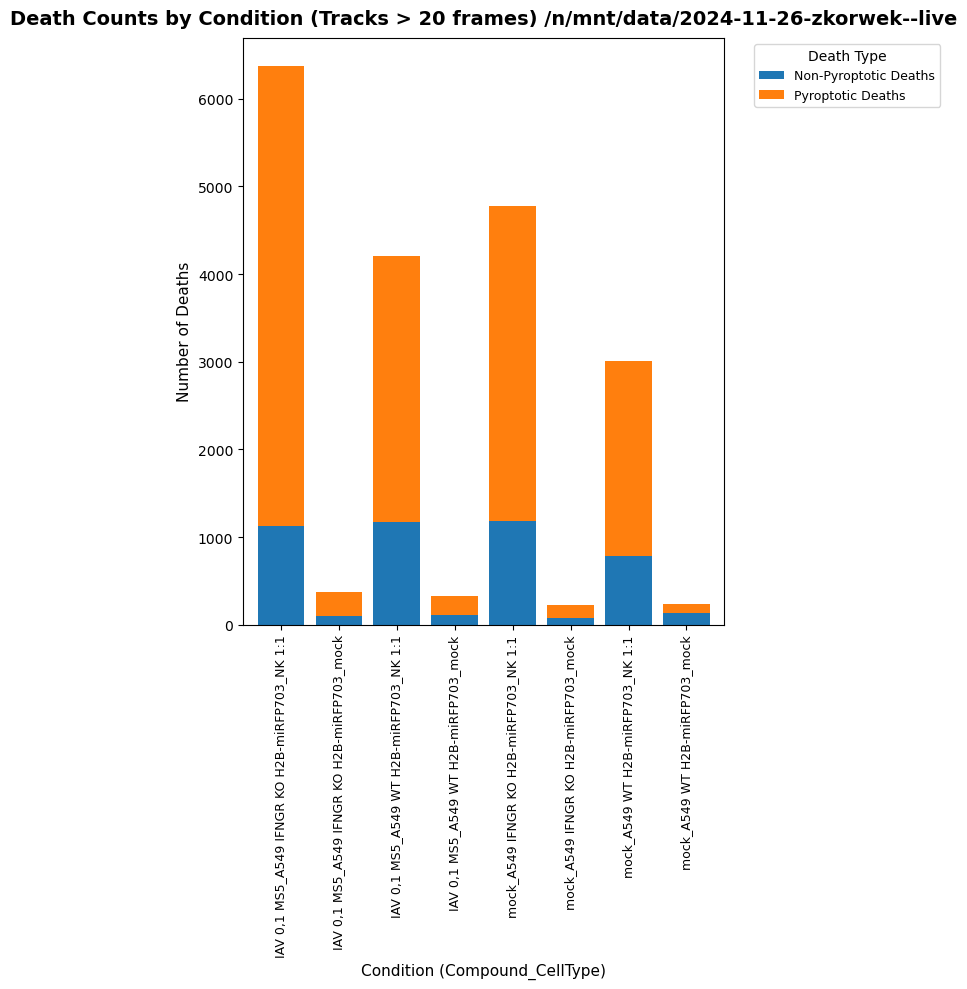

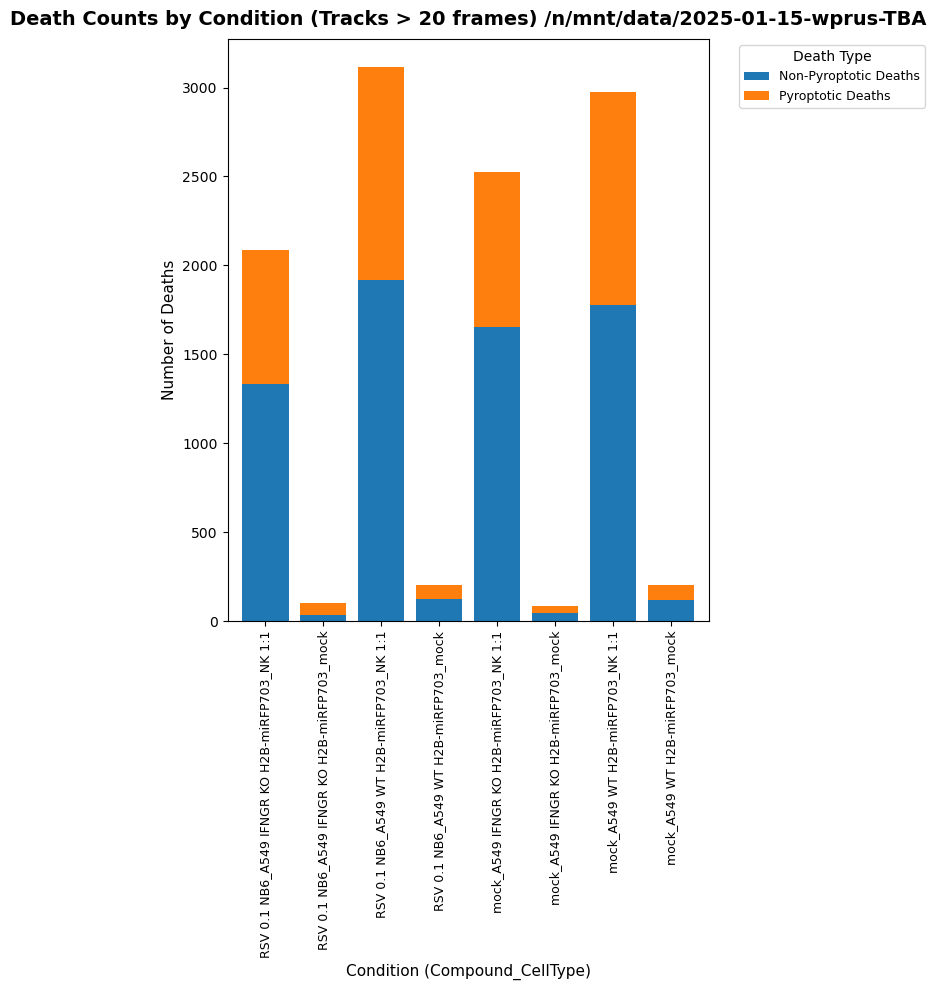

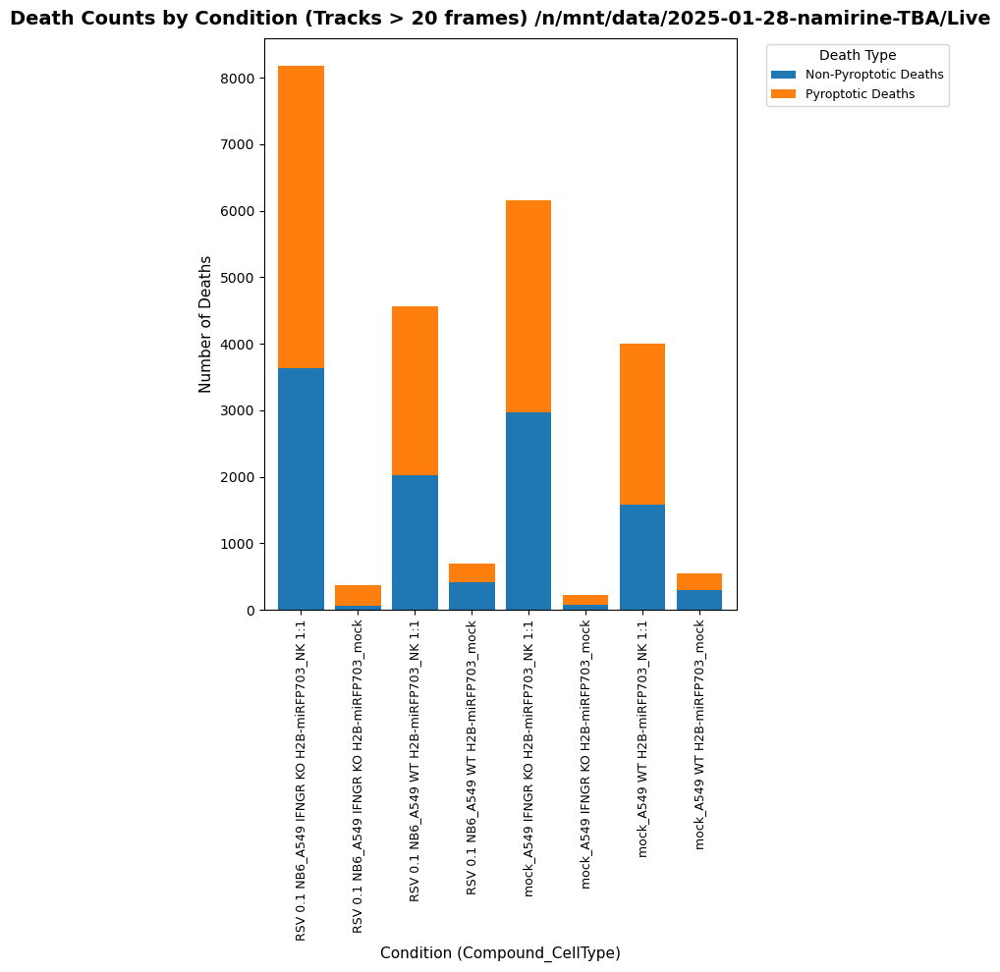

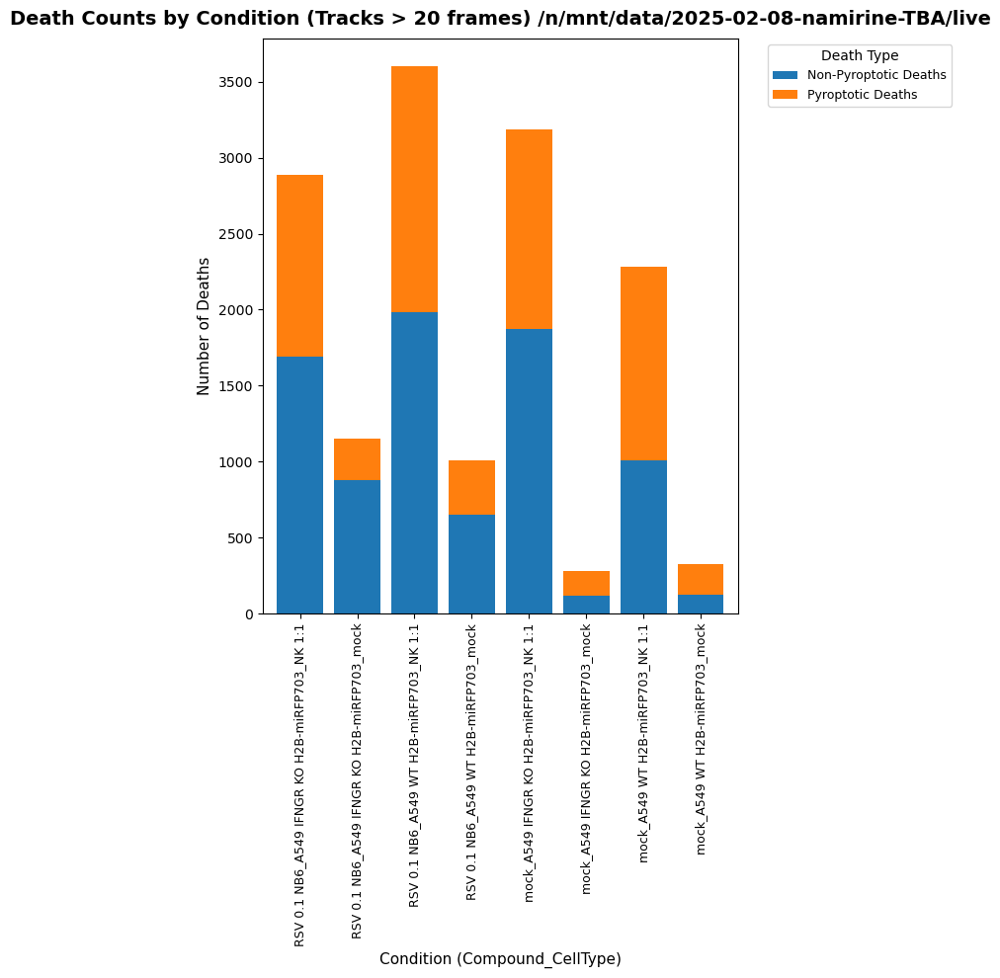

In [22]:
import matplotlib.pyplot as plt

# Filter for tracks longer than 20
for exp, dfbin_filtered in df[df['track_length'] > 20].groupby('experiment'):
    dfbin_filtered = dfbin_filtered.groupby(['Virus', 'CellType2', 'CellType1', 'track_index']).filter(lambda x: x['time_point_index'].min()!=0)

    # First, identify wells with any pyroptotic death across all timeframes
    pyroptotic_wells = dfbin_filtered.groupby(['Virus', 'CellType2', 'CellType1', 'track_index'])['label'].apply(
        lambda x: sum(x > 0.5)>3#(x > 0.5).any()
    ).reset_index()

    # Count pyroptotic deaths per condition (Compound + Cell Type)
    pyroptotic_counts = pyroptotic_wells.groupby(['Virus', 'CellType2', 'CellType1',])['label'].sum().reset_index()
    pyroptotic_counts.rename({'label': 'Pyroptotic Deaths'}, axis=1, inplace=True)
    #pyroptotic_counts.columns = ['Virus', 'CellType2', 'CellType1', 'Pyroptotic Deaths']

    # Count total deaths (all unique tracks per condition)
    total_counts = dfbin_filtered.groupby(['Virus', 'CellType2', 'CellType1'])['track_index'].nunique().reset_index()
    total_counts.rename({'track_index': 'Total Deaths'}, axis=1, inplace=True)
    #total_counts.columns = ['Virus', 'CellType2', 'CellType1', 'Total Deaths']

    # Merge the data
    merged = total_counts.merge(pyroptotic_counts, on=['Virus', 'CellType2', 'CellType1'])

    # Calculate non-pyroptotic deaths
    merged['Non-Pyroptotic Deaths'] = merged['Total Deaths'] - merged['Pyroptotic Deaths']

    # Create condition labels
    merged['Condition'] = merged['Virus'] + '_' + merged['CellType1'] + '_' + merged['CellType2']
    merged = merged.set_index('Condition').sort_index()

    # Create stacked bar chart
    fig, ax = plt.subplots(figsize=(8, 10))

    # Plot stacked bars
    merged[['Non-Pyroptotic Deaths', 'Pyroptotic Deaths']].plot(
        kind='bar', 
        stacked=True, 
        ax=ax,
        color=['#1f77b4', '#ff7f0e'],  # Blue for non-pyroptotic, orange for pyroptotic
        width=0.8
    )

    plt.title('Death Counts by Condition (Tracks > 20 frames) /n'+exp, fontsize=14, fontweight='bold', pad=10)
    plt.xlabel('Condition (Compound_CellType)', fontsize=11)
    plt.ylabel('Number of Deaths', fontsize=11)
    plt.legend(title='Death Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    plt.tick_params(axis='x', rotation=90, labelsize=9)
    plt.tight_layout()
    plt.show()

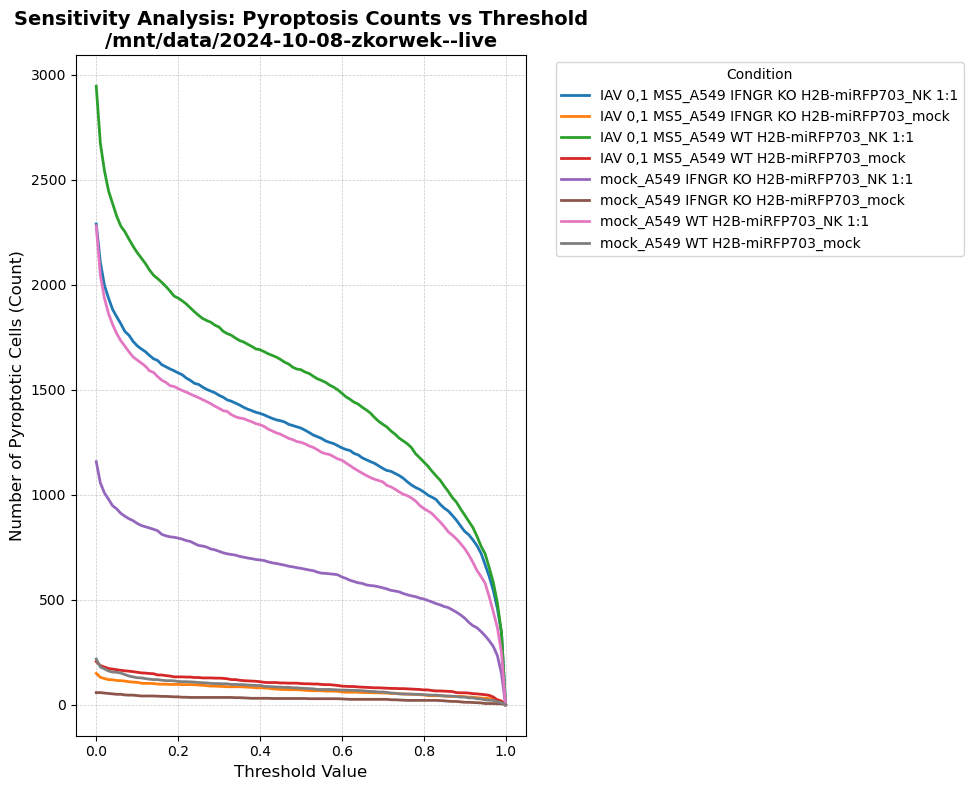

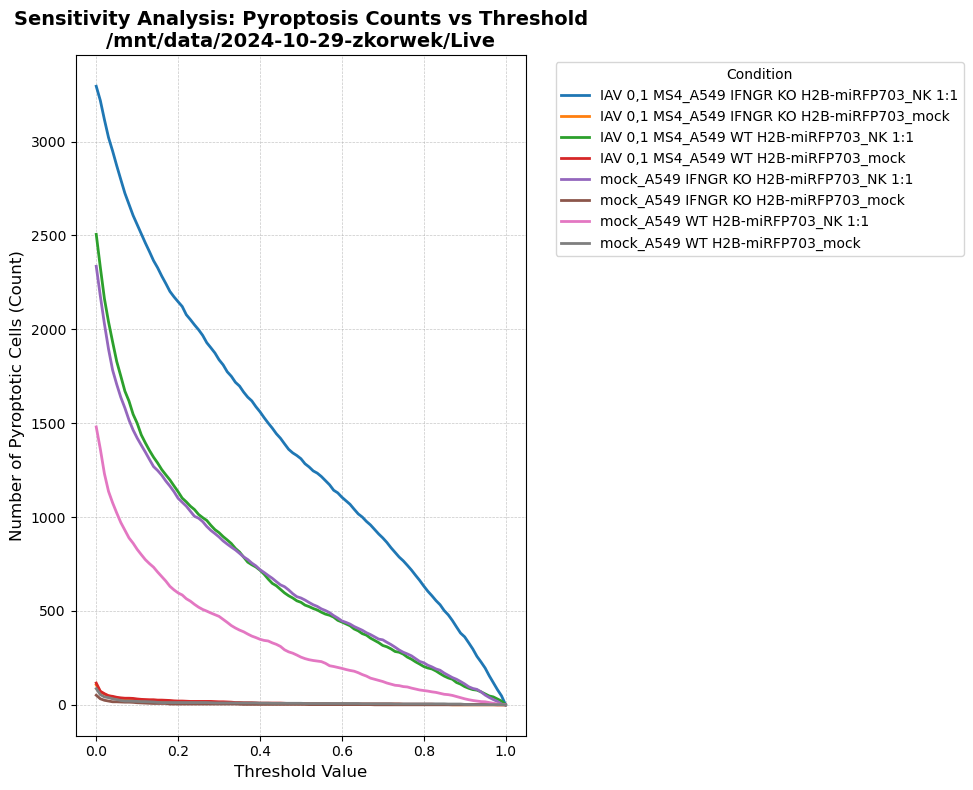

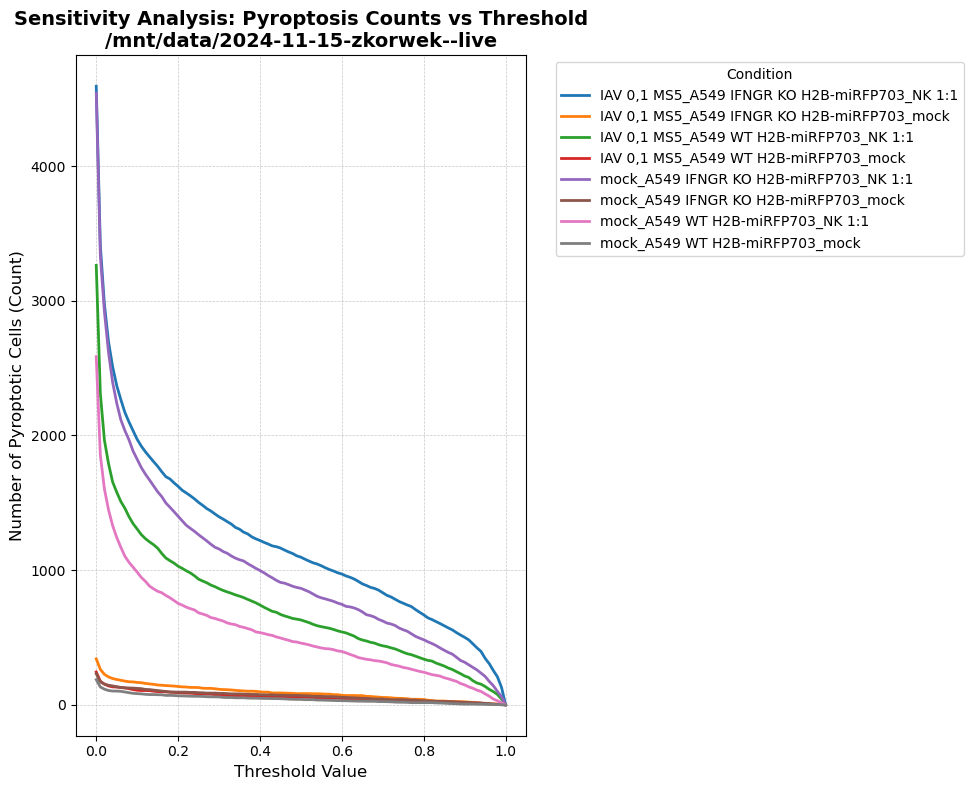

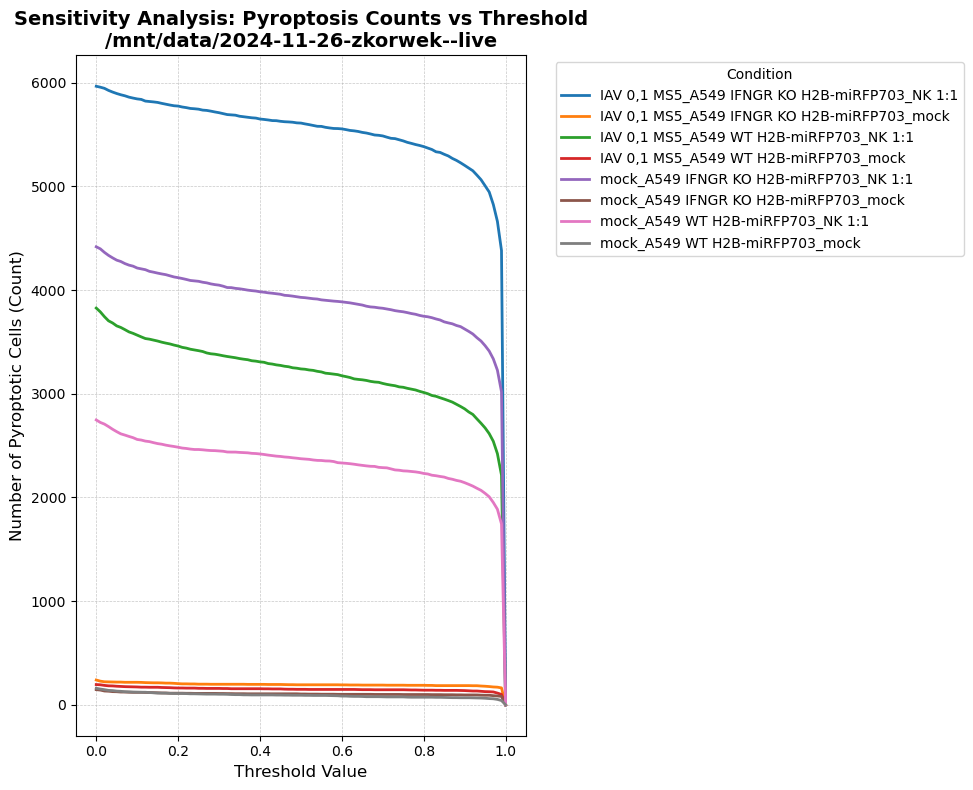

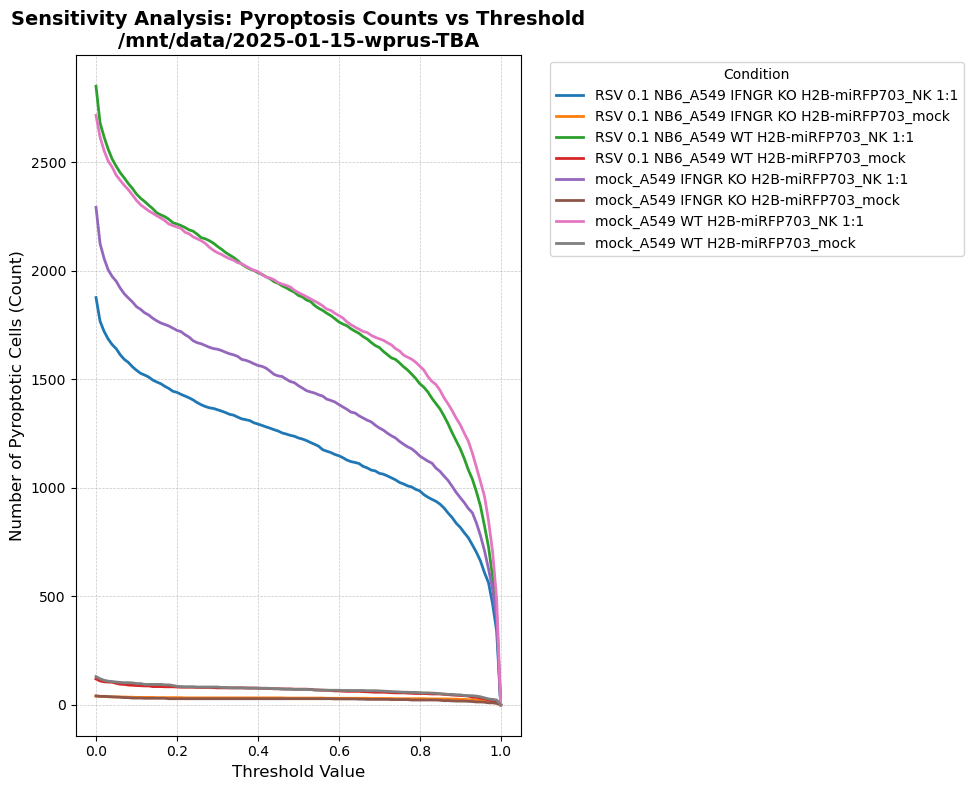

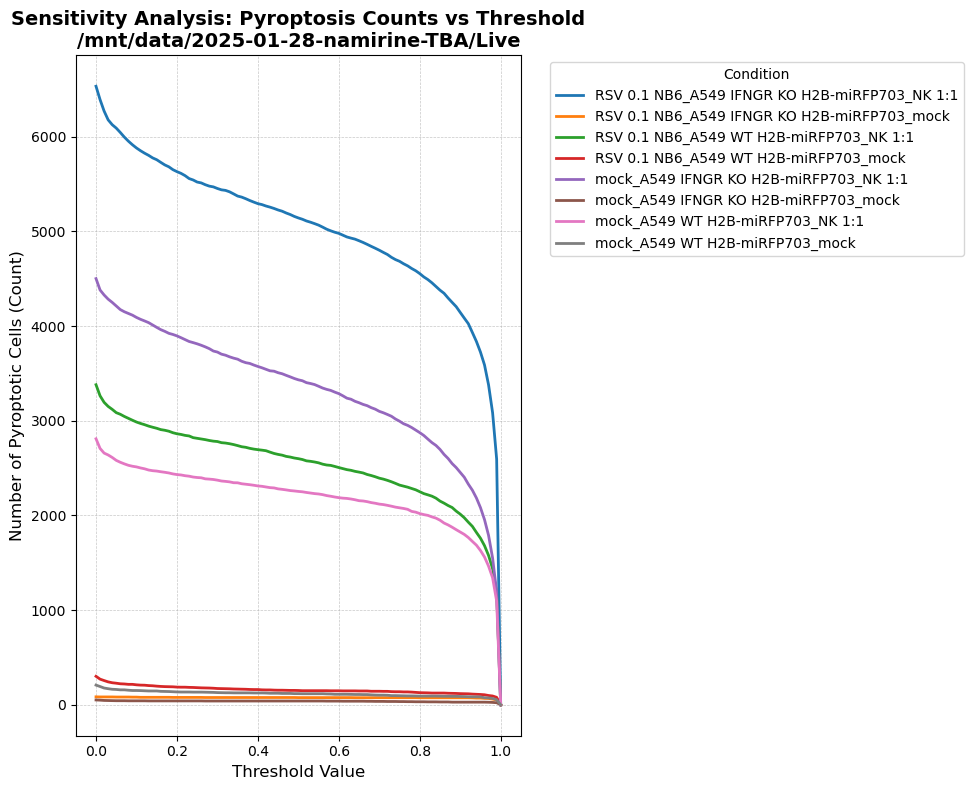

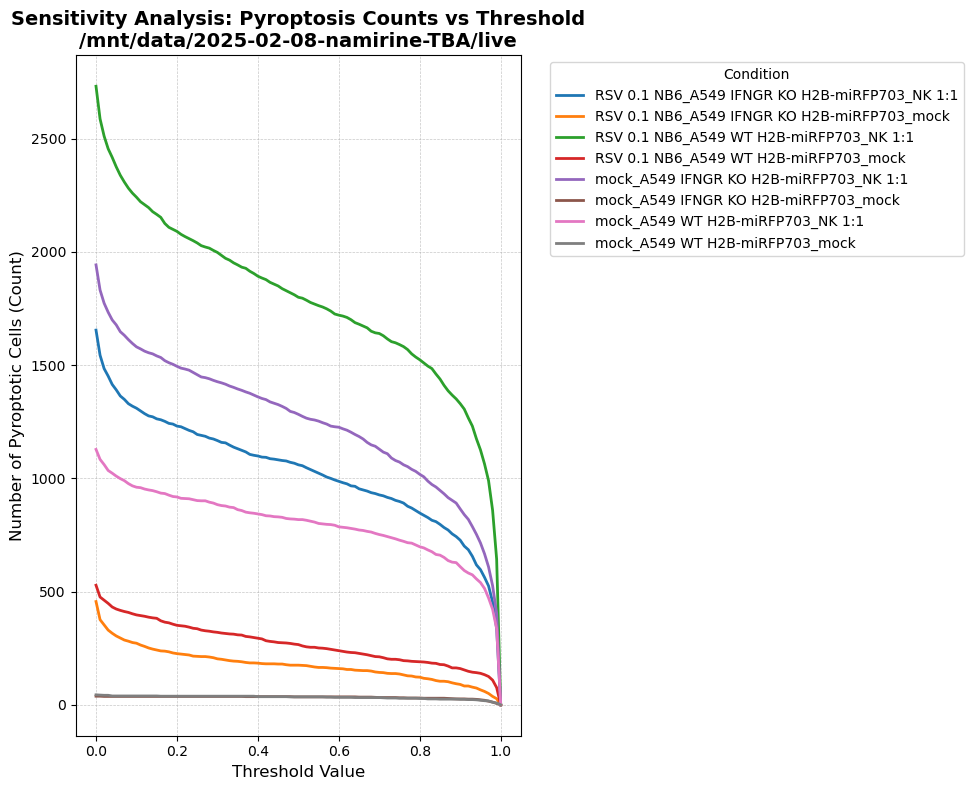

In [23]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Define the range of thresholds to test (e.g., from 0.0 to 1.0 with a step of 0.01)
threshold_range = np.linspace(0, 1, 101)

# Pre-filter for track length to avoid doing it inside the loop
df_long_tracks = df[df['track_length'] > 20].copy()

for exp, df_exp in df_long_tracks.groupby('experiment'):
    
    # --- 1. Efficient Filtering ---
    # Identify tracks that start at time_point_index 0 (to remove them)
    # This is much faster than .filter(lambda x: x['time_point_index'].min() != 0)
    tracks_starting_at_0 = df_exp[df_exp['time_point_index'] == 0]['track_index'].unique()
    
    # Filter the dataframe to exclude those tracks
    df_filtered = df_exp[~df_exp['track_index'].isin(tracks_starting_at_0)].copy()

    # --- 2. Aggregate Data per Track ---
    # To determine if a cell dies, we only need its MAXIMUM label score.
    # If max(label) > threshold, it counts as a death.
    track_max_scores = df_filtered.groupby(['Virus', 'CellType2', 'CellType1', 'track_index'])['label'].max().reset_index()
    track_max_scores.rename(columns={'label': 'max_score'}, inplace=True)

    # Create the Condition column
    track_max_scores['Condition'] = track_max_scores['Virus'] + '_' + track_max_scores['CellType1'] + '_' + track_max_scores['CellType2']

    # --- 3. Calculate Counts for Each Threshold ---
    plot_data = []
    unique_conditions = track_max_scores['Condition'].unique()

    for t in threshold_range:
        # Get tracks that are considered pyroptotic at this specific threshold
        pyroptotic_tracks = track_max_scores[track_max_scores['max_score'] > t]
        
        # Count them by condition
        counts = pyroptotic_tracks['Condition'].value_counts()
        
        # Append data for all conditions (even if count is 0)
        for cond in unique_conditions:
            plot_data.append({
                'Threshold': t,
                'Condition': cond,
                'Pyroptotic Count': counts.get(cond, 0) # Default to 0 if not found
            })

    # Create a DataFrame for plotting
    plot_df = pd.DataFrame(plot_data)

    # --- 4. Plotting ---
    fig, ax = plt.subplots(figsize=(10, 8))

    # Iterate through conditions to plot a line for each
    for condition, data in plot_df.groupby('Condition'):
        ax.plot(data['Threshold'], data['Pyroptotic Count'], label=condition, linewidth=2)

    plt.title(f'Sensitivity Analysis: Pyroptosis Counts vs Threshold\n{exp}', fontsize=14, fontweight='bold')
    plt.xlabel('Threshold Value', fontsize=12)
    plt.ylabel('Number of Pyroptotic Cells (Count)', fontsize=12)
    
    # Add grid for easier reading
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    
    # Legend settings
    plt.legend(title='Condition', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    
    plt.tight_layout()
    plt.show()

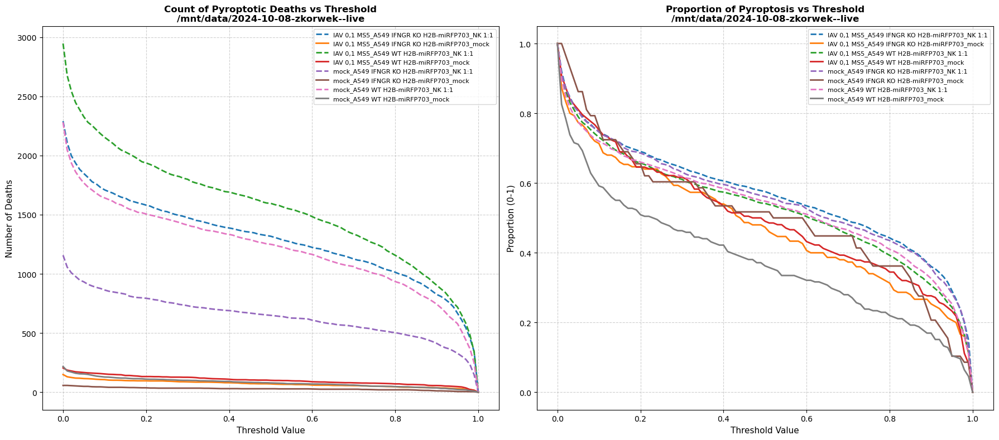

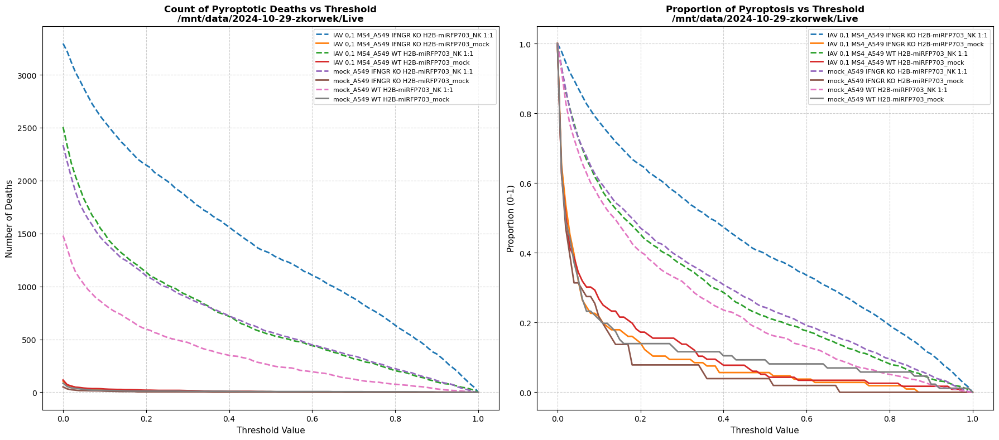

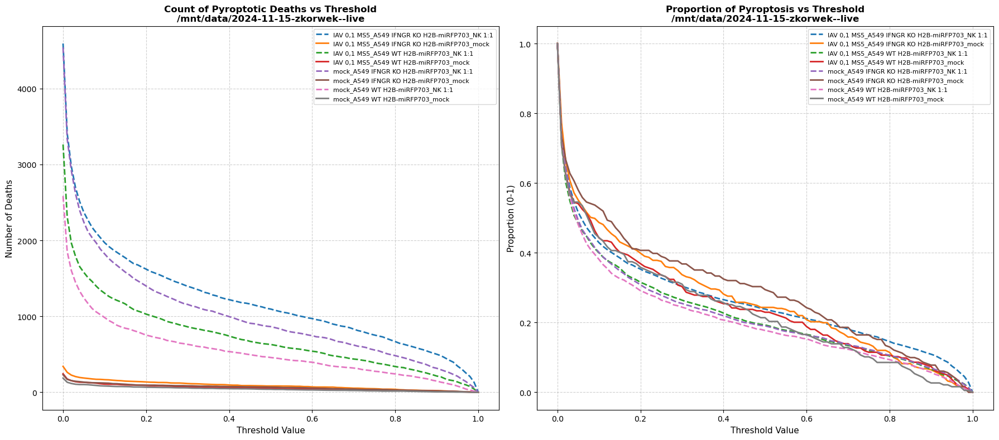

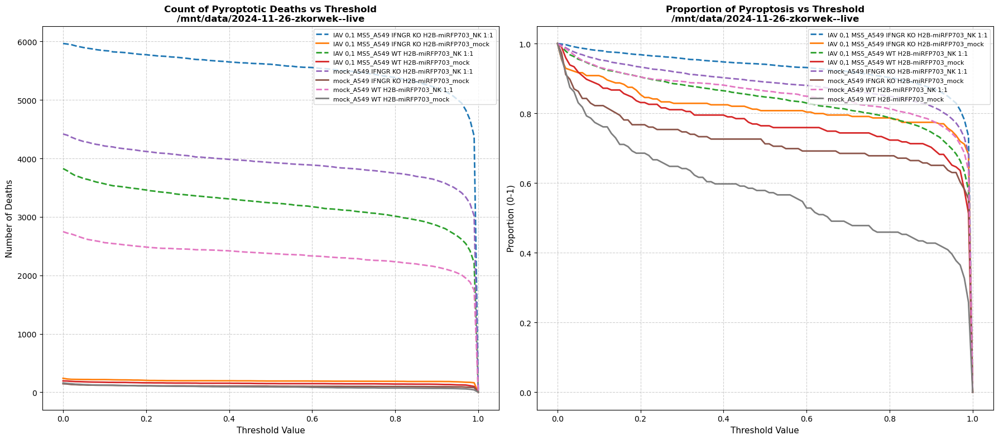

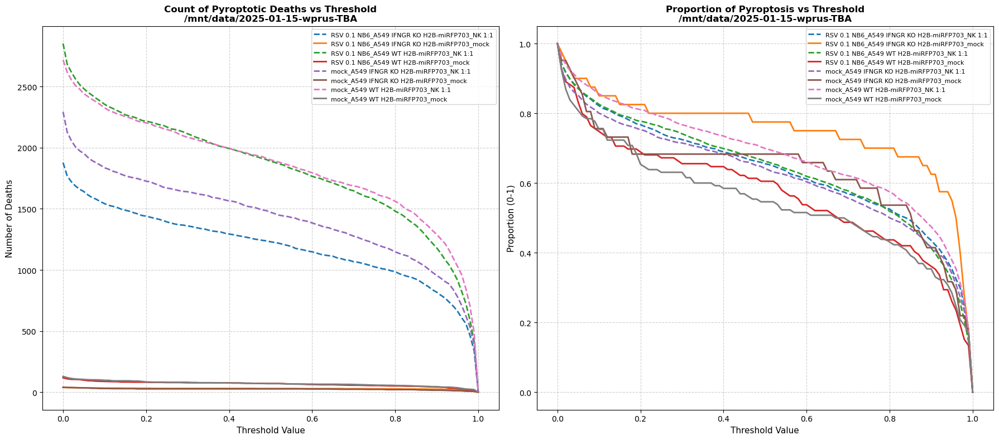

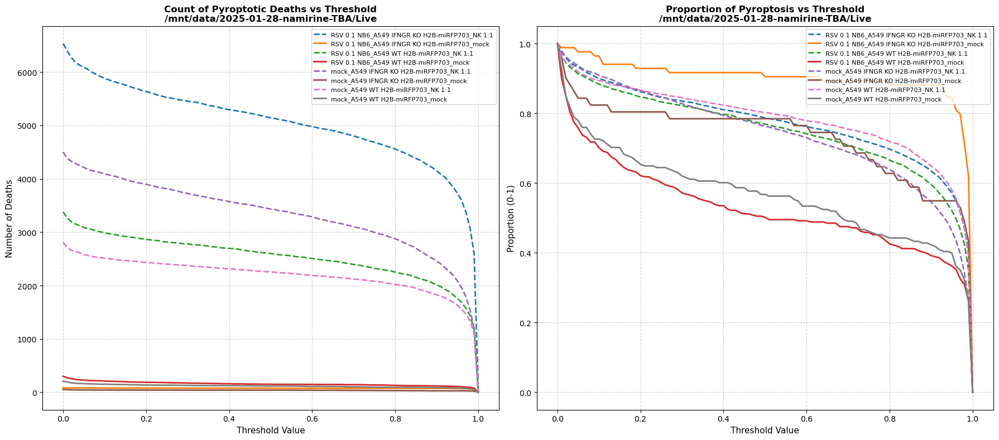

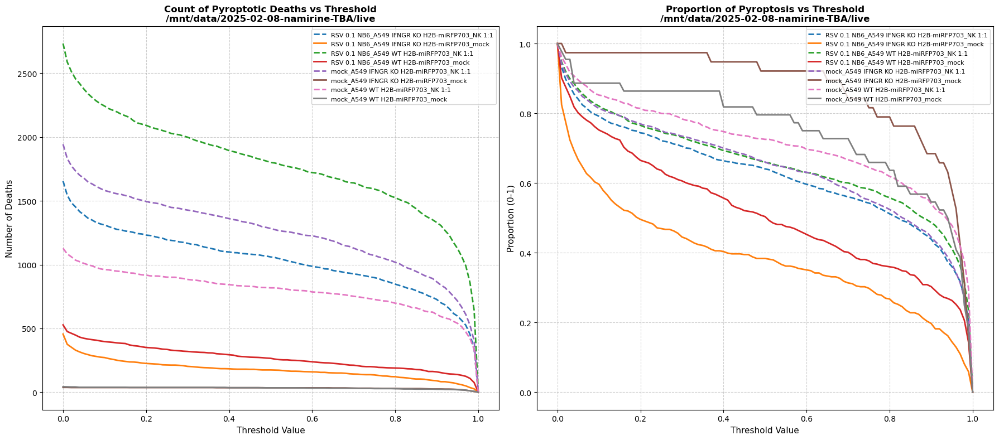

In [26]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Define threshold range
threshold_range = np.linspace(0, 1, 101)

# Pre-filter for track length
df_long_tracks = df[df['track_length'] > 20].copy()

for exp, df_exp in df_long_tracks.groupby('experiment'):
    
    # --- 1. Filter tracks starting at t=0 ---
    tracks_starting_at_0 = df_exp[df_exp['time_point_index'] == 0]['track_index'].unique()
    df_filtered = df_exp[~df_exp['track_index'].isin(tracks_starting_at_0)].copy()

    # --- 2. Aggregate Data per Track ---
    # Group by all condition columns + track_index to keep metadata
    track_max_scores = df_filtered.groupby(['Virus', 'CellType2', 'CellType1', 'track_index'])['label'].max().reset_index()
    track_max_scores.rename(columns={'label': 'max_score'}, inplace=True)

    # Create Condition String
    track_max_scores['Condition'] = track_max_scores['Virus'] + '_' + track_max_scores['CellType1'] + '_' + track_max_scores['CellType2']

    # --- 3. Calculate Total Deaths (Denominator) ---
    total_deaths_per_condition = track_max_scores['Condition'].value_counts()
    
    # Create a mapping of Condition -> CellType2 for style logic later
    # (This is safer than splitting the string if names have underscores)
    condition_metadata = track_max_scores[['Condition', 'CellType2']].drop_duplicates().set_index('Condition')
    cond_to_celltype2 = condition_metadata['CellType2'].to_dict()

    # --- 4. Calculate Metrics for Each Threshold ---
    plot_data = []
    unique_conditions = track_max_scores['Condition'].unique()

    for t in threshold_range:
        # Tracks classified as pyroptotic at this threshold
        pyroptotic_tracks = track_max_scores[track_max_scores['max_score'] > t]
        
        # Counts per condition
        counts = pyroptotic_tracks['Condition'].value_counts()
        
        for cond in unique_conditions:
            n_pyro = counts.get(cond, 0)
            n_total = total_deaths_per_condition.get(cond, 0)
            
            proportion = (n_pyro / n_total) if n_total > 0 else 0
            
            plot_data.append({
                'Threshold': t,
                'Condition': cond,
                'Pyroptotic Count': n_pyro,
                'Pyroptotic Proportion': proportion
            })

    plot_df = pd.DataFrame(plot_data)

    # --- 5. Plotting Side-by-Side ---
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    
    # We loop through conditions to plot them one by one to control style
    for condition, group in plot_df.groupby('Condition'):
        
        # Determine Line Style
        ctype2 = cond_to_celltype2.get(condition, '')
        if ctype2 == 'NK 1:1':
            linestyle = '--' # Dashed for NK 1:1
        else:
            linestyle = '-'  # Solid for everything else
        
        # Plot 1: Raw Counts (Left Axis)
        axes[0].plot(group['Threshold'], group['Pyroptotic Count'], 
                     label=condition, linestyle=linestyle, linewidth=2)
        
        # Plot 2: Proportions (Right Axis)
        axes[1].plot(group['Threshold'], group['Pyroptotic Proportion'], 
                     label=condition, linestyle=linestyle, linewidth=2)

    # Formatting Left Plot (Counts)
    axes[0].set_title(f'Count of Pyroptotic Deaths vs Threshold\n{exp}', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Threshold Value', fontsize=11)
    axes[0].set_ylabel('Number of Deaths', fontsize=11)
    axes[0].grid(True, linestyle='--', alpha=0.6)
    axes[0].legend(fontsize=8, loc='upper right')

    # Formatting Right Plot (Proportions)
    axes[1].set_title(f'Proportion of Pyroptosis vs Threshold\n{exp}', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Threshold Value', fontsize=11)
    axes[1].set_ylabel('Proportion (0-1)', fontsize=11)
    axes[1].set_ylim(-0.05, 1.05)
    axes[1].grid(True, linestyle='--', alpha=0.6)
    axes[1].legend(fontsize=8, loc='upper right')

    plt.tight_layout()
    plt.show()

In [25]:
df

,track_index,time_point_index,nucleus_id,area,area_masked,eccentricity,is_toggled,center_x,center_y,track_length,...,y,label0,label1,,,Virus,CellType1,CellType2,label,label_bin
0,0,0,368,364.5,0.0,0.056,0,4107.96,276.23,310,...,276,2.417999,-3.148560,2,2,mock,A549 WT H2B-miRFP703,mock,0.003809,False
1,0,1,381,378.5,0.0,0.025,0,4107.42,280.12,310,...,280,2.535954,-3.378983,2,2,mock,A549 WT H2B-miRFP703,mock,0.002692,False
2,0,2,400,381.0,0.0,0.034,0,4108.01,282.59,310,...,282,1.670693,-2.730659,2,2,mock,A549 WT H2B-miRFP703,mock,0.012112,False
3,0,3,405,378.0,0.0,0.023,0,4107.95,286.07,310,...,286,1.429653,-2.212965,2,2,mock,A549 WT H2B-miRFP703,mock,0.025516,False
4,0,4,402,380.5,0.0,0.040,0,4107.36,287.22,310,...,287,2.061371,-2.797119,2,2,mock,A549 WT H2B-miRFP703,mock,0.007702,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9966848,15567,16,12,24.0,0.0,0.080,0,297.00,2437.00,1,...,2437,2.585585,-5.235146,3,5,"IAV 0,1 MS4",A549 IFNGR KO H2B-miRFP703,NK 1:1,0.000401,False
9966849,15568,61,173,156.0,0.0,0.050,0,2118.26,651.16,1,...,651,-1.485526,0.335795,3,5,"IAV 0,1 MS4",A549 IFNGR KO H2B-miRFP703,NK 1:1,0.860725,True
9966850,15569,76,7,182.0,0.0,0.289,0,916.34,2593.99,1,...,2593,-0.659105,-1.198122,3,5,"IAV 0,1 MS4",A549 IFNGR KO H2B-miRFP703,NK 1:1,0.368416,False
9966851,15570,7,107,30.0,0.0,0.116,0,1991.50,419.00,1,...,419,2.103270,-3.537052,3,5,"IAV 0,1 MS4",A549 IFNGR KO H2B-miRFP703,NK 1:1,0.003539,False


In [21]:
import numpy as np
df['label'] = np.exp(df['label1'])/(np.exp(df['label0'])+np.exp(df['label1']))